In [1601]:
import kwant
import matplotlib.pyplot as plt
import numpy as np
import dask.bag as db
from dask_quantumtinkerer import Cluster, cluster_options
import itertools as it
import pickle
import os
import sympy as sp
from scipy.signal import peak_widths
from matplotlib import cm
import matplotlib as mpl

import ccode.finite_system as tj
import ccode.tools as tl
import ccode.solvers as sl

import ccode.plotting as pt

%matplotlib inline
mpl.rcParams.update({'font.size': 16})

np.warnings.filterwarnings("ignore", category=np.VisibleDeprecationWarning)

a = 10e-9

titles = ['left-right', 'left-center', 'center-right']

In [559]:
options = cluster_options()
options.worker_cores = 1
options.worker_memory = 2
options.extra_path = "/home/jtorresluna/trijunction_design/"

# Triangular geometry with wires at one side

## Set up parameters

In [2569]:
area = 900*a**2
w = 7*a
geometry = {
    "l": 130*a,
    "w": w,
    "a": a,
    "side": 'down',
    "shape": 'triangle',
    "A": area
}

In [2570]:
n_geometries = 50
angles = np.linspace(0.05, 0.3, n_geometries)

In [2571]:
mus_qd = np.linspace(-0.002, 0.002, 200)
key = 'mu_qd'
n = 6
directory_path = '../data/manuscript/triangle_angles_one_side/'

## Analyse results

In [2459]:
geometries = angles
geometry_parameter = r'$\theta[\pi]$'

In [2460]:
n_peaks = 30
prominence = 1e-6
width = 1
height = 0
peaks_kwargs = {'prominence': prominence, 'width': width, 'height': height}

In [2461]:
index = 0
# open raw simulation result
file = 'area_1200_band_'+str(index)+'th.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)

In [2462]:
limit = 2e-3

geometries_couplings = []
geometries_peaks = []
geometries_averages = []
geometries_widths = []

data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
for geometry in data_geometries:
    couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
    geometries_couplings.append(couplings)
    geometries_peaks.append(peaks)
    widths = []
    averaged_peaks = []
    for i in range(3):
        #peaks[i] = peaks[i][mus_qd[peaks[i]] < limit]
        #print(couplings[i][peaks[i]])
        max_peak_arg = np.argmax(couplings[i][peaks[i]])
        #print(peaks[i][max_peak_arg])
        widths.append(2e-2*peak_widths(x=couplings[i], peaks=[peaks[i][max_peak_arg]])[0])
        averaged_peaks.append(np.max(couplings[i][peaks[i]]))
    geometries_widths.append(np.array(widths).flatten())
    geometries_averages.append(averaged_peaks)

geometries_couplings = np.array(geometries_couplings)
geometries_peaks = np.array(geometries_peaks)
geometries_widths = np.array(geometries_widths)
geometries_averages = np.array(geometries_averages)

triangle_1_angle_w = geometries_widths
triangle_1_angle_p = geometries_averages
triangle_1_angle_g = areas

In [2463]:
geometry = 0
pair = 0

couplings = 1e6*geometries_couplings[geometry][pair]
mus_qd_units = 1e3*mus_qd

In [2464]:
title = r'$\theta$ = '
units = r'[$\pi$]'

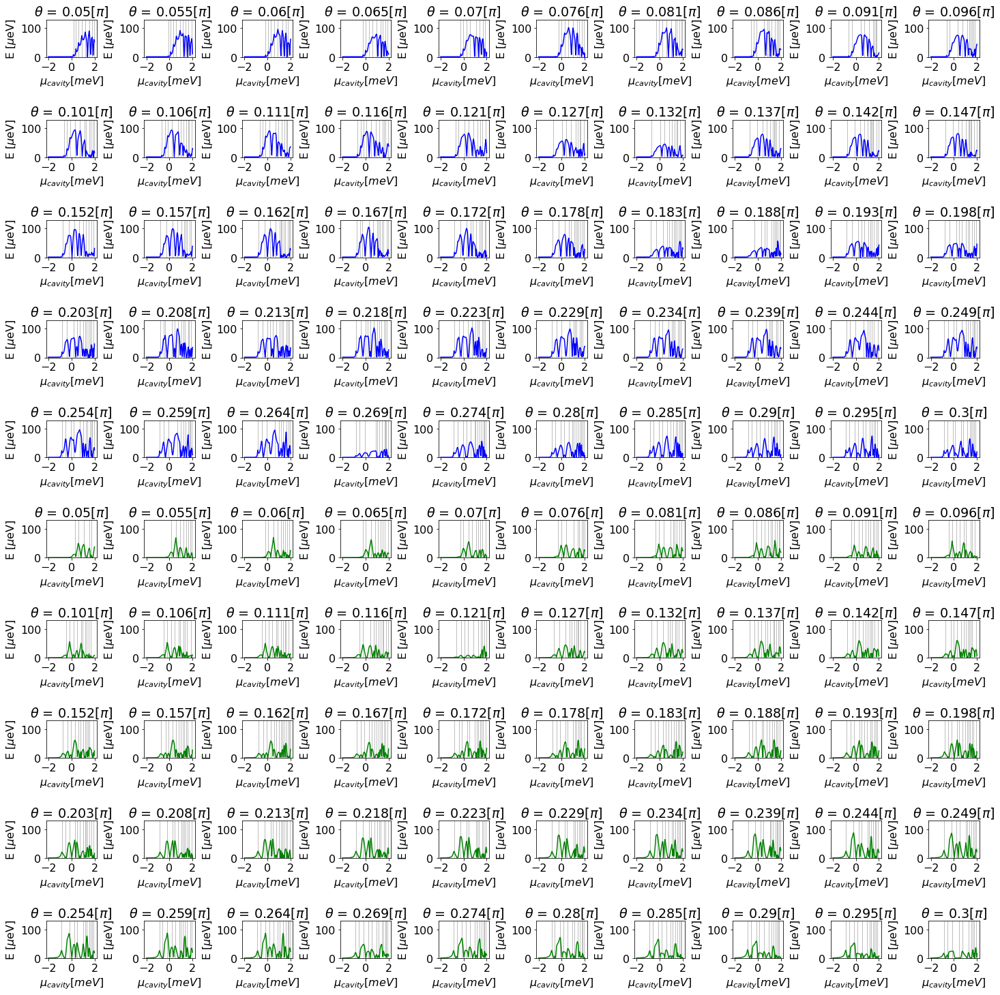

In [2465]:
pt.plot_couplings(
    n_geometries,
    geometries,
    mus_qd_units,
    geometries_peaks,
    geometries_couplings,
    title,
    units,
    n_cols=10,
    n_rows=10,
    figsize=(20, 20),
    ylim=130
)

In [2466]:
averaged_widths = np.mean(geometries_widths.T, axis=0)
averaged_peaks = np.mean(geometries_averages.T, axis=0)
averaged_widths_triangle_one_side = averaged_widths
averaged_peaks_triangle_one_side = averaged_peaks
#averaged_widths = geometries_widths.T[0]
#averaged_peaks = geometries_averages.T[0]

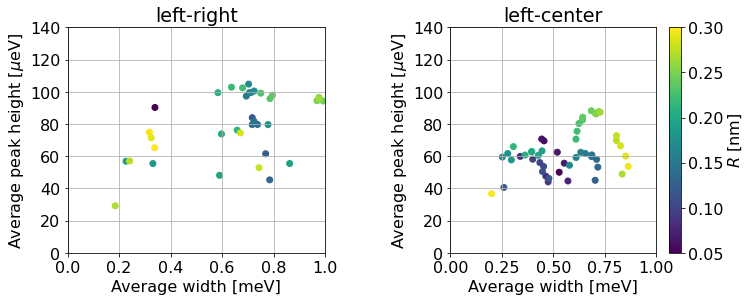

In [2467]:
cmap = cm.get_cmap('viridis')
pair = 0

fig, axes = plt.subplots(ncols=2, figsize=(10, 4))
fig.tight_layout(w_pad=5)

for ax in axes.flatten():
    plot = ax.scatter(2*geometries_widths.T[pair],
                      1e6*geometries_averages.T[pair],
                      c=angles,
                      cmap=cmap)
    ax.set_xlabel(r'Average width [meV]')
    ax.set_ylabel(r'Average peak height [$\mu$eV]')
    ax.set_title(titles[pair])
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 140) 
    ax.grid()
    pair += 1
cb = fig.colorbar(plot, ax=axes[-1])
cb.set_label(r'$R$ [nm]')

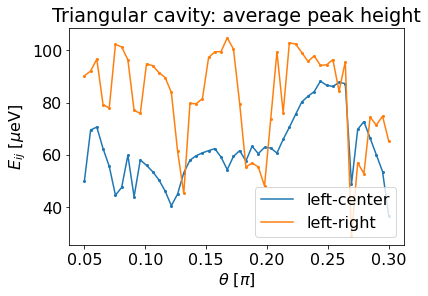

In [2468]:
fig, ax = plt.subplots()

ax.plot(geometries, 1e6*geometries_averages.T[1], label='left-center')
ax.scatter(geometries, 1e6*geometries_averages.T[1], s=4)
ax.plot(geometries, 1e6*geometries_averages.T[0], label='left-right')
ax.scatter(geometries, 1e6*geometries_averages.T[0], s=4)

ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.set_xlabel(r'$\theta$ [$\pi$]')
ax.set_title(r'Triangular cavity: average peak height')

ax.legend()

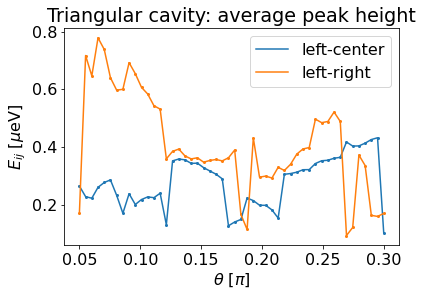

In [2469]:
fig, ax = plt.subplots()

ax.plot(geometries, geometries_widths.T[1], label='left-center')
ax.scatter(geometries, geometries_widths.T[1], s=4)
ax.plot(geometries, geometries_widths.T[0], label='left-right')
ax.scatter(geometries, geometries_widths.T[0], s=4)

ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.set_xlabel(r'$\theta$ [$\pi$]')
ax.set_title(r'Triangular cavity: average peak height')

ax.legend()

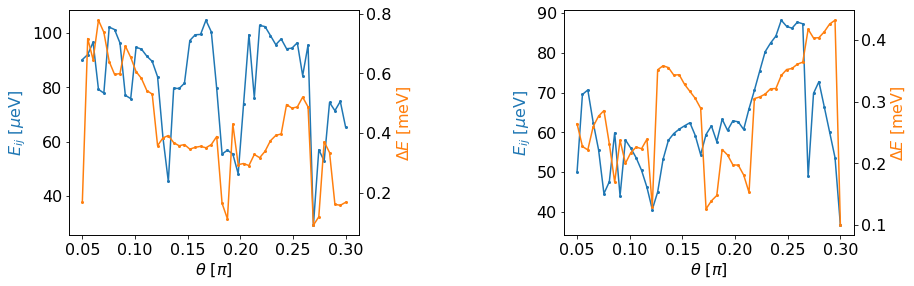

In [2470]:
pair = 0
fig, axes = plt.subplots(ncols=2, figsize=(12, 4))
fig.tight_layout(w_pad=10, h_pad=2)

for ax in axes.flatten():
    ax.plot(geometries, 1e6*geometries_averages.T[pair], c='C0')
    ax.scatter(geometries, 1e6*geometries_averages.T[pair], s=4, c='C0')
    ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]', color='C0')
    ax.set_xlabel(r'$\theta$ [$\pi$]')

    ax2 = ax.twinx()
    ax2.plot(geometries, geometries_widths.T[pair], c='C1')
    ax2.scatter(geometries, geometries_widths.T[pair], s=4, c='C1')
    ax2.set_ylabel(r'$\Delta E$ [meV]', color='C1')
    ax2.set_xlabel(r'$\theta$ [$\pi$]')
    pair += 1

In [2471]:
averages_couplings_bands = []

n_peaks = 10
prominence = 1e-6
width = 1
height = 0
peaks_kwargs = {'prominence': prominence, 'width': width, 'height': height}

for index in range(7):

    file = 'area_1400_band_'+str(index)+'th.pickle'
    with open(directory_path+file, 'rb') as data:
        result = pickle.load(data)

    geometries_averages = []

    data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
    for geometry in data_geometries:
        couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
        averaged_peaks = []
        for i in range(3):
            averaged_peaks.append(np.max(couplings[i][peaks[i]]))

        geometries_averages.append(averaged_peaks)

    geometries_averages = np.array(geometries_averages)
    averages_couplings_bands.append(geometries_averages)

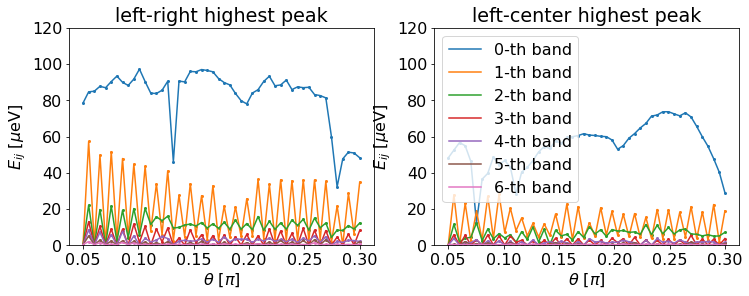

In [2472]:
bands = range(7)
pair = 0

fig, ax = plt.subplots(ncols=2, figsize=(12, 4))
i = 0
for geometries_averages in averages_couplings_bands:
    pair = 0
    for axes in ax.flatten():
        axes.plot(geometries, 1e6*geometries_averages.T[pair], label=str(bands[i])+'-th band')
        axes.scatter(geometries, 1e6*geometries_averages.T[pair], s=4)
        pair += 1
    i += 1

i = 0
for axes in ax.flatten():
    axes.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
    axes.set_xlabel(r'$\theta$ [$\pi$]')
    axes.set_ylim(0, 120)
    axes.set_title(str(titles[i])+' highest peak')
    i += 1

ax[-1].legend(loc='upper left')

plt.savefig(directory_path+'triangle_one_side_average_coupling.pdf')

## Selected cases

### $\theta = 0.234 \pi$

In [2584]:
area = 1200*a**2
theta = angles[36]
w = 7*a
geometry = {
    "l": 130*a,
    "w": w,
    "a": a,
    "side": 'down',
    "shape": 'triangle',
    "A": area,
    "angle": theta*np.pi
}

center = np.sqrt(np.abs(area/np.tan(theta*np.pi)))/2
geometry.update(centers=[center, -center])

In [2585]:
trijunction, f_params, _ = tj.finite_system(**geometry)
trijunction = trijunction.finalized()

/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(


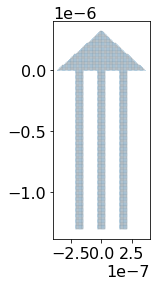

In [2586]:
kwant.plot(trijunction);

In [2587]:
n = 6
key = 'mu_qd'
mus_qd = np.linspace(-0.001, 0.001, 100)

In [2588]:
index = 0
# open raw simulation result
file = 'ens_wfs_a_234.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)

In [2621]:
n_peaks = 5
prominence = 0
peaks_kwargs = {'prominence': prominence, 'width': 0, 'height': 0}

In [2622]:
ens, wfs, peaks = tl.coupling_data(result, sign=1, n_peaks=n_peaks,eigenvecs=True , **peaks_kwargs)

In [2623]:
ens = np.array(ens)
wfs = np.array(wfs)

In [2624]:
limit = -0.7e-3
for i in range(3):
    peaks[i] = peaks[i][mus_qd[peaks[i]] > limit]

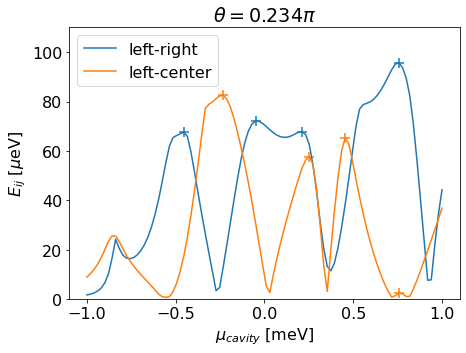

In [2631]:
fig, ax = plt.subplots(figsize=(7, 5))
labels = ['LR', 'LC', 'CR']
colors = ['black', 'red', 'red']
i = 0
for level in ens[:2]:
    ax.plot(1e3*mus_qd, 1e6*level, label=titles[i])
    ax.scatter(1e3*mus_qd[peaks[i]], 1e6*ens[i][peaks[i]], marker='+', s=100)
    i += 1
ax.set_xlabel(r'$\mu_{cavity}$ [meV]')
ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.set_title(r'$\theta=0.234 \pi$')
ax.legend(loc='upper left')
ax.set_ylim(0, 110)
plt.savefig(directory_path+'example_coupling_234.pdf')

In [2603]:
density = kwant.operator.Density(trijunction, np.eye(4))

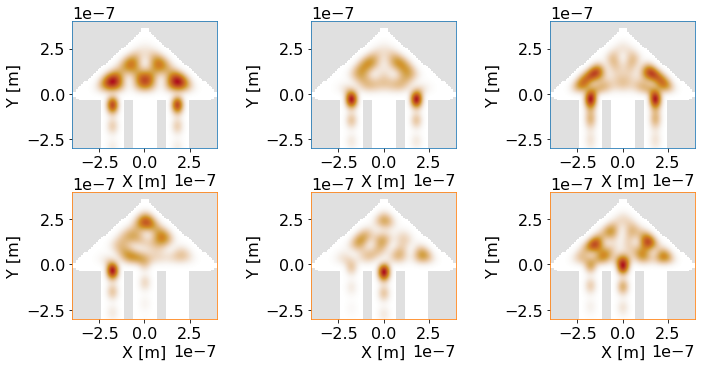

In [2628]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(10, 5))
fig.tight_layout(h_pad=1, w_pad=2)

i = 0
j = 0
for ax in axes.flatten():
    kwant.plotter.density(trijunction, density(wfs[j, peaks[j][i+1]]), ax=ax)
    ax.set_ylim(-3e-7, 4e-7)
    ax.set_xlabel(r'X [m]')
    ax.set_ylabel(r'Y [m]')
    for spine in ax.spines.values():
        if j == 0:
            spine.set_edgecolor('C0')
        else:
            spine.set_edgecolor('C1')
    i += 1
    if i == 3:
        i = 0
        j = 1
plt.savefig(directory_path+'example_wfs_234.pdf')

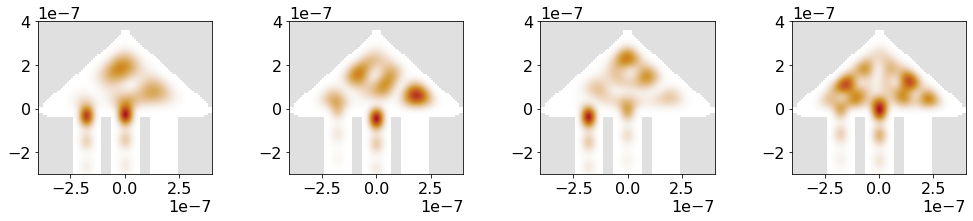

In [2511]:
fig, axes = plt.subplots(nrows=1, ncols=n_peaks, figsize=(14, 3))
fig.tight_layout(h_pad=1, w_pad=2)

i = 0
for ax in axes.flatten():
    kwant.plotter.density(trijunction, density(wfs[1, peaks[0][i]]), ax=ax)
    ax.set_ylim(-3e-7, 4e-7)
    i += 1

### $\theta = 0.23 \pi$

In [247]:
area = 1200*a**2
theta = 0.23
w = 7*a
geometry = {
    "l": 130*a,
    "w": w,
    "a": a,
    "side": 'down',
    "shape": 'triangle',
    "A": area,
    "angle": theta*np.pi
}

center = np.sqrt(np.abs(area/np.tan(theta*np.pi)))/2
geometry.update(centers=[center, -center])

In [248]:
trijunction, f_params, _ = tj.finite_system(**geometry)
trijunction = trijunction.finalized()

/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(


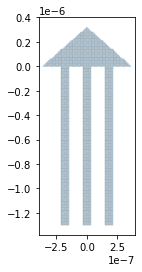

In [249]:
kwant.plot(trijunction);

In [250]:
n = 6
key = 'mu_qd'
mus_qd = np.linspace(-0.001, 0.001, 100)

In [251]:
eigen = sl.solver(geometries=[[trijunction, f_params]], n=n, key=key, eigenvecs=True)


def wrap(args):
    return eigen(*args)

In [252]:
%%time
# execute calculation
index = 0
params = sl.finite_coupling_parameters(index=index)

args = list(it.product([0], mus_qd, params))
args_db = db.from_sequence(args, npartitions=40)

with Cluster(options) as cluster:
    cluster.scale(n=40)
    client = cluster.get_client()
    print("http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/"+cluster.dashboard_link[17:])

    result = args_db.map(wrap).compute()

path = directory_path + '/ens_wfs_a_23.pickle'
with open(path, 'wb') as file:
    pickle.dump(result, file)

http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/7fa83333e95d4507a2354f5d608886b8/status
CPU times: user 6.09 s, sys: 2.38 s, total: 8.47 s
Wall time: 2min 24s


In [253]:
index = 0
# open raw simulation result
file = 'ens_wfs_a_23.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)

In [269]:
n_peaks = 5
prominence = 2e-6
peaks_kwargs = {'prominence': prominence, 'width': 0, 'height': 0}

In [270]:
ens, wfs, peaks = tl.coupling_data(result, sign=1, n_peaks=n_peaks,eigenvecs=True , **peaks_kwargs)

In [271]:
ens = np.array(ens)
wfs = np.array(wfs)

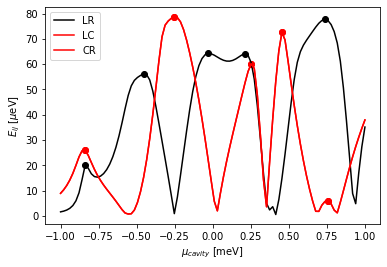

In [272]:
fig, ax = plt.subplots()

i = 0
for level in ens:
    ax.plot(1e3*mus_qd, 1e6*level)
    ax.scatter(1e3*mus_qd[peaks[i]], 1e6*level[peaks[i]], c=colors[i])
    i += 1
ax.set_xlabel(r'$\mu_{cavity}$ [meV]')
ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.legend()

In [273]:
density = kwant.operator.Density(trijunction, np.eye(4))

ValueError: vector is incorrect shape

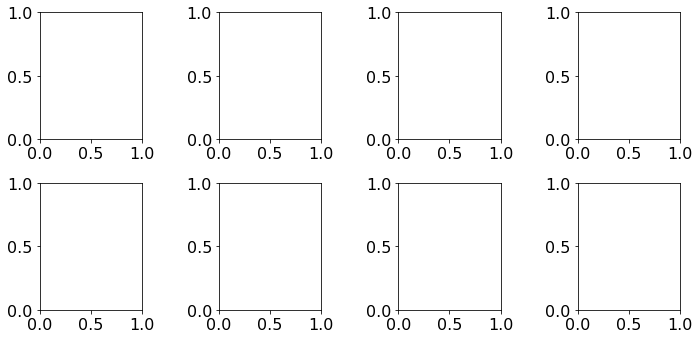

In [2581]:
fig, axes = plt.subplots(nrows=2, ncols=n_peaks, figsize=(10, 5))
fig.tight_layout(h_pad=1, w_pad=2)

i = 0
j = 0
for ax in axes.flatten():
    kwant.plotter.density(trijunction, density(wfs[j, peaks[j][i]]), ax=ax)
    ax.set_ylim(-3e-7, 4e-7)
    ax.set_xlabel(r'X [m]')
    ax.set_ylabel(r'Y [m]')
    for spine in ax.spines.values():
        if j == 0:
            spine.set_edgecolor('C0')
        else:
            spine.set_edgecolor('C1')
    i += 1
    if i == n_peaks:
        i = 0
        j = 1
plt.savefig(directory_path+'example_wfs_234.pdf')

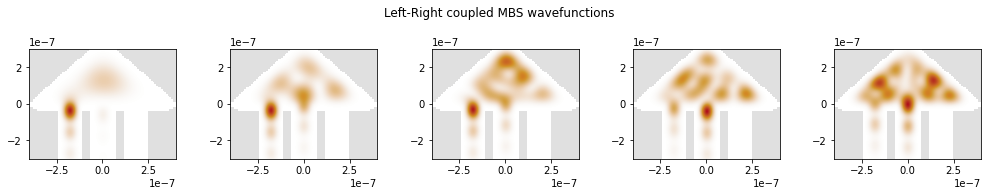

In [275]:
fig, axes = plt.subplots(nrows=1, ncols=n_peaks, figsize=(14, 3))
fig.tight_layout(h_pad=1, w_pad=2)
fig.suptitle(r'Left-Right coupled MBS wavefunctions')

i = 0
for ax in axes.flatten():
    kwant.plotter.density(trijunction, density(wfs[1, peaks[1][i]]), ax=ax)
    ax.set_ylim(-3e-7, 3e-7)
    i += 1

### $\theta = 0.25 \pi$

In [276]:
area = 1200*a**2
theta = 0.25
w = 7*a
geometry = {
    "l": 130*a,
    "w": w,
    "a": a,
    "side": 'down',
    "shape": 'triangle',
    "A": area,
    "angle": theta*np.pi
}

center = np.sqrt(np.abs(area/np.tan(theta*np.pi)))/2
geometry.update(centers=[center, -center])

In [277]:
trijunction, f_params, _ = tj.finite_system(**geometry)
trijunction = trijunction.finalized()

/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(


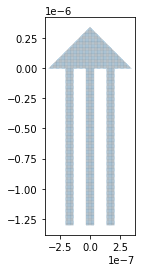

In [278]:
kwant.plot(trijunction);

In [279]:
n = 6
key = 'mu_qd'
mus_qd = np.linspace(-0.001, 0.001, 100)

In [280]:
eigen = sl.solver(geometries=[[trijunction, f_params]], n=n, key=key, eigenvecs=True)


def wrap(args):
    return eigen(*args)

In [281]:
%%time
# execute calculation
index = 0
params = sl.finite_coupling_parameters(index=index)

args = list(it.product([0], mus_qd, params))
args_db = db.from_sequence(args, npartitions=40)

with Cluster(options) as cluster:
    cluster.scale(n=40)
    client = cluster.get_client()
    print("http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/"+cluster.dashboard_link[17:])

    result = args_db.map(wrap).compute()

path = directory_path + '/ens_wfs_a_25.pickle'
with open(path, 'wb') as file:
    pickle.dump(result, file)

http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/3c9c5f2a5f214d569ad7f1d5c6482b3b/status
CPU times: user 6.54 s, sys: 2.48 s, total: 9.02 s
Wall time: 2min 20s


In [282]:
index = 0
# open raw simulation result
file = 'ens_wfs_a_25.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)

In [283]:
n_peaks = 5
prominence = 0
peaks_kwargs = {'prominence': prominence, 'width': 0, 'height': 0}

In [284]:
ens, wfs, peaks = tl.coupling_data(result, sign=1, n_peaks=n_peaks,eigenvecs=True , **peaks_kwargs)

In [285]:
ens = np.array(ens)
wfs = np.array(wfs)

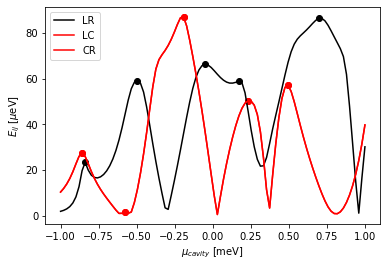

In [286]:
fig, ax = plt.subplots()
labels = ['LR', 'LC', 'CR']
colors = ['black', 'red', 'red']
i = 0
for level in ens:
    ax.plot(1e3*mus_qd, 1e6*level, label=labels[i], c=colors[i])
    ax.scatter(1e3*mus_qd[peaks[i]], 1e6*level[peaks[i]], c=colors[i])
    i += 1
ax.set_xlabel(r'$\mu_{cavity}$ [meV]')
ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.legend()

In [287]:
density = kwant.operator.Density(trijunction, np.eye(4))

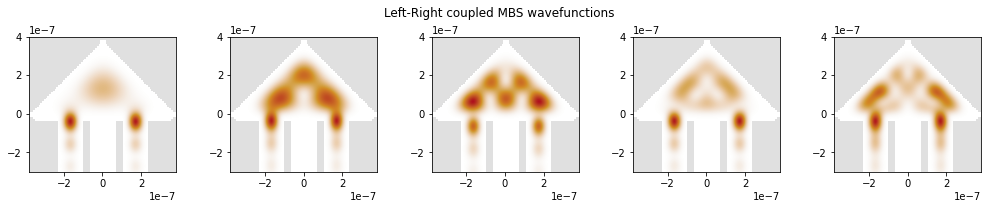

In [288]:
fig, axes = plt.subplots(nrows=1, ncols=n_peaks, figsize=(14, 3))
fig.tight_layout(h_pad=1, w_pad=2)
fig.suptitle(r'Left-Right coupled MBS wavefunctions')

i = 0
for ax in axes.flatten():
    kwant.plotter.density(trijunction, density(wfs[0, peaks[0][i]]), ax=ax)
    ax.set_ylim(-3e-7, 4e-7)
    i += 1

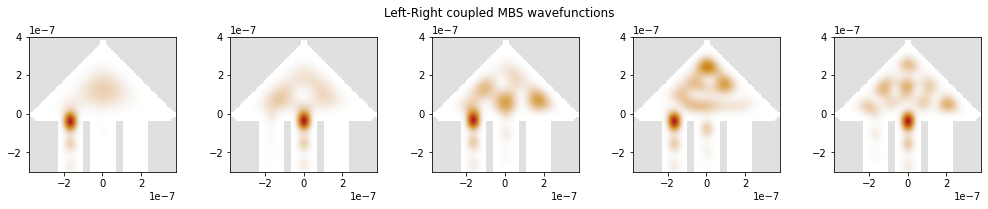

In [290]:
fig, axes = plt.subplots(nrows=1, ncols=n_peaks, figsize=(14, 3))
fig.tight_layout(h_pad=1, w_pad=2)
fig.suptitle(r'Left-Right coupled MBS wavefunctions')

i = 0
for ax in axes.flatten():
    kwant.plotter.density(trijunction, density(wfs[1, peaks[1][i]]), ax=ax)
    ax.set_ylim(-3e-7, 4e-7)
    i += 1

# Triangular geometry with wires at one side size

## Set up parameters

In [1945]:
area = 1400*a**2
w = 7*a
geometry = {
    "l": 130*a,
    "w": w,
    "a": a,
    "side": 'down',
    "shape": 'triangle',
    "A": area
}

In [1946]:
n_geometries = 25
areas = np.linspace(700, 3700, n_geometries)

In [1947]:
mus_qd = np.linspace(-0.002, 0.002, 100)
key = 'mu_qd'
n = 6
directory_path = '../data/manuscript/triangle_angles_one_side_size/'

## Analyse results

In [1948]:
geometries = angles
geometry_parameter = r'$\theta[\pi]$'

In [1949]:
n_peaks = 30
prominence = 0
width = 1
height = 0
peaks_kwargs = {'prominence': prominence, 'width': width, 'height': height}

In [1950]:
index = 0
# open raw simulation result
file = 'band_'+str(index)+'th.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)

In [1951]:
limit = 2e-3

geometries_couplings = []
geometries_peaks = []
geometries_averages = []
geometries_widths = []

data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
for geometry in data_geometries:
    couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
    geometries_couplings.append(couplings)
    geometries_peaks.append(peaks)
    widths = []
    averaged_peaks = []
    for i in range(3):
        peaks[i] = peaks[i][mus_qd[peaks[i]] < limit]
        #print(couplings[i][peaks[i]])
        max_peak_arg = np.argmax(couplings[i][peaks[i]])
        #print(peaks[i][max_peak_arg])
        widths.append(2e-2*peak_widths(x=couplings[i], peaks=[peaks[i][max_peak_arg]])[0])
        averaged_peaks.append(np.max(couplings[i][peaks[i]]))
    geometries_widths.append(np.array(widths).flatten())
    geometries_averages.append(averaged_peaks)

geometries_couplings = np.array(geometries_couplings)
geometries_peaks = np.array(geometries_peaks)
geometries_widths = np.array(geometries_widths)
geometries_averages = np.array(geometries_averages)

triangle_1_w = geometries_widths
triangle_1_p = geometries_averages
triangle_1_g = areas

In [1952]:
geometry = 0
pair = 0

geometries = areas
mus_qd_units = 1e3*mus_qd

In [1953]:
title = r'$\theta$ = '
units = r'[$\pi$]'

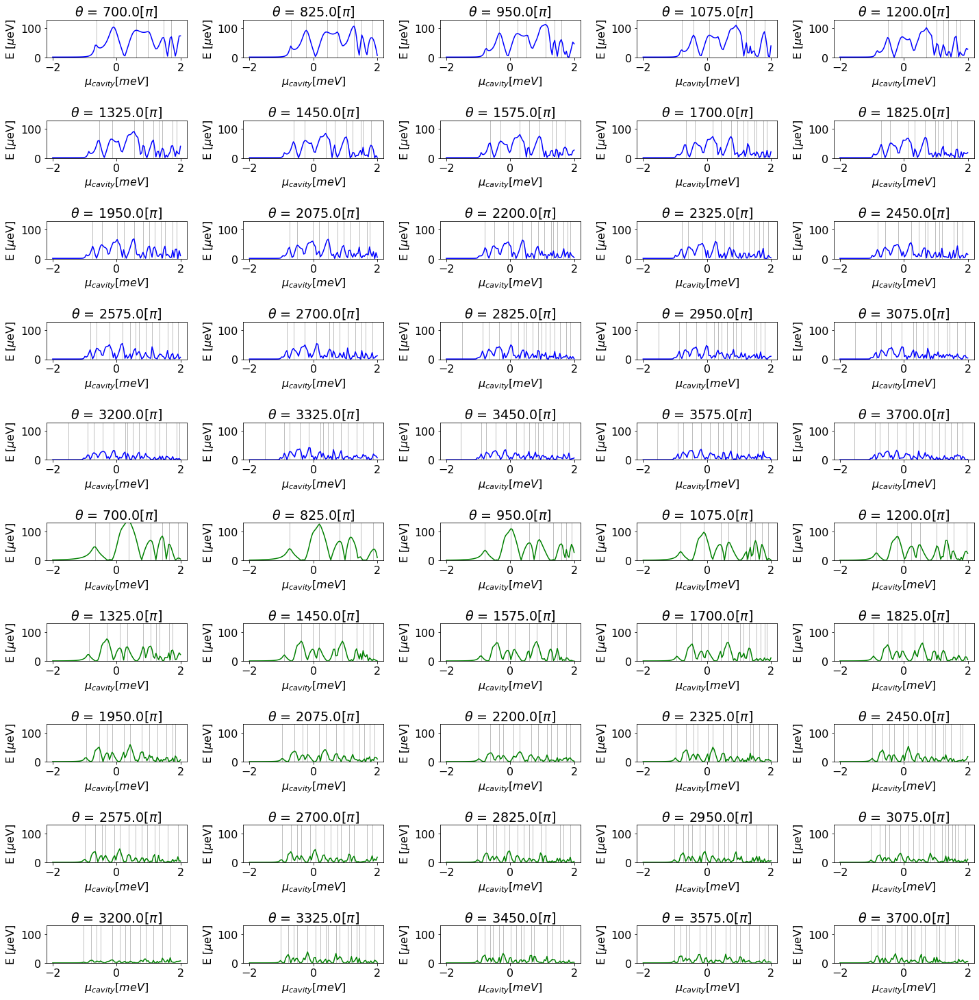

In [1954]:
pt.plot_couplings(
    n_geometries,
    geometries,
    mus_qd_units,
    geometries_peaks,
    geometries_couplings,
    title,
    units,
    n_cols=5,
    n_rows=10,
    figsize=(20, 20),
    ylim=130
)

In [1955]:
averaged_widths = np.mean(geometries_widths.T, axis=0)
averaged_peaks = np.mean(geometries_averages.T, axis=0)
averaged_widths_triangle_one_side = averaged_widths
averaged_peaks_triangle_one_side = averaged_peaks
#averaged_widths = geometries_widths.T[0]
#averaged_peaks = geometries_averages.T[0]

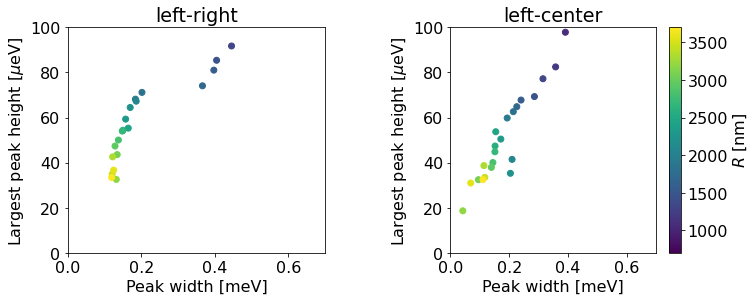

In [1956]:
pair = 1

cmap = cm.get_cmap('viridis')
pair = 0

fig, axes = plt.subplots(ncols=2, figsize=(10, 4))
fig.tight_layout(w_pad=5)

for ax in axes.flatten():
    plot = ax.scatter(2*geometries_widths.T[pair], 1e6*geometries_averages.T[pair], c=areas, cmap=cmap)
    ax.set_xlabel(r'Peak width [meV]')
    ax.set_ylabel(r'Largest peak height [$\mu$eV]')
    ax.set_title(titles[pair])
    ax.set_xlim(0, 0.7)
    ax.set_ylim(0, 100)
    pair += 1
cb = fig.colorbar(plot, ax=axes[-1])
cb.set_label(r'$R$ [nm]')

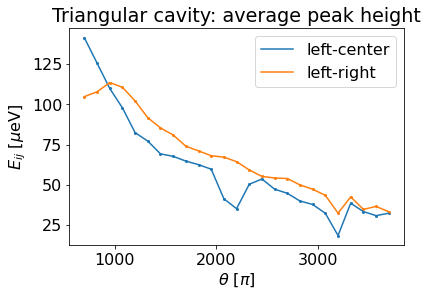

In [1957]:
fig, ax = plt.subplots()

ax.plot(geometries, 1e6*geometries_averages.T[1], label='left-center')
ax.scatter(geometries, 1e6*geometries_averages.T[1], s=4)
ax.plot(geometries, 1e6*geometries_averages.T[0], label='left-right')
ax.scatter(geometries, 1e6*geometries_averages.T[0], s=4)

ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.set_xlabel(r'$\theta$ [$\pi$]')
ax.set_title(r'Triangular cavity: average peak height')

ax.legend()

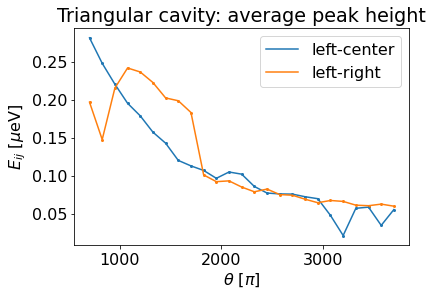

In [1958]:
fig, ax = plt.subplots()

ax.plot(geometries, geometries_widths.T[1], label='left-center')
ax.scatter(geometries, geometries_widths.T[1], s=4)
ax.plot(geometries, geometries_widths.T[0], label='left-right')
ax.scatter(geometries, geometries_widths.T[0], s=4)

ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.set_xlabel(r'$\theta$ [$\pi$]')
ax.set_title(r'Triangular cavity: average peak height')

ax.legend()

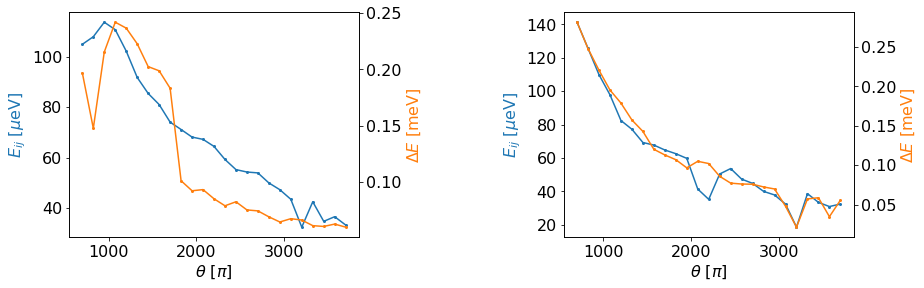

In [1959]:
pair = 0
fig, axes = plt.subplots(ncols=2, figsize=(12, 4))
fig.tight_layout(w_pad=10, h_pad=2)

for ax in axes.flatten():
    ax.plot(geometries, 1e6*geometries_averages.T[pair], c='C0')
    ax.scatter(geometries, 1e6*geometries_averages.T[pair], s=4, c='C0')
    ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]', color='C0')
    ax.set_xlabel(r'$\theta$ [$\pi$]')

    ax2 = ax.twinx()
    ax2.plot(geometries, geometries_widths.T[pair], c='C1')
    ax2.scatter(geometries, geometries_widths.T[pair], s=4, c='C1')
    ax2.set_ylabel(r'$\Delta E$ [meV]', color='C1')
    ax2.set_xlabel(r'$\theta$ [$\pi$]')
    pair += 1

In [1960]:
averages_couplings_bands = []

n_peaks = 10
prominence = 1e-6
width = 1
height = 0
peaks_kwargs = {'prominence': prominence, 'width': width, 'height': height}

for index in range(7):

    file = 'band_'+str(index)+'th.pickle'
    with open(directory_path+file, 'rb') as data:
        result = pickle.load(data)

    geometries_averages = []

    data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
    for geometry in data_geometries:
        couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
        averaged_peaks = []
        for i in range(3):
            averaged_peaks.append(np.max(couplings[i][peaks[i]]))

        geometries_averages.append(averaged_peaks)

    geometries_averages = np.array(geometries_averages)
    averages_couplings_bands.append(geometries_averages)

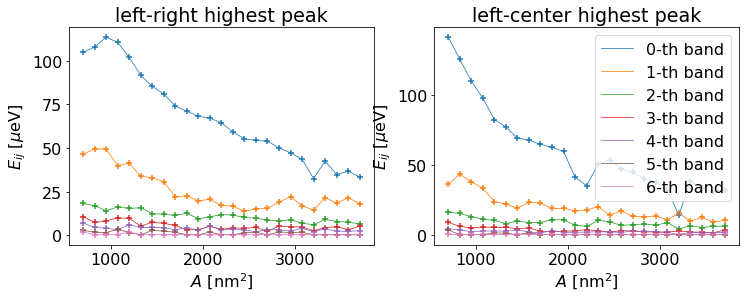

In [1961]:
bands = range(7)
pair = 0

fig, ax = plt.subplots(ncols=2, figsize=(12, 4))
i = 0
for geometries_averages in averages_couplings_bands:
    pair = 0
    for axes in ax.flatten():
        axes.plot(geometries, 1e6*geometries_averages.T[pair], label=str(bands[i])+'-th band', linewidth=0.75)
        axes.scatter(geometries, 1e6*geometries_averages.T[pair], s=40, marker='+')
        pair += 1
    i += 1

i = 0
for axes in ax.flatten():
    axes.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
    axes.set_xlabel(r'$A$ [nm$^2$]')
    #axes.set_ylim(0, 120)   
    axes.set_title(str(titles[i])+' highest peak')
    i += 1

ax[-1].legend(loc='upper right')

plt.savefig(directory_path+'triangle_one_side_average_coupling.pdf')

In [1962]:
triangle_1_band_averages = []
for geometry_data in averages_couplings_bands:
    triangle_1_band_averages.append(np.mean(geometry_data, axis=0))
triangle_1_band_averages = np.array(triangle_1_band_averages)

# Triangular geometry with wires at both sides size

## Set up parameters

In [1618]:
angle = np.pi/4
w = 7*a
geometry = {
    "l": 130*a,
    "w": w,
    "a": a,
    "side": 'up',
    "shape": 'triangle',
    "angle": angle
}

In [1619]:
n_geometries = 25
areas = np.linspace(700, 3700, n_geometries)

In [1620]:
mus_qd = np.linspace(-0.002, 0.002, 100)
key = 'mu_qd'
n = 6
directory_path = '../data/manuscript/triangle_angles_two_side_size/'

## Analyse results

In [1621]:
geometries = angles
geometry_parameter = r'$\theta[\pi]$'

In [1622]:
n_peaks = 30
prominence = 0
width = 1
height = 0
peaks_kwargs = {'prominence': prominence, 'width': width, 'height': height}

In [1626]:
index = 0
# open raw simulation result
file = 'area_900_band_'+str(index)+'th.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)

In [1627]:
limit = 2e-3

geometries_couplings = []
geometries_peaks = []
geometries_averages = []
geometries_widths = []

data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
for geometry in data_geometries:
    couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
    geometries_couplings.append(couplings)
    geometries_peaks.append(peaks)
    widths = []
    averaged_peaks = []
    for i in range(3):
        peaks[i] = peaks[i][mus_qd[peaks[i]] < limit]
        #print(couplings[i][peaks[i]])
        max_peak_arg = np.argmax(couplings[i][peaks[i]])
        #print(peaks[i][max_peak_arg])
        widths.append(2e-2*peak_widths(x=couplings[i], peaks=[peaks[i][max_peak_arg]])[0])
        averaged_peaks.append(np.max(couplings[i][peaks[i]]))
    geometries_widths.append(np.array(widths).flatten())
    geometries_averages.append(averaged_peaks)

geometries_couplings = np.array(geometries_couplings)
geometries_peaks = np.array(geometries_peaks)
geometries_widths = np.array(geometries_widths)
geometries_averages = np.array(geometries_averages)

triangle_2_w = geometries_widths
triangle_2_p = geometries_averages
triangle_2_g = areas

In [1628]:
geometry = 0
pair = 0

geometries = areas
mus_qd_units = 1e3*mus_qd

In [1629]:
title = r'$\theta$ = '
units = r'[$\pi$]'

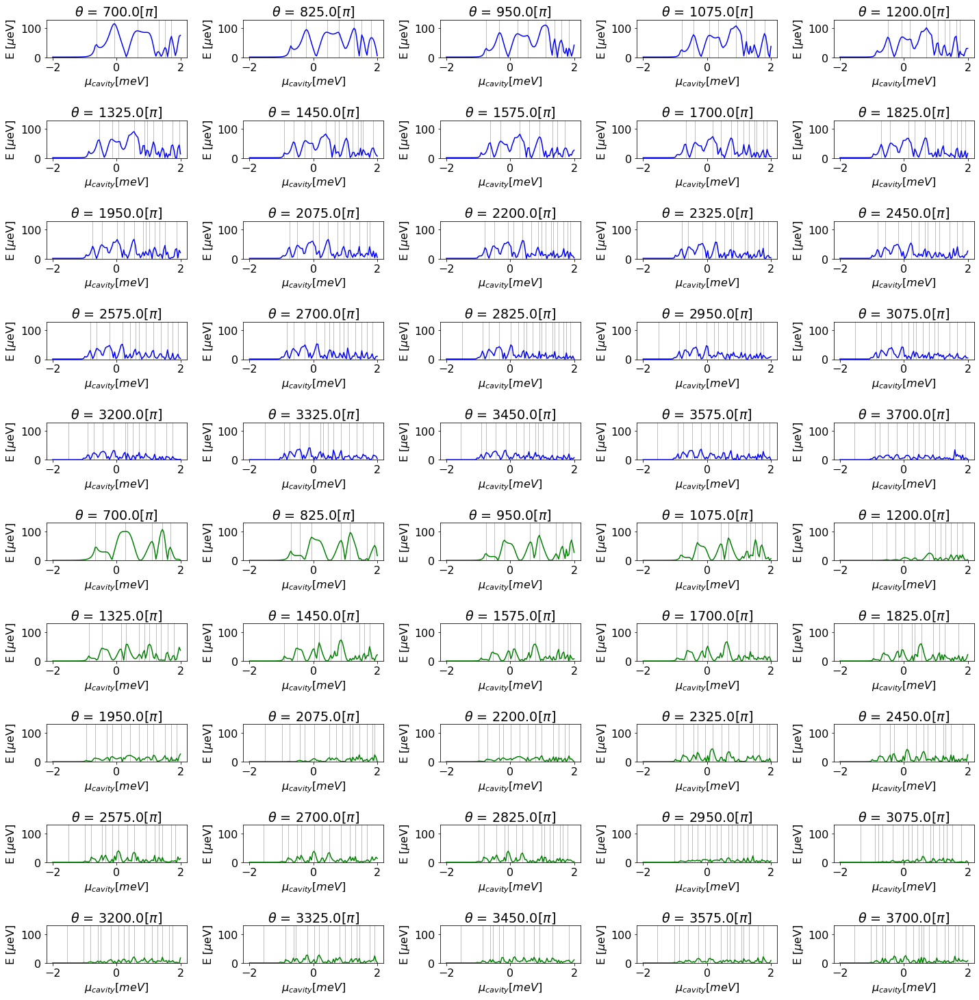

In [1630]:
pt.plot_couplings(
    n_geometries,
    geometries,
    mus_qd_units,
    geometries_peaks,
    geometries_couplings,
    title,
    units,
    n_cols=5,
    n_rows=10,
    figsize=(20, 20),
    ylim=130
)

In [1342]:
averaged_widths = np.mean(geometries_widths.T, axis=0)
averaged_peaks = np.mean(geometries_averages.T, axis=0)
averaged_widths_triangle_one_side = averaged_widths
averaged_peaks_triangle_one_side = averaged_peaks
#averaged_widths = geometries_widths.T[0]
#averaged_peaks = geometries_averages.T[0]

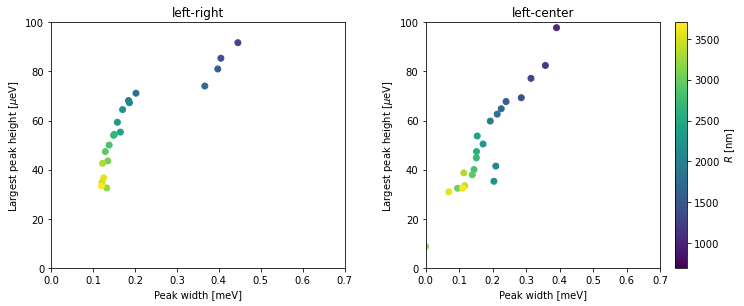

In [1343]:
pair = 1

cmap = cm.get_cmap('viridis')
pair = 0

fig, axes = plt.subplots(ncols=2, figsize=(10, 4))
fig.tight_layout(w_pad=5)

for ax in axes.flatten():
    plot = ax.scatter(2*geometries_widths.T[pair], 1e6*geometries_averages.T[pair], c=areas, cmap=cmap)
    ax.set_xlabel(r'Peak width [meV]')
    ax.set_ylabel(r'Largest peak height [$\mu$eV]')
    ax.set_title(titles[pair])
    ax.set_xlim(0, 0.7)
    ax.set_ylim(0, 100)
    pair += 1
cb = fig.colorbar(plot, ax=axes[-1])
cb.set_label(r'$R$ [nm]')

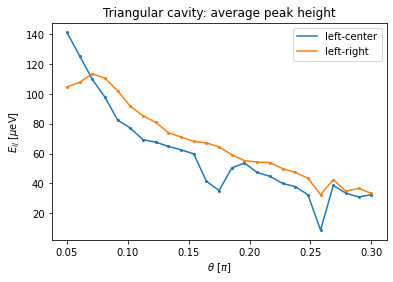

In [1317]:
fig, ax = plt.subplots()

ax.plot(geometries, 1e6*geometries_averages.T[1], label='left-center')
ax.scatter(geometries, 1e6*geometries_averages.T[1], s=4)
ax.plot(geometries, 1e6*geometries_averages.T[0], label='left-right')
ax.scatter(geometries, 1e6*geometries_averages.T[0], s=4)

ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.set_xlabel(r'$\theta$ [$\pi$]')
ax.set_title(r'Triangular cavity: average peak height')

ax.legend()

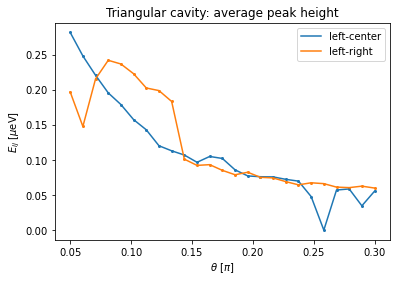

In [1318]:
fig, ax = plt.subplots()

ax.plot(geometries, geometries_widths.T[1], label='left-center')
ax.scatter(geometries, geometries_widths.T[1], s=4)
ax.plot(geometries, geometries_widths.T[0], label='left-right')
ax.scatter(geometries, geometries_widths.T[0], s=4)

ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.set_xlabel(r'$\theta$ [$\pi$]')
ax.set_title(r'Triangular cavity: average peak height')

ax.legend()

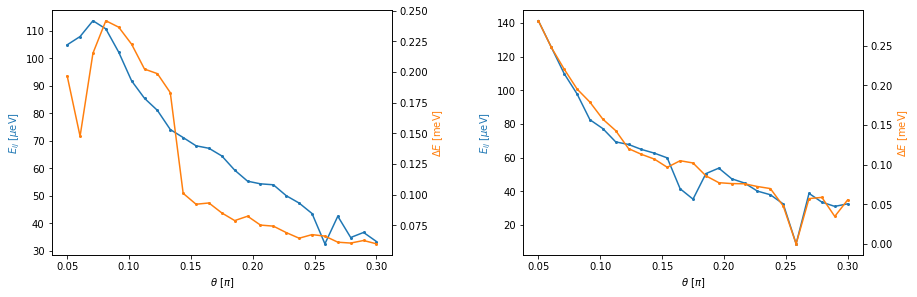

In [1319]:
pair = 0
fig, axes = plt.subplots(ncols=2, figsize=(12, 4))
fig.tight_layout(w_pad=10, h_pad=2)

for ax in axes.flatten():
    ax.plot(geometries, 1e6*geometries_averages.T[pair], c='C0')
    ax.scatter(geometries, 1e6*geometries_averages.T[pair], s=4, c='C0')
    ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]', color='C0')
    ax.set_xlabel(r'$\theta$ [$\pi$]')

    ax2 = ax.twinx()
    ax2.plot(geometries, geometries_widths.T[pair], c='C1')
    ax2.scatter(geometries, geometries_widths.T[pair], s=4, c='C1')
    ax2.set_ylabel(r'$\Delta E$ [meV]', color='C1')
    ax2.set_xlabel(r'$\theta$ [$\pi$]')
    pair += 1

In [1322]:
averages_couplings_bands = []

n_peaks = 10
prominence = 1e-6
width = 1
height = 0
peaks_kwargs = {'prominence': prominence, 'width': width, 'height': height}

for index in range(7):

    file = 'band_'+str(index)+'th.pickle'
    with open(directory_path+file, 'rb') as data:
        result = pickle.load(data)

    geometries_averages = []

    data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
    for geometry in data_geometries:
        couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
        averaged_peaks = []
        for i in range(3):
            averaged_peaks.append(np.max(couplings[i][peaks[i]]))

        geometries_averages.append(averaged_peaks)

    geometries_averages = np.array(geometries_averages)
    averages_couplings_bands.append(geometries_averages)

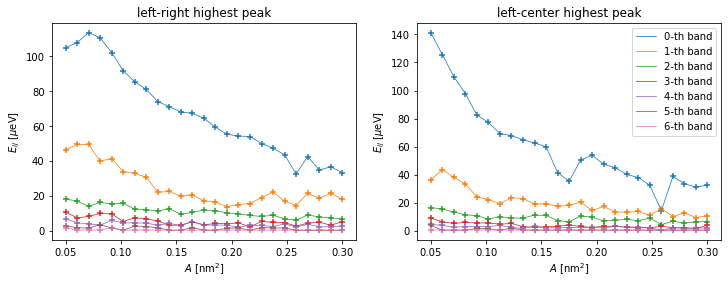

In [1333]:
bands = range(7)
pair = 0

fig, ax = plt.subplots(ncols=2, figsize=(12, 4))
i = 0
for geometries_averages in averages_couplings_bands:
    pair = 0
    for axes in ax.flatten():
        axes.plot(geometries, 1e6*geometries_averages.T[pair], label=str(bands[i])+'-th band', linewidth=0.75)
        axes.scatter(geometries, 1e6*geometries_averages.T[pair], s=40, marker='+')
        pair += 1
    i += 1

i = 0
for axes in ax.flatten():
    axes.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
    axes.set_xlabel(r'$A$ [nm$^2$]')
    #axes.set_ylim(0, 120)   
    axes.set_title(str(titles[i])+' highest peak')
    i += 1

ax[-1].legend(loc='upper right')

plt.savefig(directory_path+'triangle_one_side_average_coupling.pdf')

# Inverted triangular geometry with wires at both side

## Set up parameters

In [2208]:
area = 1400*a**2
geometry = {
    "L": 130*a,
    "w": 7*a,
    "side": 'up',
    "area": area
}

In [2209]:
n_geometries = 25
angles = np.linspace(0.05, 0.3, n_geometries)

In [2210]:
mus_qd = np.linspace(-0.002, 0.002, 100)
key = 'mu_qd'
n = 6
directory_path = '../data/manuscript/inverted_triangle_angles_one_side/'

In [2211]:
os.system('mkdir '+directory_path)

mkdir: cannot create directory ‘../data/manuscript/inverted_triangle_angles_one_side/’: File exists


256

## Analyse results

In [2212]:
geometries = angles
geometry_parameter = r'$\theta[\pi]$'

In [2213]:
n_peaks = 2
prominence = 15e-6
width = 4
height = 0
peaks_kwargs = {'prominence': prominence, 'width': width, 'height': height}

In [2214]:
index = 0
# open raw simulation result
file = 'area_1400_band_'+str(index)+'th.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)

In [2215]:
limit = 4e-3

geometries_couplings = []
geometries_peaks = []
geometries_averages = []
geometries_widths = []

data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
for geometry in data_geometries:
    couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
    geometries_couplings.append(couplings)
    geometries_peaks.append(peaks)
    widths = []
    averaged_peaks = []
    for i in range(3):
        peaks[i] = peaks[i][mus_qd[peaks[i]] < limit]
        #print(couplings[i][peaks[i]])
        max_peak_arg = np.argmax(couplings[i][peaks[i]])
        #print(peaks[i][max_peak_arg])
        widths.append(2e-2*peak_widths(x=couplings[i], peaks=[peaks[i][max_peak_arg]])[0])
        averaged_peaks.append(np.max(couplings[i][peaks[i]]))
    geometries_widths.append(np.array(widths).flatten())
    geometries_averages.append(averaged_peaks)

geometries_couplings = np.array(geometries_couplings)
geometries_peaks = np.array(geometries_peaks)
geometries_widths = np.array(geometries_widths)
geometries_averages = np.array(geometries_averages)

inverse_triangle_2_angle_w = geometries_widths
inverse_triangle_2_angle_p = geometries_averages

In [2216]:
geometry = 0
pair = 0

couplings = 1e6*geometries_couplings[geometry][pair]
mus_qd_units = 1e3*mus_qd

In [2217]:
title = r'$\theta$ = '
units = r'[$\pi$]'

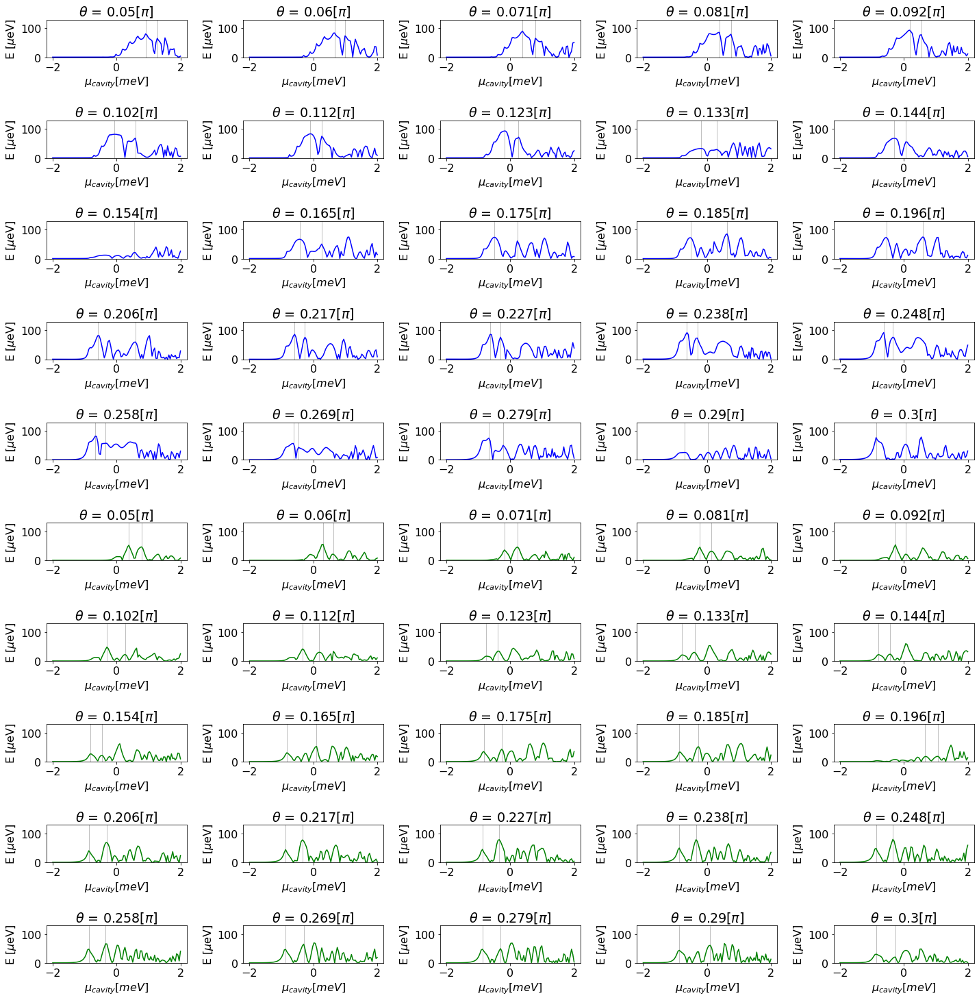

In [2184]:
pt.plot_couplings(
    n_geometries,
    geometries,
    mus_qd_units,
    geometries_peaks,
    geometries_couplings,
    title,
    units,
    n_cols=5,
    n_rows=10,
    figsize=(20, 20),
    ylim=130
)

In [653]:
#averaged_widths = np.mean(geometries_widths.T, axis=0)
#averaged_peaks = np.mean(geometries_averages.T, axis=0)
averaged_widths = geometries_widths.T[0]
averaged_peaks = geometries_averages.T[0]

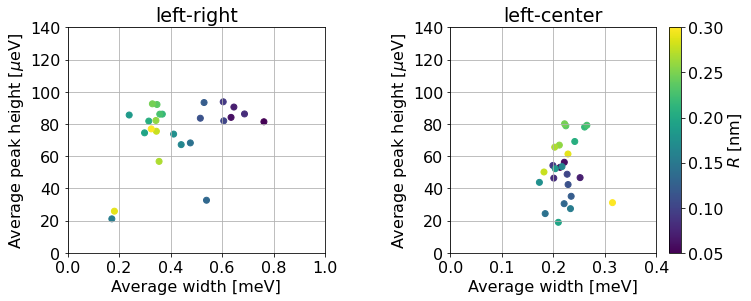

In [2186]:
cmap = cm.get_cmap('viridis')
pair = 0

fig, axes = plt.subplots(ncols=2, figsize=(10, 4))
fig.tight_layout(w_pad=5)

for ax in axes.flatten():
    plot = ax.scatter(2*geometries_widths.T[pair],
                      1e6*geometries_averages.T[pair],
                      c=angles,
                      cmap=cmap)
    ax.set_xlabel(r'Average width [meV]')
    ax.set_ylabel(r'Average peak height [$\mu$eV]')
    ax.set_title(titles[pair])
    ax.set_ylim(0, 140) 
    ax.grid()
    pair += 1
axes[0].set_xlim(0, 1)
axes[1].set_xlim(0, 0.4)
cb = fig.colorbar(plot, ax=axes[-1])
cb.set_label(r'$R$ [nm]')

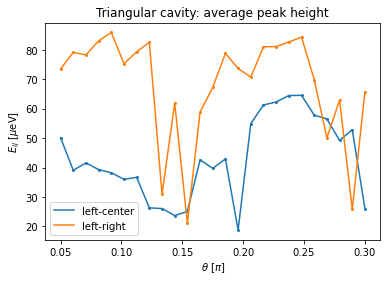

In [655]:
fig, ax = plt.subplots()

ax.plot(geometries, 1e6*geometries_averages.T[1], label='left-center')
ax.scatter(geometries, 1e6*geometries_averages.T[1], s=4)
ax.plot(geometries, 1e6*geometries_averages.T[0], label='left-right')
ax.scatter(geometries, 1e6*geometries_averages.T[0], s=4)

ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.set_xlabel(r'$\theta$ [$\pi$]')
ax.set_title(r'Triangular cavity: average peak height')

ax.legend()

In [678]:
averages_couplings_bands = []

n_peaks = 10
prominence = 3e-6
width = 1
height = 0
peaks_kwargs = {'prominence': prominence, 'width': width, 'height': height}

for index in range(7):

    file = 'area_1400_band_'+str(index)+'th.pickle'
    with open(directory_path+file, 'rb') as data:
        result = pickle.load(data)

    geometries_averages = []

    data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
    for geometry in data_geometries:
        couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
        averaged_peaks = []
        for i in range(3):
            averaged_peaks.append(np.max(couplings[i][peaks[i]]))

        geometries_averages.append(averaged_peaks)

    geometries_averages = np.array(geometries_averages)
    averages_couplings_bands.append(geometries_averages)

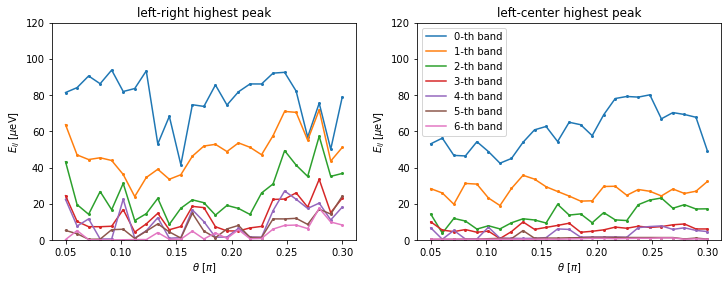

In [679]:
bands = range(7)
pair = 0

fig, ax = plt.subplots(ncols=2, figsize=(12, 4))
i = 0
for geometries_averages in averages_couplings_bands:
    pair = 0
    for axes in ax.flatten():
        axes.plot(geometries, 1e6*geometries_averages.T[pair], label=str(bands[i])+'-th band')
        axes.scatter(geometries, 1e6*geometries_averages.T[pair], s=4)
        pair += 1
    i += 1

i = 0
for axes in ax.flatten():
    axes.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
    axes.set_xlabel(r'$\theta$ [$\pi$]')
    axes.set_ylim(0, 120)
    axes.set_title(str(titles[i])+' highest peak')
    i += 1

ax[-1].legend()

plt.savefig(directory_path+'inverted_triangle_two_side_average_coupling.pdf')

# Inverted triangular geometry with wires at one side

## Set up parameters

In [2187]:
area = 1400*a**2
geometry = {
    "L": 130*a,
    "w": 7*a,
    "side": 'down',
    "area": area
}

In [2188]:
n_geometries = 25
angles = np.linspace(0.05, 0.3, n_geometries)

In [2189]:
mus_qd = np.linspace(-0.002, 0.002, 100)
key = 'mu_qd'
n = 6
directory_path = '../data/manuscript/inverted_triangle_angles_both_side/'

In [2190]:
os.system('mkdir '+directory_path)

mkdir: cannot create directory ‘../data/manuscript/inverted_triangle_angles_both_side/’: File exists


256

## Analyse results

In [2191]:
geometries = angles
geometry_parameter = r'$\theta[\pi]$'

In [2192]:
n_peaks = 2
prominence = 5e-6
width = 4
height = 0
peaks_kwargs = {'prominence': prominence, 'width': width, 'height': height}

In [2199]:
index = 0
# open raw simulation result
file = 'area_1400_band_'+str(index)+'th.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)

In [2207]:
limit = 4e-3

geometries_couplings = []
geometries_peaks = []
geometries_averages = []
geometries_widths = []

data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
for geometry in data_geometries:
    couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
    geometries_couplings.append(couplings)
    geometries_peaks.append(peaks)
    widths = []
    averaged_peaks = []
    for i in range(3):
        peaks[i] = peaks[i][mus_qd[peaks[i]] < limit]
        #print(couplings[i][peaks[i]])
        max_peak_arg = np.argmax(couplings[i][peaks[i]])
        #print(peaks[i][max_peak_arg])
        widths.append(2e-2*peak_widths(x=couplings[i], peaks=[peaks[i][max_peak_arg]])[0])
        averaged_peaks.append(np.max(couplings[i][peaks[i]]))
    geometries_widths.append(np.array(widths).flatten())
    geometries_averages.append(averaged_peaks)

geometries_couplings = np.array(geometries_couplings)
geometries_peaks = np.array(geometries_peaks)
geometries_widths = np.array(geometries_widths)
geometries_averages = np.array(geometries_averages)

inverse_triangle_1_angle_w = geometries_widths
inverse_triangle_1_angle_p = geometries_averages
inverse_triangle_1_angle_g = areas

In [2201]:
geometry = 0
pair = 0

couplings = 1e6*geometries_couplings[geometry][pair]
mus_qd_units = 1e3*mus_qd

In [2202]:
title = r'$\theta$ = '
units = r'[$\pi$]'

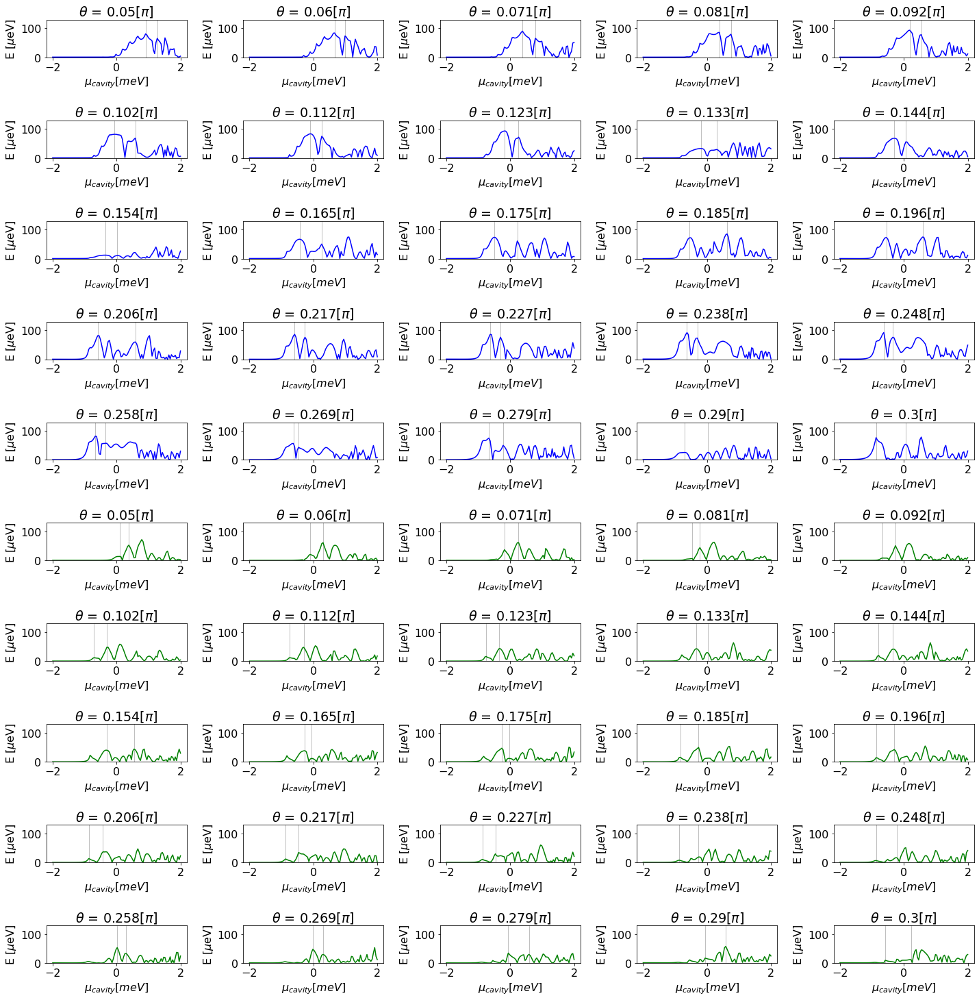

In [2203]:
pt.plot_couplings(
    n_geometries,
    geometries,
    mus_qd_units,
    geometries_peaks,
    geometries_couplings,
    title,
    units,
    n_cols=5,
    n_rows=10,
    figsize=(20, 20),
    ylim=130
)

In [2204]:
#averaged_widths = np.mean(geometries_widths.T, axis=0)
#averaged_peaks = np.mean(geometries_averages.T, axis=0)
averaged_widths = geometries_widths.T[0]
averaged_peaks = geometries_averages.T[0]

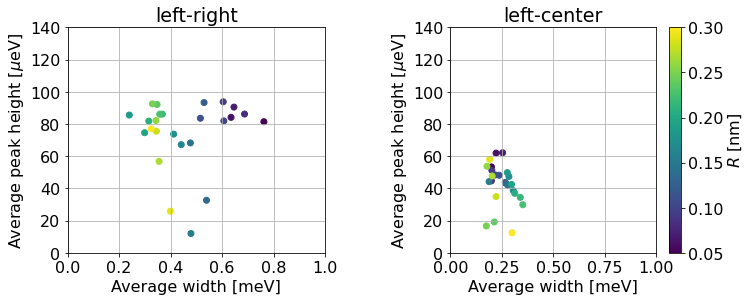

In [2206]:
cmap = cm.get_cmap('viridis')
pair = 0

fig, axes = plt.subplots(ncols=2, figsize=(10, 4))
fig.tight_layout(w_pad=5)

for ax in axes.flatten():
    plot = ax.scatter(2*geometries_widths.T[pair],
                      1e6*geometries_averages.T[pair],
                      c=angles,
                      cmap=cmap)
    ax.set_xlabel(r'Average width [meV]')
    ax.set_ylabel(r'Average peak height [$\mu$eV]')
    ax.set_title(titles[pair])
    ax.set_ylim(0, 140) 
    ax.grid()
    pair += 1
axes[0].set_xlim(0, 1)
axes[1].set_xlim(0, 1)
cb = fig.colorbar(plot, ax=axes[-1])
cb.set_label(r'$R$ [nm]')

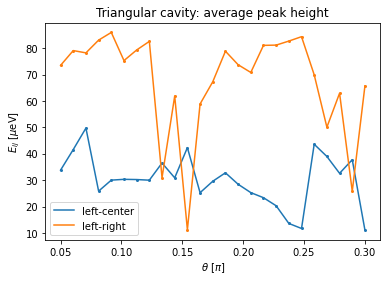

In [256]:
fig, ax = plt.subplots()

ax.plot(geometries, 1e6*geometries_averages.T[1], label='left-center')
ax.scatter(geometries, 1e6*geometries_averages.T[1], s=4)
ax.plot(geometries, 1e6*geometries_averages.T[0], label='left-right')
ax.scatter(geometries, 1e6*geometries_averages.T[0], s=4)

ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.set_xlabel(r'$\theta$ [$\pi$]')
ax.set_title(r'Triangular cavity: average peak height')

ax.legend()

In [667]:
averages_couplings_bands = []

n_peaks = 10
prominence = 0
width = 1
height = 0
peaks_kwargs = {'prominence': prominence, 'width': width, 'height': height}

for index in range(7):

    file = 'area_1400_band_'+str(index)+'th.pickle'
    with open(directory_path+file, 'rb') as data:
        result = pickle.load(data)

    geometries_averages = []

    data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
    for geometry in data_geometries:
        couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
        averaged_peaks = []
        for i in range(3):
            averaged_peaks.append(np.mean(couplings[i][peaks[i]]))

        geometries_averages.append(averaged_peaks)

    geometries_averages = np.array(geometries_averages)
    averages_couplings_bands.append(geometries_averages)

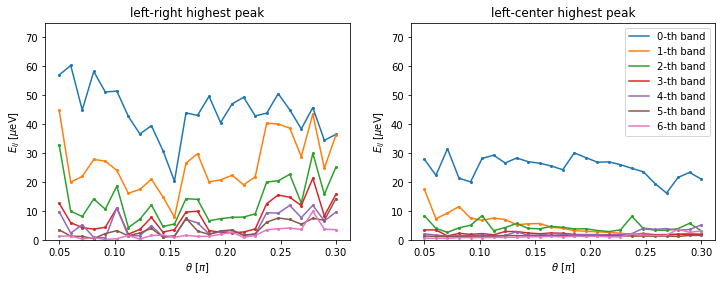

In [673]:
bands = range(7)
pair = 0

fig, ax = plt.subplots(ncols=2, figsize=(12, 4))
i = 0
for geometries_averages in averages_couplings_bands:
    pair = 0
    for axes in ax.flatten():
        axes.plot(geometries, 1e6*geometries_averages.T[pair], label=str(bands[i])+'-th band')
        axes.scatter(geometries, 1e6*geometries_averages.T[pair], s=4)
        pair += 1
    i += 1

i = 0
for axes in ax.flatten():
    axes.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
    axes.set_xlabel(r'$\theta$ [$\pi$]')
    axes.set_ylim(0, 75)
    axes.set_title(str(titles[i])+' highest peak')
    i += 1

ax[-1].legend()

plt.savefig(directory_path+'inverted_triangle_one_side_average_coupling.pdf')

# Triangular geometry with far wires at one side

## Set up parameters

In [1236]:
area = 1400*a**2
w = 7*a
geometry = {
    "l": 130*a,
    "w": w,
    "a": a,
    "side": 'down',
    "shape": 'triangle',
    "A": area
}

In [1237]:
n_geometries = 50
angles = np.linspace(0.05, 0.3, n_geometries)

In [1238]:
mus_qd = np.linspace(-0.002, 0.002, 200)
key = 'mu_qd'
n = 6
directory_path = '../data/manuscript/triangle_angles_one_side_far/'

## Analyse results

In [1239]:
geometries = angles
geometry_parameter = r'$\theta[\pi]$'

In [1258]:
n_peaks = 30
prominence = 0
peaks_kwargs = {'prominence': 0, 'width': 3, 'height': 5e-6}

In [1259]:
index = 0
# open raw simulation result
file = 'area_1400_wires_03_band_'+str(index)+'th.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)

In [1270]:
limit = 1.4e-3

geometries_couplings = []
geometries_peaks = []
geometries_averages = []
geometries_widths = []

data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
for geometry in data_geometries:
    couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
    geometries_couplings.append(couplings)
    geometries_peaks.append(peaks)
    widths = []
    averaged_peaks = []
    for i in range(3):
        peaks[i] = peaks[i][mus_qd[peaks[i]] < limit]
        #print(couplings[i][peaks[i]])
        max_peak_arg = np.argmax(couplings[i][peaks[i]])
        #print(peaks[i][max_peak_arg])
        widths.append(2e-2*peak_widths(x=couplings[i], peaks=[peaks[i][max_peak_arg]])[0])
        averaged_peaks.append(np.max(couplings[i][peaks[i]]))
    geometries_widths.append(np.array(widths).flatten())
    geometries_averages.append(averaged_peaks)

geometries_couplings = np.array(geometries_couplings)
geometries_peaks = np.array(geometries_peaks)
geometries_widths = np.array(geometries_widths)
geometries_averages = np.array(geometries_averages)

In [1271]:
geometry = 0
pair = 0

couplings = 1e6*geometries_couplings[geometry][pair]
mus_qd_units = 1e3*mus_qd

In [1272]:
title = r'$\theta$ = '
units = r'[$\pi$]'

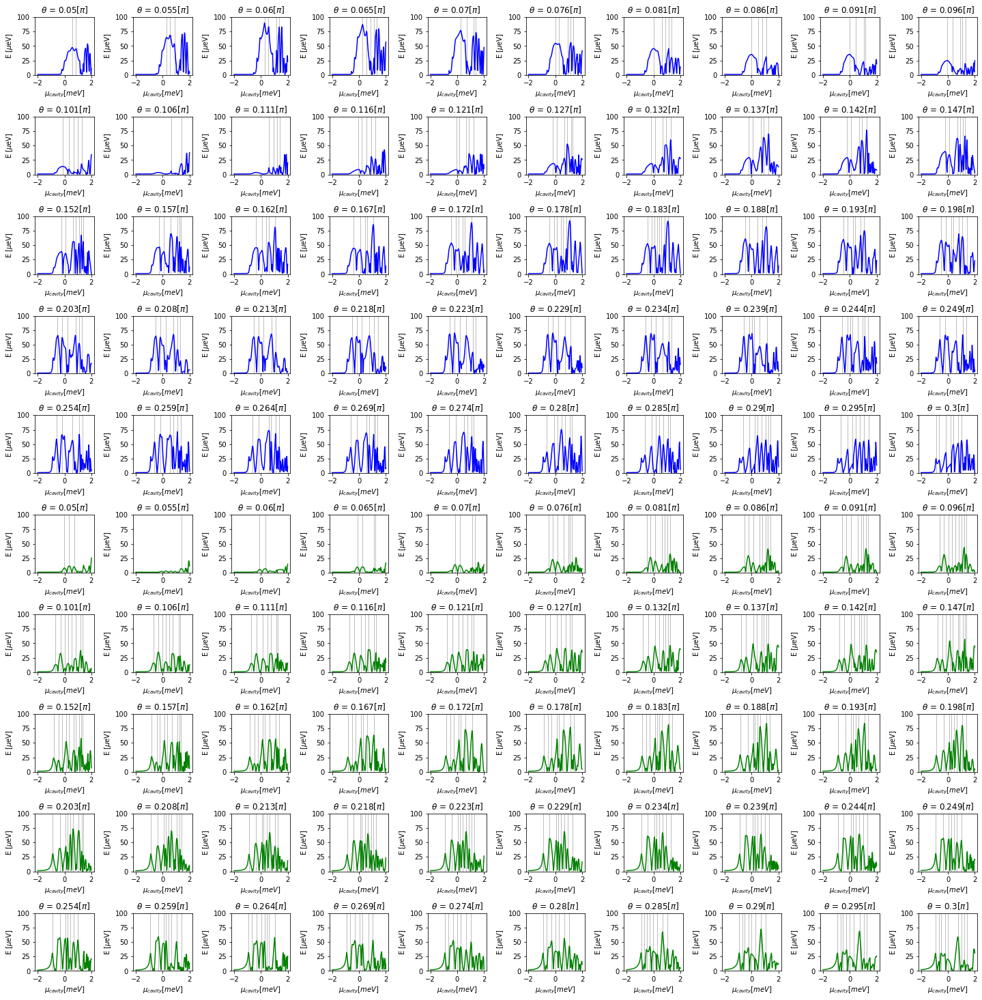

In [1273]:
pt.plot_couplings(
    n_geometries,
    geometries,
    mus_qd_units,
    geometries_peaks,
    geometries_couplings,
    title,
    units,
    n_cols=10,
    n_rows=10,
    figsize=(20, 20),
    ylim=100
)

In [1274]:
averaged_widths = np.mean(geometries_widths.T, axis=0)
averaged_peaks = np.mean(geometries_averages.T, axis=0)

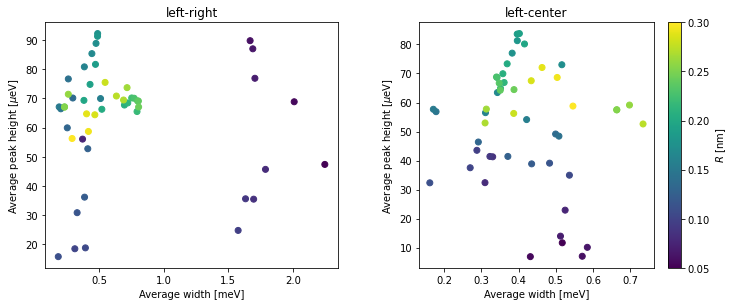

In [1275]:
pair = 1

cmap = cm.get_cmap('viridis')
pair = 0

fig, axes = plt.subplots(ncols=2, figsize=(10, 4))
fig.tight_layout(w_pad=5)

for ax in axes.flatten():
    plot = ax.scatter(2*geometries_widths.T[pair], 1e6*geometries_averages.T[pair], c=angles, cmap=cmap)
    ax.set_xlabel(r'Average width [meV]')
    ax.set_ylabel(r'Average peak height [$\mu$eV]')
    ax.set_title(titles[pair])
    #ax.set_xlim(0.1, 2.5)
    #ax.set_ylim(0, 200)
    pair += 1
cb = fig.colorbar(plot, ax=axes[-1])
cb.set_label(r'$R$ [nm]')

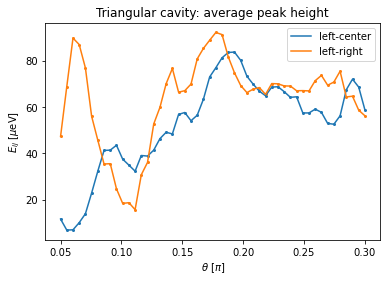

In [1276]:
fig, ax = plt.subplots()

ax.plot(geometries, 1e6*geometries_averages.T[1], label='left-center')
ax.scatter(geometries, 1e6*geometries_averages.T[1], s=4)
ax.plot(geometries, 1e6*geometries_averages.T[0], label='left-right')
ax.scatter(geometries, 1e6*geometries_averages.T[0], s=4)

ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.set_xlabel(r'$\theta$ [$\pi$]')
ax.set_title(r'Triangular cavity: average peak height')

ax.legend()

# Triangular geometry with far wires at both sides

## Set up parameters

In [1540]:
area = 900*a**2
w = 7*a
geometry = {
    "l": 130*a,
    "w": w,
    "a": a,
    "side": 'up',
    "shape": 'triangle',
    "A": area
}

In [1542]:
n_geometries = 25
angles = np.linspace(0.05, 0.3, n_geometries)

In [364]:
mus_qd = np.linspace(-0.002, 0.002, 200)
key = 'mu_qd'
n = 6
directory_path = '../data/manuscript/triangle_angles_both_sides_far/'

## Calculation

In [365]:
tjs = []
for theta in angles:
    geometry.update(angle=theta*np.pi)
    center = np.sqrt(np.abs(area/np.tan(theta*np.pi)))*0.4
    if center < 3*w/2:
        center = 10*a
    geometry.update(centers=[center, -center])
    trijunction, f_params, _ = tj.finite_system(**geometry)
    trijunction = trijunction.finalized()
    tjs.append([trijunction, f_params])

/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecati

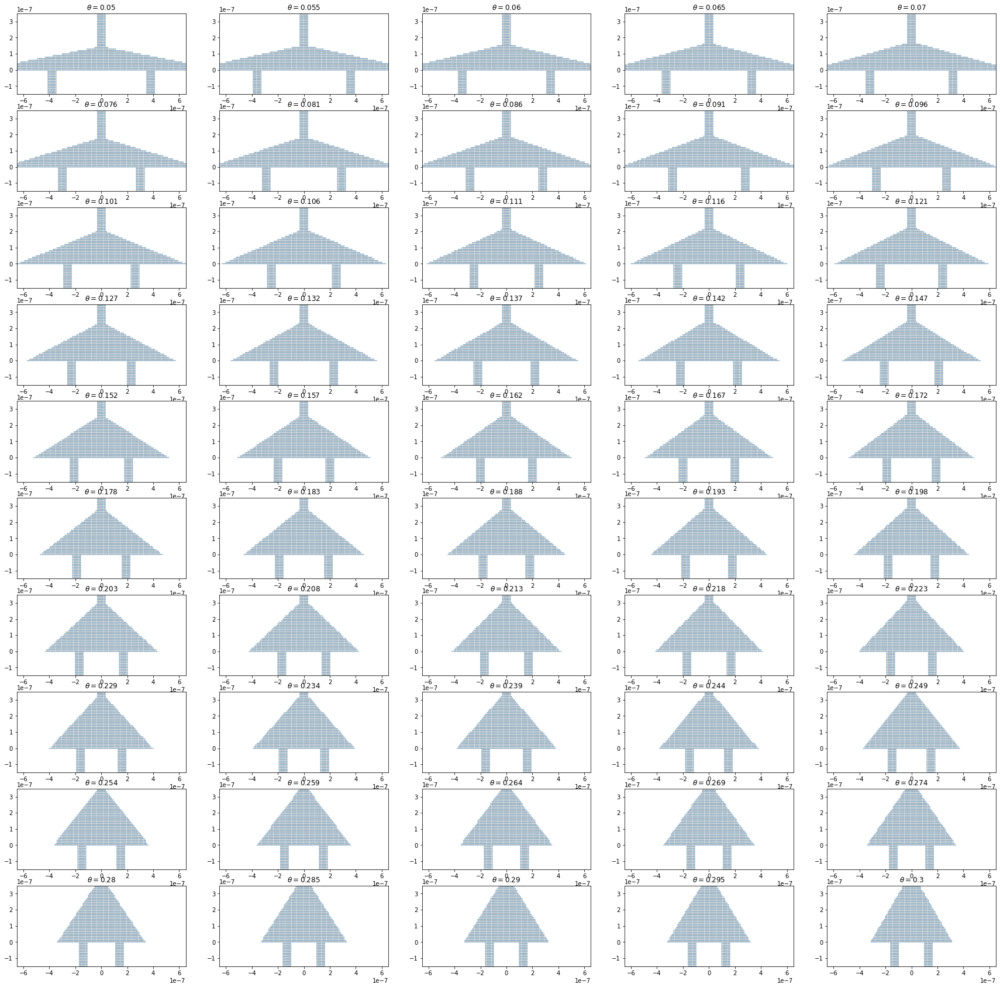

In [366]:
fig, ax = plt.subplots(ncols=int(n_geometries/10), nrows=10, figsize=(30, 30))
i = 0
for axes in ax.flatten():
    kwant.plot(tjs[i][0], ax=axes)
    axes.set_ylim(-1.5e-7, 3.5e-7)
    axes.set_xlim(-6.5e-7, 6.5e-7)
    axes.set_title(r'$\theta=$'+str(np.round(angles[i], 3)))
    #axes.set_xlim(-5e-7, 5e-7)
    #axes.set_title(r'$\theta/\pi$='+str(np.round(angles[i], 3)))
    i += 1

In [367]:
eigen = sl.solver(geometries=tjs, n=n, key=key)

def wrap(args):
    return eigen(*args)

In [368]:
os.system('mkdir ' + directory_path)

0

In [369]:
# execute calculation
index = 0
params = sl.finite_coupling_parameters(index=index)

args = list(it.product(range(n_geometries), mus_qd, params))
args_db = db.from_sequence(args, npartitions=40)

with Cluster(options) as cluster:
    cluster.scale(n=40)
    client = cluster.get_client()
    print("http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/"+cluster.dashboard_link[17:])

    result = args_db.map(wrap).compute()

path = directory_path + '/area_1400_wires_04_band_'+str(index)+'th.pickle'
with open(path, 'wb') as file:
    pickle.dump(result, file)

http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/6d41732a45aa4db9a092b485511498cd/status


## Analyse results

In [370]:
geometries = angles
geometry_parameter = r'$\theta[\pi]$'

In [386]:
n_peaks = 5
prominence = 1e-6
peaks_kwargs = {'prominence': 0, 'width': 0, 'height': 5e-6}

In [387]:
index = 0
# open raw simulation result
file = 'area_1400_wires_04_band_'+str(index)+'th.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)

In [388]:
geometries_couplings = []
geometries_peaks = []
geometries_averages = []
geometries_widths = []

data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
for geometry in data_geometries:
    couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
    geometries_couplings.append(couplings)
    geometries_peaks.append(peaks)
    widths = []
    averaged_peaks = []
    for i in range(3):
        widths.append(np.mean((2e-2*peak_widths(x=couplings[i], peaks=peaks[i])[0])))
        averaged_peaks.append(np.mean(couplings[i][peaks[i]]))
    geometries_widths.append(widths)
    geometries_averages.append(averaged_peaks)

geometries_couplings = np.array(geometries_couplings)
geometries_peaks = np.array(geometries_peaks)
geometries_widths = np.array(geometries_widths)
geometries_averages = np.array(geometries_averages)

In [389]:
geometry = 0
pair = 0

couplings = 1e6*geometries_couplings[geometry][pair]
mus_qd_units = 1e3*mus_qd

In [390]:
title = r'$\theta$ = '
units = r'[$\pi$]'

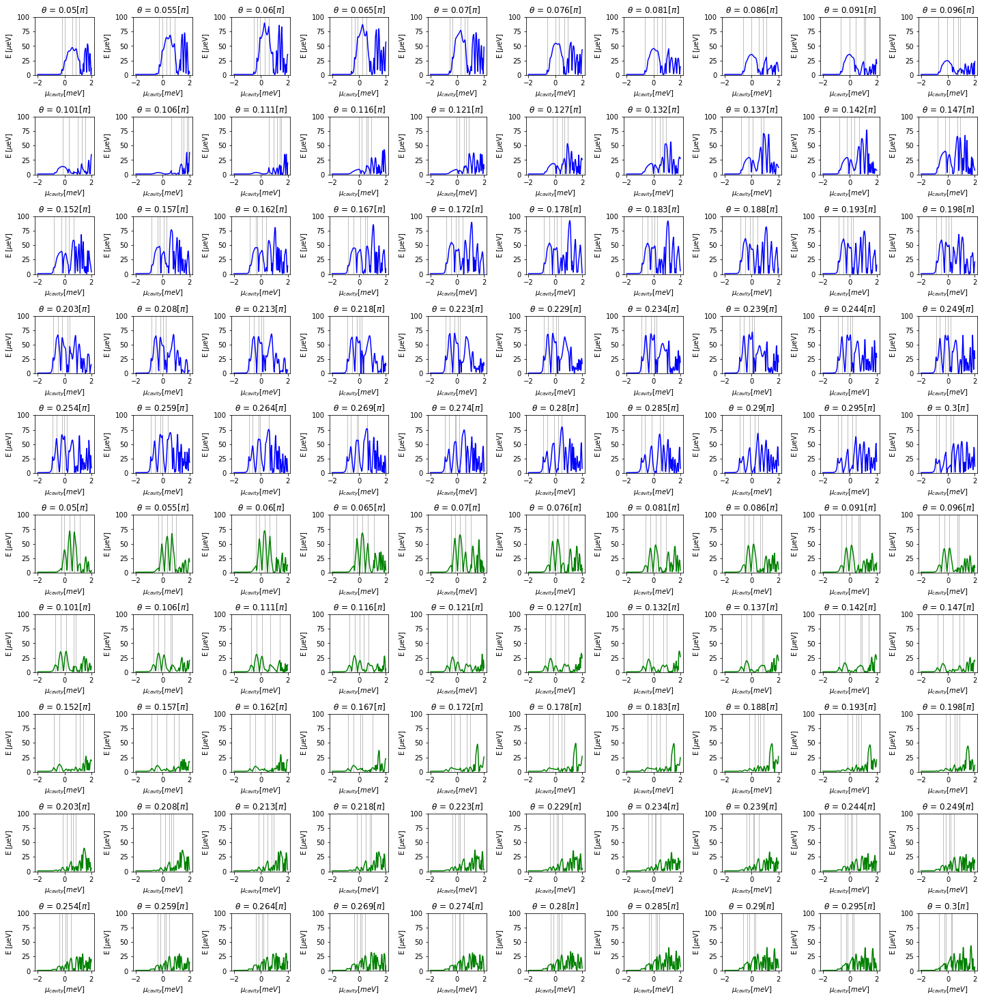

In [391]:
pt.plot_couplings(
    n_geometries,
    geometries,
    mus_qd_units,
    geometries_peaks,
    geometries_couplings,
    title,
    units,
    n_cols=10,
    n_rows=10,
    figsize=(20, 20),
    ylim=100
)

In [392]:
averaged_widths = np.mean(geometries_widths.T, axis=0)
averaged_peaks = np.mean(geometries_averages.T, axis=0)

Text(0.5, 1.0, 'Triangular cavity wires one side: device rating')

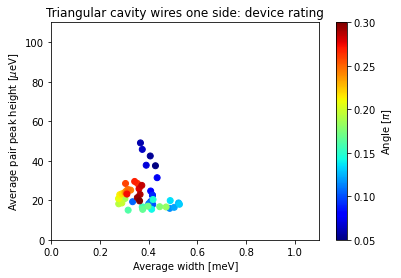

In [393]:
cmap = cm.get_cmap('jet')
pair = 1

fig, ax = plt.subplots()
plot = ax.scatter(2*averaged_widths, 1e6*averaged_peaks, c=angles, cmap=cmap)
ax.set_xlabel(r'Average width [meV]')
ax.set_ylabel(r'Average pair peak height [$\mu$eV]')
ax.set_xlim(0, 1.1)
ax.set_ylim(0, 110)
cb = fig.colorbar(plot, ax=ax)
cb.set_label(r'Angle [$\pi$]')

ax.set_title(r'Triangular cavity wires one side: device rating')

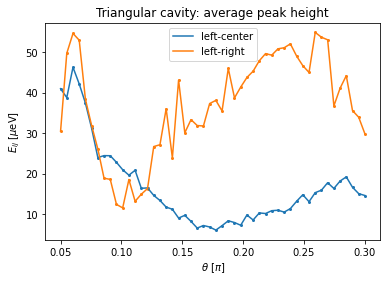

In [394]:
fig, ax = plt.subplots()

ax.plot(geometries, 1e6*geometries_averages.T[1], label='left-center')
ax.scatter(geometries, 1e6*geometries_averages.T[1], s=4)
ax.plot(geometries, 1e6*geometries_averages.T[0], label='left-right')
ax.scatter(geometries, 1e6*geometries_averages.T[0], s=4)

ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.set_xlabel(r'$\theta$ [$\pi$]')
ax.set_title(r'Triangular cavity: average peak height')

ax.legend()

# Triangular geometry with wires at one side move

## Set up parameters

In [88]:
area = 1200*a**2
w = 7*a
angle = 0.096*np.pi
geometry = {
    "l": 130*a,
    "w": w,
    "a": a,
    "side": 'down',
    "shape": 'triangle',
    "A": area,
    "angle": angle
}

In [89]:
n_geometries = 8
centers = np.linspace(10*a, 35*a, n_geometries)
reference = np.sqrt(np.abs(area/np.tan(theta*np.pi)))/2

In [90]:
mus_qd = np.linspace(-0.002, 0.002, 200)
key = 'mu_qd'
n = 6
directory_path = '../data/manuscript/triangle_angles_one_side_move/'

## Calculation

In [93]:
tjs = []
for center in centers:
    geometry.update(centers=[center, -center])
    trijunction, f_params, _ = tj.finite_system(**geometry)
    trijunction = trijunction.finalized()
    tjs.append([trijunction, f_params])

/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecati

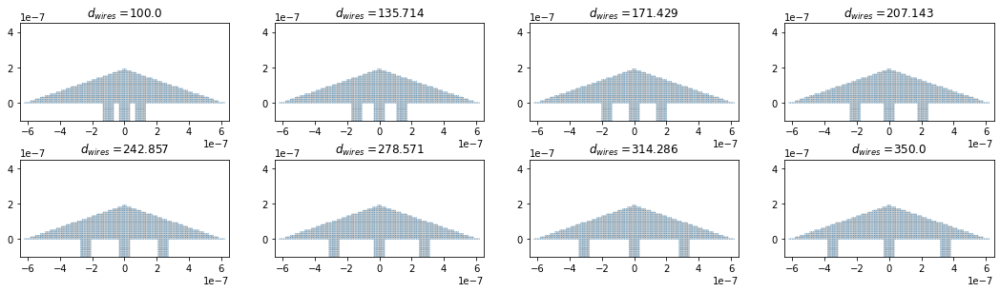

In [94]:
fig, ax = plt.subplots(ncols=int(n_geometries/2), nrows=2, figsize=(15, 4))
fig.tight_layout(h_pad=2, w_pad=1)

i = 0
for axes in ax.flatten():
    kwant.plot(tjs[i][0], ax=axes)
    axes.set_ylim(-1e-7, 4.5e-7)
    axes.set_xlim(-6.5e-7, 6.5e-7)
    axes.set_title(r'$d_{wires}$ ='+str(np.round(10e8*centers[i], 3)))
    #axes.set_xlim(-5e-7, 5e-7)
    #axes.set_title(r'$\theta/\pi$='+str(np.round(angles[i], 3)))
    i += 1

In [95]:
eigen = sl.solver(geometries=tjs, n=n, key=key)

def wrap(args):
    return eigen(*args)

In [96]:
os.system('mkdir ' + directory_path)

mkdir: cannot create directory ‘../data/manuscript/triangle_angles_one_side_move/’: File exists


256

In [97]:
# execute calculation
index = 0
params = sl.finite_coupling_parameters(index=index)

args = list(it.product(range(n_geometries), mus_qd, params))
args_db = db.from_sequence(args, npartitions=40)

with Cluster(options) as cluster:
    cluster.scale(n=40)
    client = cluster.get_client()
    print("http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/"+cluster.dashboard_link[17:])

    result = args_db.map(wrap).compute()

path = directory_path + '/area_1200_band_'+str(index)+'th.pickle'
with open(path, 'wb') as file:
    pickle.dump(result, file)

http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/2d5579eb89994964855434dc5d8c3f45/status


## Analyse results

In [98]:
geometries = centers/(2*reference)
geometry_parameter = r'$\theta[\pi]$'

In [99]:
n_peaks = 4
prominence = 1e-6
peaks_kwargs = {'prominence': 0, 'width': 3, 'height': 5e-6}

In [100]:
index = 0
# open raw simulation result
file = 'area_1200_band_'+str(index)+'th.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)

In [101]:
geometries_couplings = []
geometries_peaks = []
geometries_averages = []
geometries_widths = []

data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
for geometry in data_geometries:
    couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
    geometries_couplings.append(couplings)
    geometries_peaks.append(peaks)
    widths = []
    averaged_peaks = []
    for i in range(3):
        widths.append(np.mean((2e-2*peak_widths(x=couplings[i], peaks=peaks[i])[0])))
        averaged_peaks.append(np.mean(couplings[i][peaks[i]]))
    geometries_widths.append(widths)
    geometries_averages.append(averaged_peaks)

geometries_couplings = np.array(geometries_couplings)
geometries_peaks = np.array(geometries_peaks)
geometries_widths = np.array(geometries_widths)
geometries_averages = np.array(geometries_averages)

In [102]:
geometry = 0
pair = 0

couplings = 1e6*geometries_couplings[geometry][pair]
mus_qd_units = 1e3*mus_qd

In [103]:
title = r'$d_{wires}$ = '
units = r'[nm]'

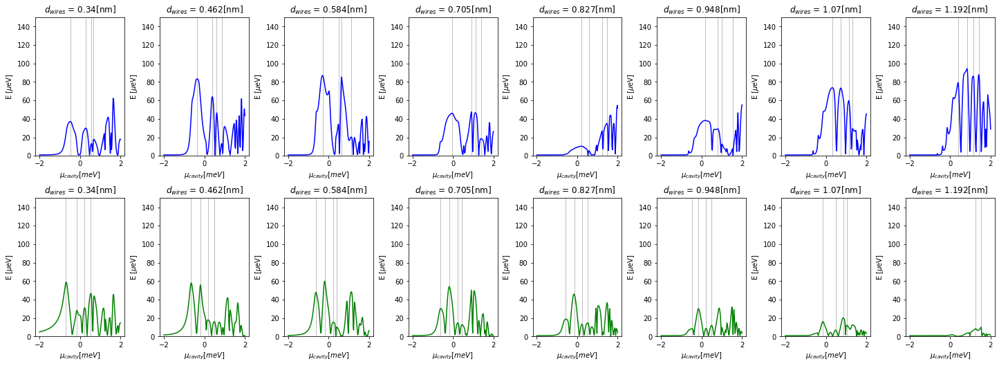

In [105]:
pt.plot_couplings(
    n_geometries,
    geometries,
    mus_qd_units,
    geometries_peaks,
    geometries_couplings,
    title,
    units,
    n_cols=8,
    n_rows=2,
    figsize=(20, 7)
)

In [106]:
averaged_widths = np.mean(geometries_widths.T, axis=0)
averaged_peaks = np.mean(geometries_averages.T, axis=0)

Text(0.5, 1.0, 'Triangular cavity wires one side: device rating')

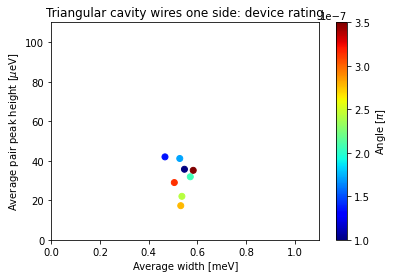

In [107]:
cmap = cm.get_cmap('jet')
pair = 1

fig, ax = plt.subplots()
plot = ax.scatter(2*averaged_widths, 1e6*averaged_peaks, c=centers, cmap=cmap)
ax.set_xlabel(r'Average width [meV]')
ax.set_ylabel(r'Average pair peak height [$\mu$eV]')
ax.set_xlim(0, 1.1)
ax.set_ylim(0, 110)
cb = fig.colorbar(plot, ax=ax)
cb.set_label(r'Angle [$\pi$]')

ax.set_title(r'Triangular cavity wires one side: device rating')

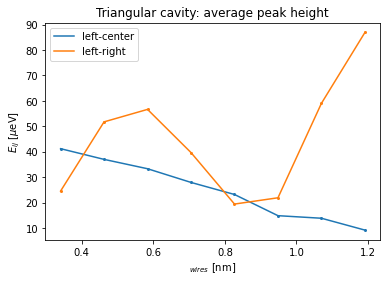

In [108]:
fig, ax = plt.subplots()

ax.plot(geometries, 1e6*geometries_averages.T[1], label='left-center')
ax.scatter(geometries, 1e6*geometries_averages.T[1], s=4)
ax.plot(geometries, 1e6*geometries_averages.T[0], label='left-right')
ax.scatter(geometries, 1e6*geometries_averages.T[0], s=4)

ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.set_xlabel(r'$_{wires}$ [nm]')
ax.set_title(r'Triangular cavity: average peak height')

ax.legend()

# Triangular geometry with wires at both sides

## Set up parameters

In [2632]:
area = 900*a**2
w = 7*a
geometry = {
    "l": 130*a,
    "w": w,
    "a": a,
    "side": 'up',
    "shape": 'triangle',
    "A": area
}

In [2633]:
n_geometries = 50
angles = np.linspace(0.05, 0.3, n_geometries)

In [2634]:
mus_qd = np.linspace(-0.002, 0.002, 100)
key = 'mu_qd'
n = 6
directory_path = '../data/manuscript/triangle_angles_two_side/'

## Analyse results

In [2446]:
geometries = angles
geometry_parameter = r'$\theta[\pi]$'

In [2447]:
n_peaks = 30
prominence = 0
width = 1
peaks_kwargs = {'prominence': prominence, 'width': width, 'height': 0}

In [2448]:
index = 0
# open raw simulation result
file = 'area_1200_band_'+str(index)+'th.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)

In [2449]:
limit = 4e-3

geometries_couplings = []
geometries_peaks = []
geometries_averages = []
geometries_widths = []

data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
for geometry in data_geometries:
    couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
    geometries_couplings.append(couplings)
    geometries_peaks.append(peaks)
    widths = []
    averaged_peaks = []
    for i in range(3):
        #peaks[i] = peaks[i][mus_qd[peaks[i]] < limit]
        #print(couplings[i][peaks[i]])
        max_peak_arg = np.argmax(couplings[i][peaks[i]])
        #print(peaks[i][max_peak_arg])
        widths.append(2e-2*peak_widths(x=couplings[i], peaks=[peaks[i][max_peak_arg]])[0])
        averaged_peaks.append(np.max(couplings[i][peaks[i]]))
    geometries_widths.append(np.array(widths).flatten())
    geometries_averages.append(averaged_peaks)

geometries_couplings = np.array(geometries_couplings)
geometries_peaks = np.array(geometries_peaks)
geometries_widths = np.array(geometries_widths)
geometries_averages = np.array(geometries_averages)

triangle_2_angles_w = geometries_widths
triangle_2_angles_p = geometries_averages
triangle_2_angles_g = areas

In [2450]:
geometry = 0
pair = 0
geometries = angles
couplings = 1e6*geometries_couplings[geometry][pair]
mus_qd_units = 1e3*mus_qd

In [2451]:
title = r'$\theta$ = '
units = r'[$\pi$]'

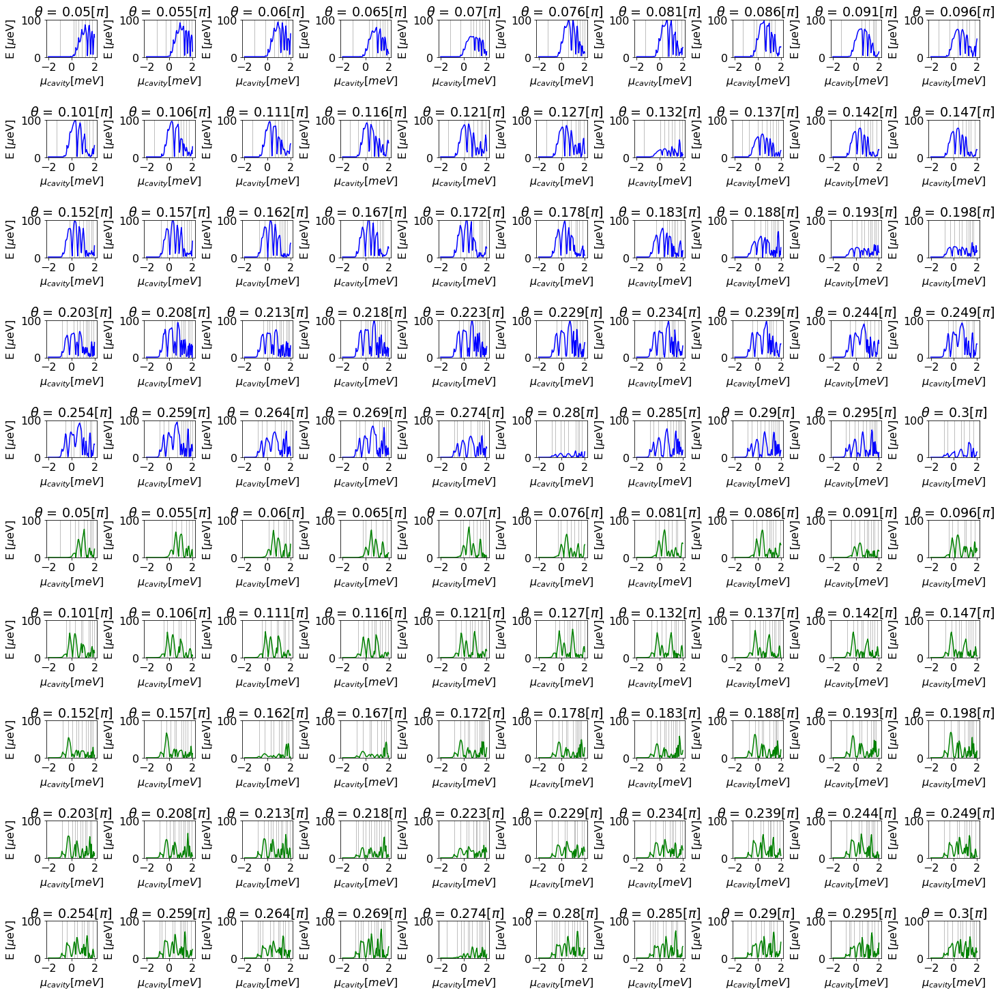

In [2452]:
pt.plot_couplings(
    n_geometries,
    geometries,
    mus_qd_units,
    geometries_peaks,
    geometries_couplings,
    title,
    units,
    n_cols=10,
    n_rows=10,
    figsize=(20, 20),
    ylim=100
)

In [2300]:
averaged_widths = np.mean(geometries_widths.T, axis=0)
averaged_peaks = np.mean(geometries_averages.T, axis=0)

averaged_widths_triangle_two_side = averaged_widths
averaged_peaks_triangle_two_side = averaged_peaks

ValueError: 'c' argument has 25 elements, which is inconsistent with 'x' and 'y' with size 50.

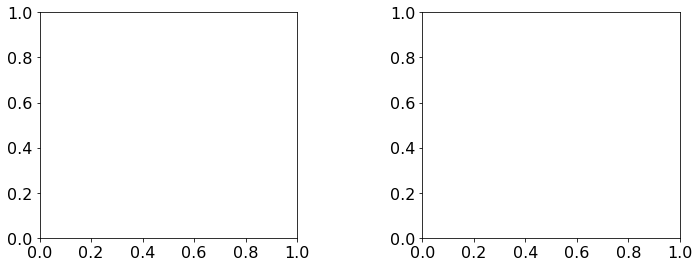

In [2313]:
cmap = cm.get_cmap('viridis')
pair = 0

fig, axes = plt.subplots(ncols=2, figsize=(10, 4))
fig.tight_layout(w_pad=5)

for ax in axes.flatten():
    plot = ax.scatter(2*geometries_widths.T[pair],
                      1e6*geometries_averages.T[pair],
                      c=angles,
                      cmap=cmap)
    ax.set_xlabel(r'Average width [meV]')
    ax.set_ylabel(r'Average peak height [$\mu$eV]')
    ax.set_title(titles[pair])
    ax.set_xlim(0, 0.8)
    ax.set_ylim(0, 140) 
    ax.grid()
    pair += 1
cb = fig.colorbar(plot, ax=axes[-1])
cb.set_label(r'$R$ [nm]')

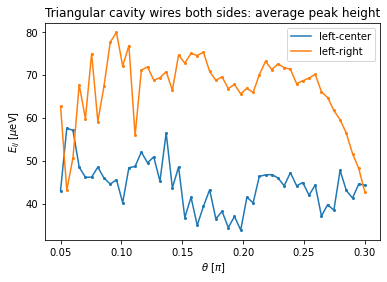

In [961]:
fig, ax = plt.subplots()

ax.plot(geometries, 1e6*geometries_averages.T[1], label='left-center')
ax.scatter(geometries, 1e6*geometries_averages.T[1], s=4)
ax.plot(geometries, 1e6*geometries_averages.T[0], label='left-right')
ax.scatter(geometries, 1e6*geometries_averages.T[0], s=4)

ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.set_xlabel(r'$\theta$ [$\pi$]')
ax.set_title(r'Triangular cavity wires both sides: average peak height')

ax.legend()

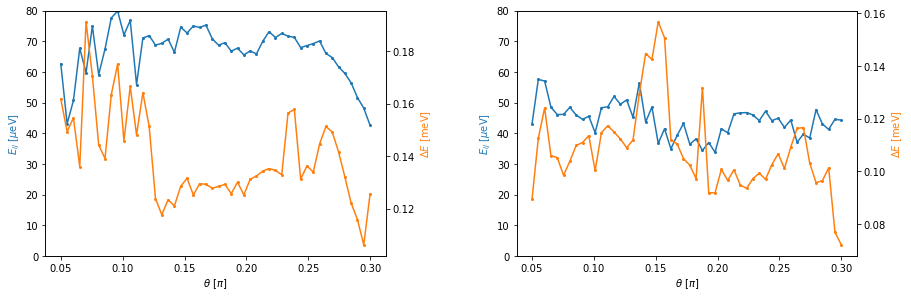

In [963]:
pair = 0
fig, axes = plt.subplots(ncols=2, figsize=(12, 4))
fig.tight_layout(w_pad=10, h_pad=2)

for ax in axes.flatten():
    ax.plot(geometries, 1e6*geometries_averages.T[pair], c='C0')
    ax.scatter(geometries, 1e6*geometries_averages.T[pair], s=4, c='C0')
    ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]', color='C0')
    ax.set_xlabel(r'$\theta$ [$\pi$]')
    ax.set_ylim(0, 80)

    ax2 = ax.twinx()
    ax2.plot(geometries, geometries_widths.T[pair], c='C1')
    ax2.scatter(geometries, geometries_widths.T[pair], s=4, c='C1')
    ax2.set_ylabel(r'$\Delta E$ [meV]', color='C1')
    ax2.set_xlabel(r'$\theta$ [$\pi$]')
    pair += 1

In [750]:
averages_couplings_bands = []

n_peaks = 6
prominence = 1e-6
width = 1
peaks_kwargs = {'prominence': prominence, 'width': width, 'height': 0}

for index in range(7):

    file = 'area_1400_band_'+str(index)+'th.pickle'
    with open(directory_path+file, 'rb') as data:
        result = pickle.load(data)

    geometries_averages = []

    data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
    for geometry in data_geometries:
        couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
        averaged_peaks = []
        for i in range(3):
            averaged_peaks.append(np.max(couplings[i][peaks[i]]))

        geometries_averages.append(averaged_peaks)

    geometries_averages = np.array(geometries_averages)
    averages_couplings_bands.append(geometries_averages)

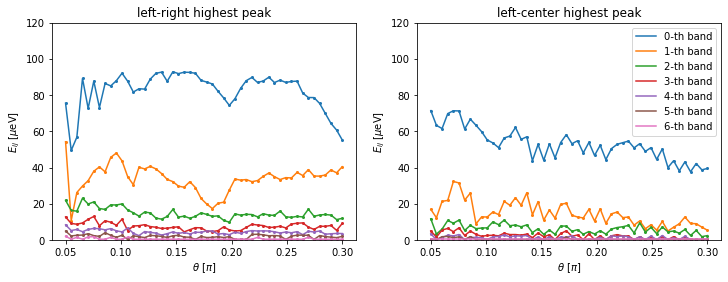

In [751]:
bands = range(7)
geometries = angles
pair = 0

fig, ax = plt.subplots(ncols=2, figsize=(12, 4))
i = 0
for geometries_averages in averages_couplings_bands:
    pair = 0
    for axes in ax.flatten():
        axes.plot(geometries, 1e6*geometries_averages.T[pair], label=str(bands[i])+'-th band')
        axes.scatter(geometries, 1e6*geometries_averages.T[pair], s=4)
        pair += 1
    i += 1

i = 0
for axes in ax.flatten():
    axes.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
    axes.set_xlabel(r'$\theta$ [$\pi$]')
    axes.set_ylim(0, 120)
    axes.set_title(str(titles[i])+' highest peak')
    i += 1

ax[-1].legend()
plt.savefig(directory_path+'triangle_two_side_average_coupling.pdf')

## Selected cases

### $\theta = 0.086 \pi$

In [2635]:
area = 1200*a**2
w = 7*a
theta = angles[7]
geometry = {
    "l": 130*a,
    "w": w,
    "a": a,
    "side": 'up',
    "shape": 'triangle',
    "A": area,
    "angle": theta*np.pi
}

center = np.sqrt(np.abs(area/np.tan(theta*np.pi)))/2
geometry.update(centers=[center, -center])

In [2636]:
trijunction, f_params, _ = tj.finite_system(**geometry)
trijunction = trijunction.finalized()

/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(


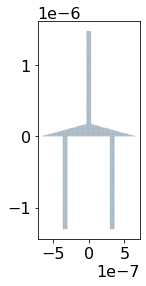

In [2637]:
kwant.plot(trijunction);

In [2647]:
n = 6
key = 'mu_qd'
mus_qd = np.linspace(-0.001, 0.001, 100)

In [2648]:
eigen = sl.solver(geometries=[[trijunction, f_params]], n=n, key=key, eigenvecs=True)


def wrap(args):
    return eigen(*args)

In [2649]:
index = 0
# open raw simulation result
file = 'ens_wfs_a_086.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)


In [2650]:
n_peaks = 4
prominence = 1e-6
peaks_kwargs = {'prominence': prominence, 'width': 0, 'height': 0}

In [2651]:
ens, wfs, peaks = tl.coupling_data(result, sign=1, n_peaks=n_peaks, eigenvecs=True, **peaks_kwargs)

In [2652]:
limit = -0.3e-3
for i in range(3):
    peaks[i] = peaks[i][mus_qd[peaks[i]] > limit]

In [2653]:
ens = np.array(ens)
wfs = np.array(wfs)

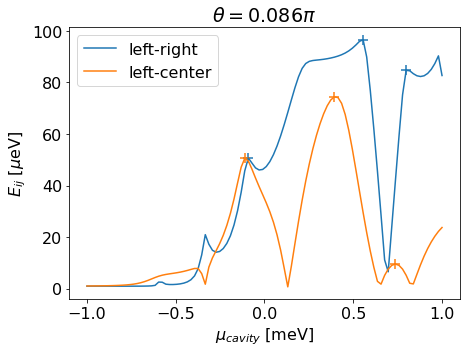

In [2659]:
fig, ax = plt.subplots(figsize=(7, 5))
labels = ['LR', 'LC', 'CR']
colors = ['black', 'red', 'red']
i = 0
for level in ens[:2]:
    ax.plot(1e3*mus_qd, 1e6*level, label=titles[i])
    ax.scatter(1e3*mus_qd[peaks[i]], 1e6*ens[i][peaks[i]], marker='+', s=100)
    i += 1
ax.set_xlabel(r'$\mu_{cavity}$ [meV]')
ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.set_title(r'$\theta=0.086\pi$')
ax.legend()
plt.savefig(directory_path+'example_coupling_086.pdf')

In [2655]:
density = kwant.operator.Density(trijunction, np.eye(4))

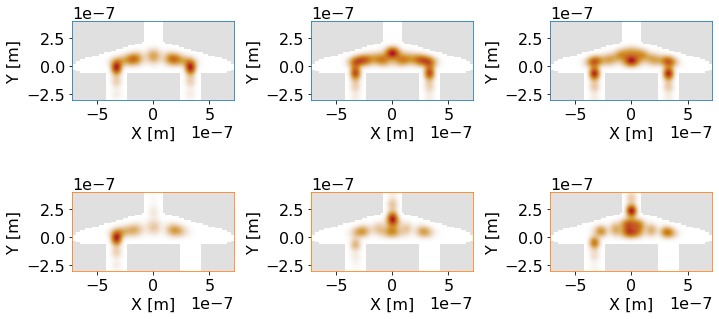

In [2657]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(10, 5))
fig.tight_layout(h_pad=1, w_pad=2)

i = 0
j = 0
for ax in axes.flatten():
    kwant.plotter.density(trijunction, density(wfs[j, peaks[j][i]]), ax=ax)
    ax.set_ylim(-3e-7, 4e-7)
    ax.set_xlabel(r'X [m]')
    ax.set_ylabel(r'Y [m]')
    for spine in ax.spines.values():
        if j == 0:
            spine.set_edgecolor('C0')
        else:
            spine.set_edgecolor('C1')
    i += 1
    if i == 3:
        i = 0
        j = 1
plt.savefig(directory_path+'example_wfs_086.pdf')

### $\theta = 0.096 \pi$

In [770]:
area = 1400*a**2
w = 7*a
theta = angles[9]
geometry = {
    "l": 130*a,
    "w": w,
    "a": a,
    "side": 'up',
    "shape": 'triangle',
    "A": area,
    "angle": theta*np.pi
}

center = np.sqrt(np.abs(area/np.tan(theta*np.pi)))/2
geometry.update(centers=[center, -center])

In [771]:
trijunction, f_params, _ = tj.finite_system(**geometry)
trijunction = trijunction.finalized()

/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(


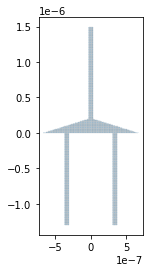

In [772]:
kwant.plot(trijunction);

In [773]:
n = 6
key = 'mu_qd'
mus_qd = np.linspace(-0.001, 0.001, 100)

In [774]:
eigen = sl.solver(geometries=[[trijunction, f_params]], n=n, key=key, eigenvecs=True)


def wrap(args):
    return eigen(*args)

In [775]:
%%time
# execute calculation
index = 0
phis = np.pi*max_phis[9]
params = sl.finite_coupling_parameters(index=index, phis=phis)

args = list(it.product([0], mus_qd, params))
args_db = db.from_sequence(args, npartitions=40)

with Cluster(options) as cluster:
    cluster.scale(n=40)
    client = cluster.get_client()
    print("http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/"+cluster.dashboard_link[17:])

    result = args_db.map(wrap).compute()

path = directory_path + '/ens_wfs_a_096.pickle'
with open(path, 'wb') as file:
    pickle.dump(result, file)

http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/05ffb1c258ab436fbe29ec45c0af7418/status
CPU times: user 6.26 s, sys: 2.94 s, total: 9.2 s
Wall time: 2min 43s


In [776]:
index = 0
# open raw simulation result
file = 'ens_wfs_a_096.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)


In [813]:
n_peaks = 4
prominence = 4e-6
peaks_kwargs = {'prominence': prominence, 'width': 0, 'height': 0}

In [814]:
ens, wfs, peaks = tl.coupling_data(result, sign=1, n_peaks=n_peaks, eigenvecs=True, **peaks_kwargs)

In [815]:
ens = np.array(ens)
wfs = np.array(wfs)

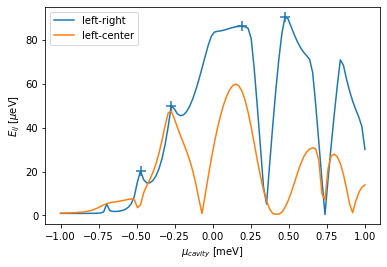

In [830]:
fig, ax = plt.subplots()
labels = ['LR', 'LC', 'CR']
colors = ['black', 'red', 'red']
i = 0
for level in ens[:2]:
    ax.plot(1e3*mus_qd, 1e6*level, label=titles[i])
    i += 1
ax.scatter(1e3*mus_qd[peaks[0]], 1e6*ens[0][peaks[0]], marker='+', s=100)
ax.set_xlabel(r'$\mu_{cavity}$ [meV]')
ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.legend()
plt.savefig(directory_path+'example_coupling_096.pdf')

In [831]:
density = kwant.operator.Density(trijunction, np.eye(4))

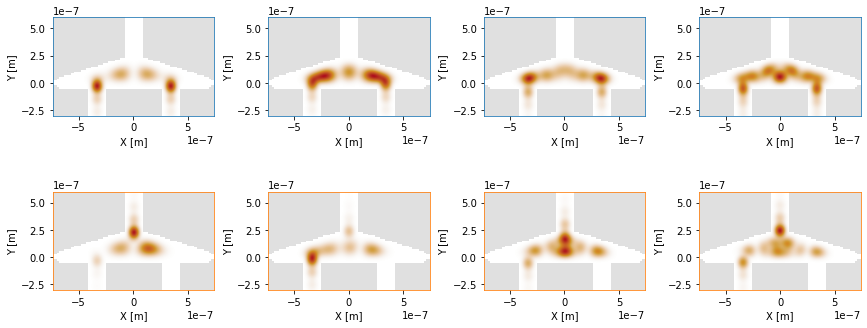

In [832]:
fig, axes = plt.subplots(nrows=2, ncols=n_peaks, figsize=(12, 5))
fig.tight_layout(h_pad=1, w_pad=2)

i = 0
j = 0
for ax in axes.flatten():
    kwant.plotter.density(trijunction, density(wfs[j, peaks[0][i]]), ax=ax)
    ax.set_ylim(-3e-7, 6e-7)
    ax.set_xlabel(r'X [m]')
    ax.set_ylabel(r'Y [m]')
    for spine in ax.spines.values():
        if j == 0:
            spine.set_edgecolor('C0')
        else:
            spine.set_edgecolor('C1')
    i += 1
    if i == n_peaks:
        i = 0
        j = 1
plt.savefig(directory_path+'example_wfs_096.pdf')

# Half ring cavity

## Set up parameters

In [1884]:
geometry = {
    "l": 130*a,
    "w": 7*a,
    "a": a,
    "side": 'up',
    "shape": 'ring',
}

In [1885]:
n_geometries = 50
rads = np.linspace([6*a, 21*a], [91*a, 106*a], n_geometries)

In [1886]:
mus_qd = np.linspace(-0.001, 0.003, 200)
key = 'mu_qd'
n = 6
directory_path = '../data/manuscript/half_ring/'

## Analysis

In [1887]:
geometries = rads[:, 0]
geometry_parameter = r'$R$'

In [1888]:
n_peaks = 10
prominence = 10e-6
peaks_kwargs = {'prominence': prominence, 'width': 1, 'height': 0}

In [1889]:
index = 0
# open raw simulation result
file = 'width_15_band_'+str(index)+'th.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)

In [1890]:
limit = 1.5e-3

geometries_couplings = []
geometries_peaks = []
geometries_averages = []
geometries_widths = []

data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
for geometry in data_geometries:
    couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
    geometries_couplings.append(couplings)
    geometries_peaks.append(peaks)
    widths = []
    averaged_peaks = []
    for i in range(3):
        peaks[i] = peaks[i][mus_qd[peaks[i]] < limit]
        #print(couplings[i][peaks[i]])
        max_peak_arg = np.argmax(couplings[i][peaks[i]])
        #print(peaks[i][max_peak_arg])
        widths.append(2e-2*peak_widths(x=couplings[i], peaks=[peaks[i][max_peak_arg]])[0])
        averaged_peaks.append(np.max(couplings[i][peaks[i]]))
    geometries_widths.append(np.array(widths).flatten())
    geometries_averages.append(averaged_peaks)

geometries_couplings = np.array(geometries_couplings)
geometries_peaks = np.array(geometries_peaks)
geometries_widths = np.array(geometries_widths)
geometries_averages = np.array(geometries_averages)

ring_size_w = geometries_widths
ring_size_p = geometries_averages
ring_size_g = geometries

In [1891]:
geometry = 0
pair = 0

couplings = 1e6*geometries_couplings[geometry][pair]
mus_qd_units = 1e3*mus_qd

In [1892]:
title = r'$R$ = '
units = r'[nm]'

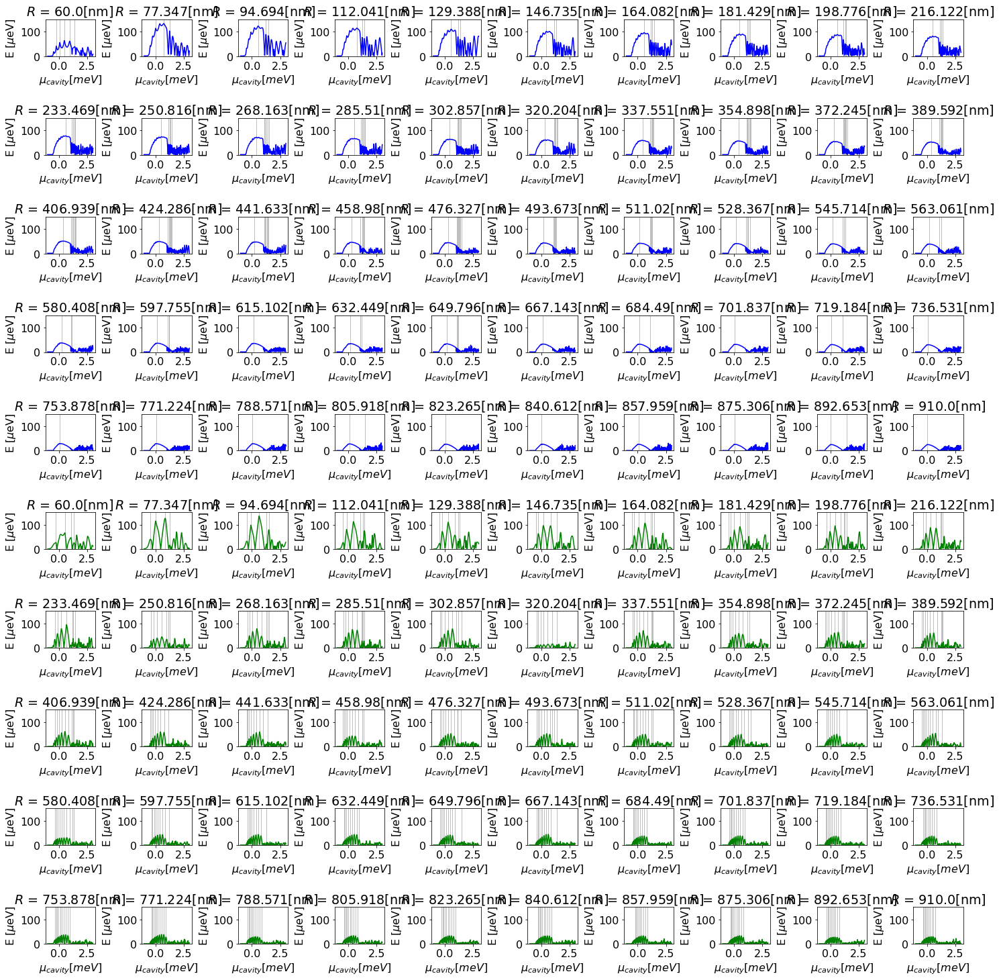

In [1893]:
pt.plot_couplings(
    n_geometries,
    1e9*geometries,
    mus_qd_units,
    geometries_peaks,
    geometries_couplings,
    title,
    units,
    n_cols=10,
    n_rows=10,
    figsize=(20, 20)
)

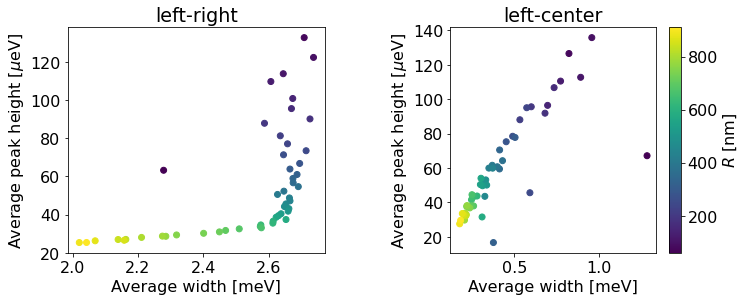

In [1894]:
pair = 1

cmap = cm.get_cmap('viridis')
pair = 0

fig, axes = plt.subplots(ncols=2, figsize=(10, 4))
fig.tight_layout(w_pad=5)

for ax in axes.flatten():
    plot = ax.scatter(2*geometries_widths.T[pair], 1e6*geometries_averages.T[pair], c=1e9*rads[:, 0], cmap=cmap)
    ax.set_xlabel(r'Average width [meV]')
    ax.set_ylabel(r'Average peak height [$\mu$eV]')
    ax.set_title(titles[pair])
    #ax.set_xlim(0.1, 2.5)
    #ax.set_ylim(0, 200)
    pair += 1
cb = fig.colorbar(plot, ax=axes[-1])
cb.set_label(r'$R$ [nm]')

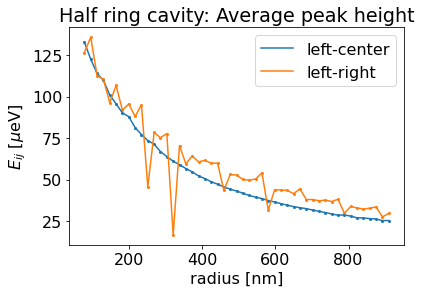

In [1895]:
fig, ax = plt.subplots()

ax.plot(1e9*geometries[1:], 1e6*geometries_averages.T[0][1:], label='left-center')
ax.scatter(1e9*geometries[1:], 1e6*geometries_averages.T[0][1:], s=4)
ax.plot(1e9*geometries[1:], 1e6*geometries_averages.T[2][1:], label='left-right')
ax.scatter(1e9*geometries[1:], 1e6*geometries_averages.T[2][1:], s=4)

ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.set_xlabel(r'radius [nm]')
ax.set_title(r'Half ring cavity: Average peak height')

ax.legend()
plt.savefig(directory_path+'W_11_size.svg')

In [1896]:
limit = 1e-3
averages_couplings_bands = []

n_peaks = 10
prominence = 10e-6
peaks_kwargs = {'prominence': prominence, 'width': 1, 'height': 0}

peaks_kwargs_2 = {'prominence': 0, 'width': 0, 'height': 0}

for index in range(7):

    file = 'width_15_band_'+str(index)+'th.pickle'
    with open(directory_path+file, 'rb') as data:
        result = pickle.load(data)

    geometries_averages = []

    data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
    for geometry in data_geometries:
        if index != 0:
            peaks_kwargs = peaks_kwargs_2
        couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
        averaged_peaks = []

        for i in range(3):
            if index == 0:
                peaks[i] = peaks[i][mus_qd[peaks[i]] < limit]
            averaged_peaks.append(np.mean(couplings[i][peaks[i]]))

        geometries_averages.append(averaged_peaks)

    geometries_averages = np.array(geometries_averages)
    averages_couplings_bands.append(geometries_averages)

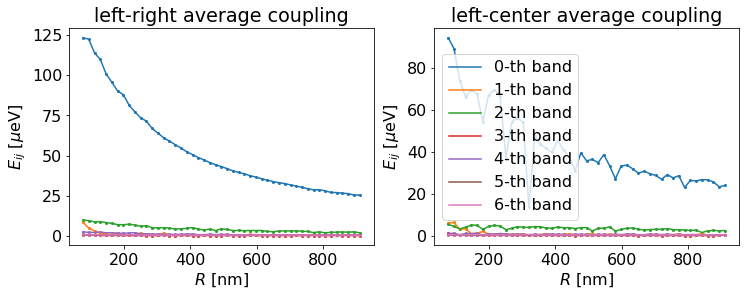

In [1897]:
bands = range(7)
pair = 0

fig, ax = plt.subplots(ncols=2, figsize=(12, 4))
i = 0
for geometries_averages in averages_couplings_bands:
    pair = 0
    for axes in ax.flatten():
        axes.plot(1e9*geometries[1:], 1e6*geometries_averages.T[pair][1:], label=str(bands[i])+'-th band')
        axes.scatter(1e9*geometries[1:], 1e6*geometries_averages.T[pair][1:], s=4)
        pair += 1
    i += 1

i = 0
for axes in ax.flatten():
    axes.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
    axes.set_xlabel(r'$R$ [nm]')
    #axes.set_ylim(0, 90)
    axes.set_title(str(titles[i])+' average coupling')
    i += 1

ax[-1].legend()

plt.savefig(directory_path+'ring_average_coupling.pdf')

In [1898]:
ring_band_averages = []
for geometry_data in averages_couplings_bands:
    ring_band_averages.append(np.mean(geometry_data, axis=0))
ring_band_averages = np.array(ring_band_averages)

## Wavefunctions for selected cases

### $R = 400$ [nm] and $W = 110$ [nm]

In [447]:
geometry = {
    "l": 130*a,
    "w": 7*a,
    "a": a,
    "side": 'up',
    "shape": 'ring',
    "R": 4.12857143e-07,
    "r": 3.02857143e-07
}

In [448]:
trijunction, f_params, _ = tj.finite_system(**geometry)
trijunction = trijunction.finalized()

/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(


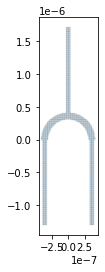

In [449]:
kwant.plot(trijunction);

In [434]:
n = 6
key = 'mu_qd'
mus_qd = np.linspace(-0.001, 0.002, 100)

In [357]:
eigen = sl.solver(geometries=[[trijunction, f_params]], n=n, key=key, eigenvecs=True)


def wrap(args):
    return eigen(*args)

In [113]:
# execute calculation
index = 0
params = sl.finite_coupling_parameters(index=index)

args = list(it.product([0], mus_qd, params))
args_db = db.from_sequence(args, npartitions=40)

with Cluster(options) as cluster:
    cluster.scale(n=40)
    client = cluster.get_client()
    print("http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/"+cluster.dashboard_link[17:])

    result = args_db.map(wrap).compute()

path = directory_path + '/ens_wfs_R_260.pickle'
with open(path, 'wb') as file:
    pickle.dump(result, file)

http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/9bf5b4f12351436c950dad2368989649/status


In [358]:
index = 0
# open raw simulation result
file = 'ens_wfs_R_260.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)

In [429]:
file = 'ens_wfs_R_260.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)

In [430]:
n_peaks = 5
prominence = 10e-6
peaks_kwargs = {'prominence': prominence, 'width': 0, 'height': 0}

In [431]:
ens, wfs, peaks = tl.coupling_data(result, sign=1, n_peaks=n_peaks, eigenvecs=True, **peaks_kwargs)

In [432]:
ens = np.array(ens)
wfs = np.array(wfs)

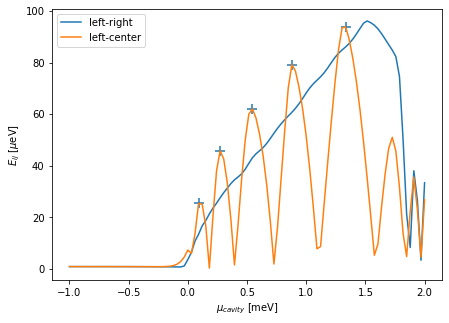

In [471]:
fig, ax = plt.subplots(figsize=(7, 5))

i = 0
for level in ens[:2]:
    ax.plot(1e3*mus_qd, 1e6*level, label=titles[i])
    i += 1
ax.scatter(1e3*mus_qd[peaks[1]], 1e6*level[peaks[1]], marker='+', s=100)
ax.set_xlabel(r'$\mu_{cavity}$ [meV]')
ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.legend()

plt.savefig(directory_path+'example_coupling.pdf')

In [451]:
density = kwant.operator.Density(trijunction, np.eye(4))

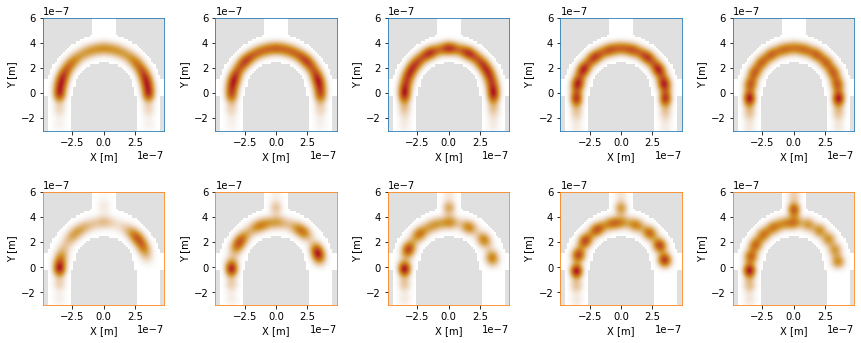

In [469]:
fig, axes = plt.subplots(nrows=2, ncols=n_peaks, figsize=(12, 5))
fig.tight_layout(h_pad=1, w_pad=2)

i = 0
j = 0
for ax in axes.flatten():
    kwant.plotter.density(trijunction, density(wfs[j, peaks[1][i]]), ax=ax)
    ax.set_ylim(-3e-7, 6e-7)
    ax.set_xlabel(r'X [m]')
    ax.set_ylabel(r'Y [m]')
    for spine in ax.spines.values():
        if j == 0:
            spine.set_edgecolor('C0')
        else:
            spine.set_edgecolor('C1')
    i += 1
    if i == 5:
        i = 0
        j = 1
plt.savefig(directory_path+'example_wfs.pdf')

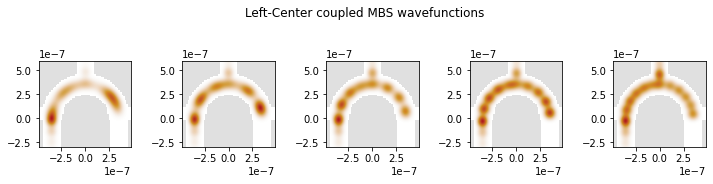

In [367]:
fig, axes = plt.subplots(nrows=1, ncols=n_peaks, figsize=(10, 3))
fig.tight_layout(h_pad=1, w_pad=2)
fig.suptitle(r'Left-Center coupled MBS wavefunctions')

i = 0
for ax in axes.flatten():
    kwant.plotter.density(trijunction, density(wfs[1, peaks[1][i]]), ax=ax)
    ax.set_ylim(-3e-7, 6e-7)
    i += 1

# Y shaped cavity size

In [1865]:
angle = np.pi*0.23
geometry = {
    "l": 130*a,
    "w": 7*a,
    "a": a,
    "side": 'up',
    "shape": 'y',
    "angle": angle,
    "radius": 0*a,
    "w_v": 15*a
}

In [1866]:
n_geometries = 50
areas = np.linspace(500, 3000, n_geometries)
geometries=areas

In [1867]:
mus_qd = np.linspace(-1e-3, 3e-3, 100)
key = 'mu_qd'
n = 6
directory_path = '../data/manuscript/y_shaped/'

## Analysis

In [ ]:
geometries = areas
geometry_parameter = r'$A$'

In [ ]:
n_peaks = 10
prominence = 10e-6
peaks_kwargs = {'prominence': prominence, 'width': 1, 'height': 0}

In [ ]:
index = 0
# open raw simulation result
file = 'band_'+str(index)+'th.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)

In [ ]:
limit = 1e-3

geometries_couplings = []
geometries_peaks = []
geometries_averages = []
geometries_widths = []

data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
for geometry in data_geometries:
    couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
    geometries_couplings.append(couplings)
    geometries_peaks.append(peaks)
    widths = []
    averaged_peaks = []
    for i in range(3):
        #peaks[i] = peaks[i][mus_qd[peaks[i]] < limit]
        #print(couplings[i][peaks[i]])
        max_peak_arg = np.argmax(couplings[i][peaks[i]])
        #print(peaks[i][max_peak_arg])
        widths.append(2e-2*peak_widths(x=couplings[i], peaks=[peaks[i][max_peak_arg]])[0])
        averaged_peaks.append(np.max(couplings[i][peaks[i]]))
    geometries_widths.append(np.array(widths).flatten())
    geometries_averages.append(averaged_peaks)

geometries_couplings = np.array(geometries_couplings)
geometries_peaks = np.array(geometries_peaks)
geometries_widths = np.array(geometries_widths)
geometries_averages = np.array(geometries_averages)

y_size_w = geometries_widths
y_size_p = geometries_averages
y_size_g = geometries

In [ ]:
geometry = 0
pair = 0

couplings = 1e6*geometries_couplings[geometry][pair]
mus_qd_units = 1e3*mus_qd

In [ ]:
title = r'$R$ = '
units = r'[nm]'

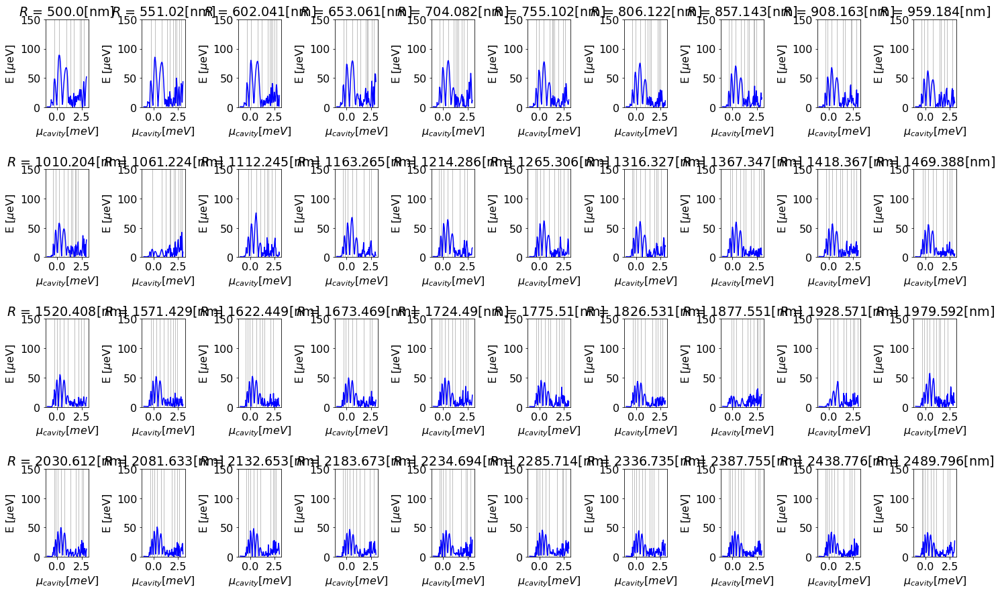

In [1874]:
pt.plot_couplings(
    n_geometries,
    geometries,
    mus_qd_units,
    geometries_peaks,
    geometries_couplings,
    title,
    units,
    n_cols=10,
    n_rows=4,
    figsize=(20, 12)
)

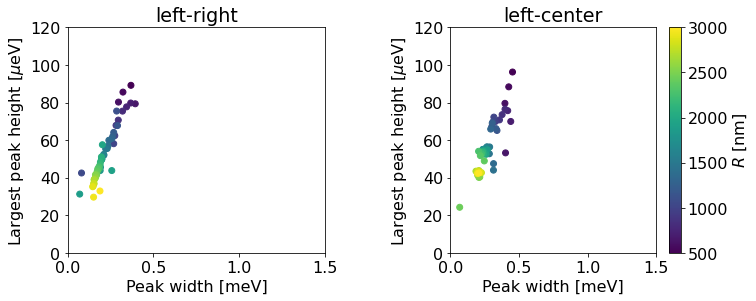

In [1875]:
pair = 1

cmap = cm.get_cmap('viridis')
pair = 0

fig, axes = plt.subplots(ncols=2, figsize=(10, 4))
fig.tight_layout(w_pad=5)

for ax in axes.flatten():
    plot = ax.scatter(2*geometries_widths.T[pair], 1e6*geometries_averages.T[pair], c=geometries, cmap=cmap)
    ax.set_xlabel(r'Peak width [meV]')
    ax.set_ylabel(r'Largest peak height [$\mu$eV]')
    ax.set_title(titles[pair])
    ax.set_xlim(0, 1.5)
    ax.set_ylim(0, 120)
    pair += 1
cb = fig.colorbar(plot, ax=axes[-1])
cb.set_label(r'$R$ [nm]')

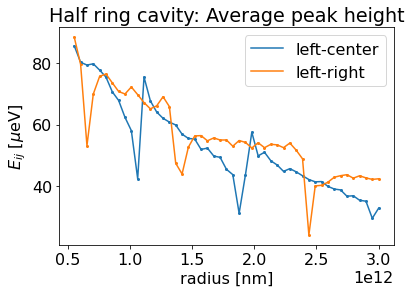

In [1876]:
fig, ax = plt.subplots()

ax.plot(1e9*geometries[1:], 1e6*geometries_averages.T[0][1:], label='left-center')
ax.scatter(1e9*geometries[1:], 1e6*geometries_averages.T[0][1:], s=4)
ax.plot(1e9*geometries[1:], 1e6*geometries_averages.T[2][1:], label='left-right')
ax.scatter(1e9*geometries[1:], 1e6*geometries_averages.T[2][1:], s=4)

ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.set_xlabel(r'radius [nm]')
ax.set_title(r'Half ring cavity: Average peak height')

ax.legend()
plt.savefig(directory_path+'W_11_size.svg')

In [1877]:
limit = 1e-3
averages_couplings_bands = []

n_peaks = 10
prominence = 10e-6
peaks_kwargs = {'prominence': prominence, 'width': 1, 'height': 0}

peaks_kwargs_2 = {'prominence': 0, 'width': 0, 'height': 0}

for index in range(7):

    file = 'band_'+str(index)+'th.pickle'
    with open(directory_path+file, 'rb') as data:
        result = pickle.load(data)

    geometries_averages = []

    data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
    for geometry in data_geometries:
        if index != 0:
            peaks_kwargs = peaks_kwargs_2
        couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
        averaged_peaks = []

        for i in range(3):
            if index == 0:
                peaks[i] = peaks[i][mus_qd[peaks[i]] < limit]
            averaged_peaks.append(np.mean(couplings[i][peaks[i]]))

        geometries_averages.append(averaged_peaks)

    geometries_averages = np.array(geometries_averages)
    averages_couplings_bands.append(geometries_averages)

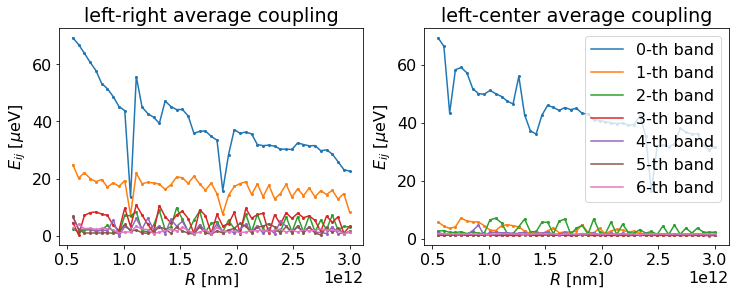

In [1878]:
bands = range(7)
pair = 0

fig, ax = plt.subplots(ncols=2, figsize=(12, 4))
i = 0
for geometries_averages in averages_couplings_bands:
    pair = 0
    for axes in ax.flatten():
        axes.plot(1e9*geometries[1:], 1e6*geometries_averages.T[pair][1:], label=str(bands[i])+'-th band')
        axes.scatter(1e9*geometries[1:], 1e6*geometries_averages.T[pair][1:], s=4)
        pair += 1
    i += 1

i = 0
for axes in ax.flatten():
    axes.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
    axes.set_xlabel(r'$R$ [nm]')
    #axes.set_ylim(0, 90)
    axes.set_title(str(titles[i])+' average coupling')
    i += 1

ax[-1].legend()

plt.savefig(directory_path+'average_coupling.pdf')

In [1879]:
Y_band_averages = []
for geometry_data in averages_couplings_bands:
    Y_band_averages.append(np.mean(geometry_data, axis=0))
Y_band_averages = np.array(Y_band_averages)

# Y shaped cavity angle

In [2011]:
angle = np.pi*0.23
area = 1000*a**2
geometry = {
    "l": 130*a,
    "w": 7*a,
    "a": a,
    "side": 'up',
    "shape": 'y',
    "angle": angle,
    "radius": 0*a,
    "w_v": 15*a,
    "A": area
}

In [2012]:
n_geometries = 25
angles = np.linspace(0.05, 0.3, n_geometries)
geometries=angles

In [2013]:
mus_qd = np.linspace(-1e-3, 3e-3, 100)
key = 'mu_qd'
n = 6
directory_path = '../data/manuscript/y_shaped_angle/'

## Analysis

In [2014]:
geometries = areas
geometry_parameter = r'$\theta$'

In [2015]:
n_peaks = 30
prominence = 0
peaks_kwargs = {'prominence': prominence, 'width': 1, 'height': 0}

In [2016]:
index = 0
# open raw simulation result
file = 'band_'+str(index)+'th.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)

In [2017]:
limit = 1e-3

geometries_couplings = []
geometries_peaks = []
geometries_averages = []
geometries_widths = []

data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
for geometry in data_geometries:
    couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
    geometries_couplings.append(couplings)
    geometries_peaks.append(peaks)
    widths = []
    averaged_peaks = []
    for i in range(3):
        #peaks[i] = peaks[i][mus_qd[peaks[i]] < limit]
        #print(couplings[i][peaks[i]])
        max_peak_arg = np.argmax(couplings[i][peaks[i]])
        #print(peaks[i][max_peak_arg])
        widths.append(2e-2*peak_widths(x=couplings[i], peaks=[peaks[i][max_peak_arg]])[0])
        averaged_peaks.append(np.max(couplings[i][peaks[i]]))
    geometries_widths.append(np.array(widths).flatten())
    geometries_averages.append(averaged_peaks)

geometries_couplings = np.array(geometries_couplings)
geometries_peaks = np.array(geometries_peaks)
geometries_widths = np.array(geometries_widths)
geometries_averages = np.array(geometries_averages)

y_angle_w = geometries_widths
y_angle_p = geometries_averages

In [1759]:
geometry = 0
pair = 0

couplings = 1e6*geometries_couplings[geometry][pair]
mus_qd_units = 1e3*mus_qd

In [1760]:
title = r'$\theta$ = '
units = r'[$\pi$]'

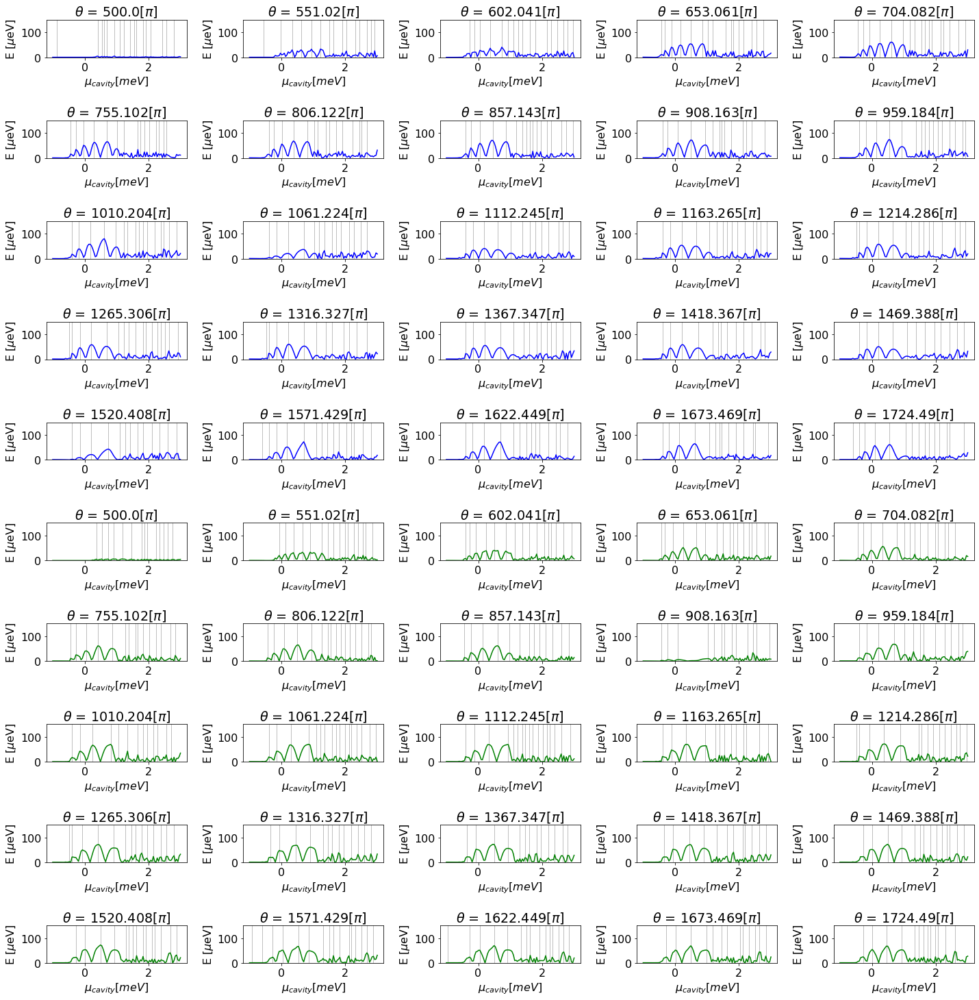

In [1763]:
pt.plot_couplings(
    n_geometries,
    geometries,
    mus_qd_units,
    geometries_peaks,
    geometries_couplings,
    title,
    units,
    n_cols=5,
    n_rows=10,
    figsize=(20, 20)
)

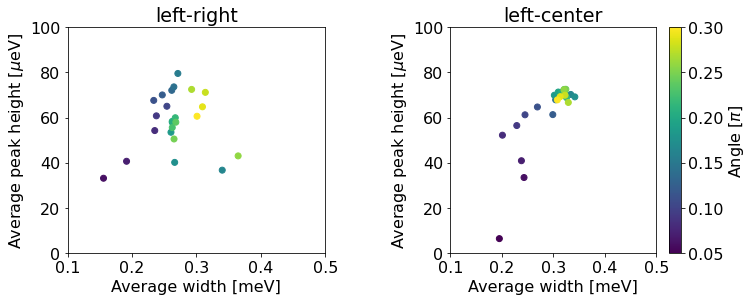

In [1764]:
pair = 1

cmap = cm.get_cmap('viridis')
pair = 0

fig, axes = plt.subplots(ncols=2, figsize=(10, 4))
fig.tight_layout(w_pad=5)

for ax in axes.flatten():
    plot = ax.scatter(2*geometries_widths.T[pair], 1e6*geometries_averages.T[pair], c=angles, cmap=cmap)
    ax.set_xlabel(r'Average width [meV]')
    ax.set_ylabel(r'Average peak height [$\mu$eV]')
    ax.set_title(titles[pair])
    ax.set_xlim(0.1, 0.5)
    ax.set_ylim(0, 100)
    pair += 1
cb = fig.colorbar(plot, ax=axes[-1])
cb.set_label(r'Angle [$\pi$]')

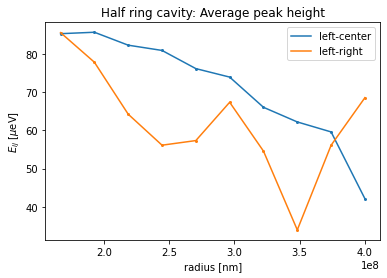

In [1182]:
geometries = angles

fig, ax = plt.subplots()

ax.plot(1e9*geometries, 1e6*geometries_averages.T[0], label='left-center')
ax.scatter(1e9*geometries, 1e6*geometries_averages.T[0], s=4)
ax.plot(1e9*geometries, 1e6*geometries_averages.T[2], label='left-right')
ax.scatter(1e9*geometries, 1e6*geometries_averages.T[2], s=4)

ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.set_xlabel(r'radius [nm]')
ax.set_title(r'Half ring cavity: Average peak height')

ax.legend()
plt.savefig(directory_path+'W_11_size.svg')

In [1183]:
limit = 1e-3
averages_couplings_bands = []

n_peaks = 30
prominence = 0
peaks_kwargs = {'prominence': prominence, 'width': 1, 'height': 0}

peaks_kwargs_2 = {'prominence': 0, 'width': 0, 'height': 0}

for index in range(7):

    file = 'band_'+str(index)+'th.pickle'
    with open(directory_path+file, 'rb') as data:
        result = pickle.load(data)

    geometries_averages = []

    data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
    for geometry in data_geometries:
        if index != 0:
            peaks_kwargs = peaks_kwargs_2
        couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
        averaged_peaks = []

        for i in range(3):
            #if index == 0:
                #peaks[i] = peaks[i][mus_qd[peaks[i]] < limit]
            averaged_peaks.append(np.max(couplings[i][peaks[i]]))

        geometries_averages.append(averaged_peaks)

    geometries_averages = np.array(geometries_averages)
    averages_couplings_bands.append(geometries_averages)

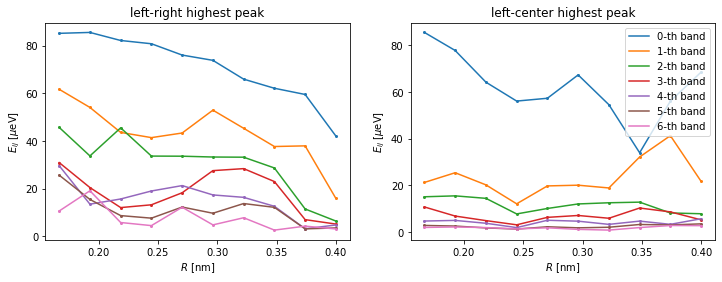

In [1184]:
bands = range(7)
pair = 0

fig, ax = plt.subplots(ncols=2, figsize=(12, 4))
i = 0
for geometries_averages in averages_couplings_bands:
    pair = 0
    for axes in ax.flatten():
        axes.plot(geometries, 1e6*geometries_averages.T[pair], label=str(bands[i])+'-th band')
        axes.scatter(geometries, 1e6*geometries_averages.T[pair], s=4)
        pair += 1
    i += 1

i = 0
for axes in ax.flatten():
    axes.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
    axes.set_xlabel(r'$R$ [nm]')
    #axes.set_ylim(0, 90)
    axes.set_title(str(titles[i])+' highest peak')
    i += 1

ax[-1].legend()

plt.savefig(directory_path+'average_coupling.pdf')

# Rectangular strip cavity

In [2050]:
geometry = {
    "l": 130*a,
    "w": 7*a,
    "a": a,
    "side": 'down',
    "shape": 'rectangle',
    "L": 15*a,
    "W": 130*a
}

In [2051]:
n_geometries = 20
distances = np.linspace(10*a, 50*a, n_geometries)

In [2052]:
mus_qd = np.linspace(-0.002, 0.002, 100)
key = 'mu_qd'
n = 6
directory_path = '../data/manuscript/rectangle_wires/'

## Calculation

In [351]:
tjs = []
for distance in distances:
    geometry.update(centers=[distance, -distance])
    trijunction, f_params, _ = tj.finite_system(**geometry)
    trijunction = trijunction.finalized()
    tjs.append([trijunction, f_params])

/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecati

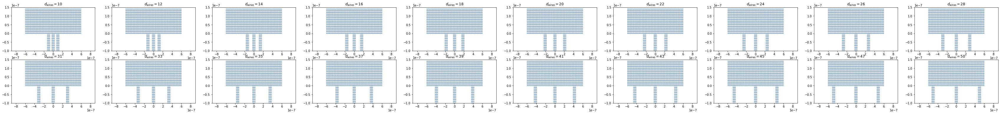

In [352]:
fig, ax = plt.subplots(ncols=int(n_geometries/2), nrows=2, figsize=(3*n_geometries, 6))
i = 0
for axes in ax.flatten():
    kwant.plot(tjs[i][0], ax=axes)
    axes.set_ylim(-1e-7, 1.5e-7)
    axes.set_title(r'$d_{wires}=$'+str(int(distances[i]/a)))
    axes.set_xlim(-9e-7, 9e-7)
    #axes.set_title(r'$\theta/\pi$='+str(np.round(angles[i], 3)))
    i += 1

In [479]:
max_phis = max_phases(geometries=tjs)
path = directory_path + '/L_15_W_120_phis.pickle'
with open(path, 'wb') as file:
    pickle.dump(max_phis, file)

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.


KeyboardInterrupt



In [353]:
path = directory_path + '/L_15_W_120_phis.pickle'
with open(path, 'rb') as data:
    max_phis = pickle.load(data)

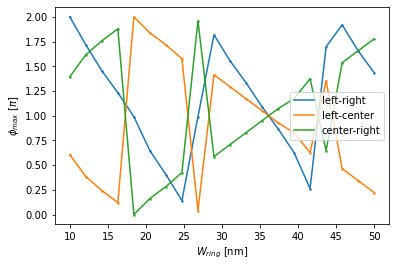

In [354]:
i = 0
for level in max_phis.T:
    plt.plot(1e8*distances, level, label=titles[i])
    plt.scatter(1e8*distances, level, s=2)
    i += 1
plt.xlabel(r'$W_{ring}$ [nm]')
plt.ylabel(r'$\phi_{max}$ [$\pi$]')
plt.legend()

In [355]:
eigen = sl.solver(geometries=tjs, n=n, key=key)

def wrap(args):
    return eigen(*args)

In [356]:
os.system('mkdir ' + directory_path)

mkdir: cannot create directory ‘../data/manuscript/rectangle_wires/’: File exists


256

In [458]:
index = 0
args = []

for i in range(n_geometries):
    for mu in mus_qd:
        for param in sl.finite_coupling_parameters(index=index, phis=np.pi*max_phis[i]):
            args.append([i, mu, param])

args_db = db.from_sequence(args, npartitions=40)

In [459]:
%%time

with Cluster(options) as cluster:
    cluster.scale(n=40)
    client = cluster.get_client()
    print("http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/"+cluster.dashboard_link[17:])

    result = args_db.map(wrap).compute()

path = directory_path + '/L_15_W_120_band_'+str(index)+'th.pickle'
with open(path, 'wb') as file:
    pickle.dump(result, file)

http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/98165773374d4fe8be3edc40c7d95f72/status
CPU times: user 1min 7s, sys: 1.78 s, total: 1min 8s
Wall time: 8min


In [357]:
%%time
for index in range(7):

    args = []

    for i in range(n_geometries):
        for mu in mus_qd:
            for param in sl.finite_coupling_parameters(index=index, phis=np.pi*max_phis[i]):
                args.append([i, mu, param])

    args_db = db.from_sequence(args, npartitions=40)


    with Cluster(options) as cluster:
        cluster.scale(n=40)
        client = cluster.get_client()
        print("Dashboard MBS coupling band "+str(index)+": http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/"+cluster.dashboard_link[17:])

        result = args_db.map(wrap).compute()

    path = directory_path + '/L_15_W_120_band_'+str(index)+'th.pickle'
    with open(path, 'wb') as file:
        pickle.dump(result, file)

Dashboard MBS coupling band 0: http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/4ee904a7c7a94b7aba12ae2701a53545/status
Dashboard MBS coupling band 1: http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/05229248125d4265816780b830ce8aca/status
Dashboard MBS coupling band 2: http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/1e42499063c747828b40539b8e8cd327/status
Dashboard MBS coupling band 3: http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/189159692d73498599a5aa5d34e10247/status
Dashboard MBS coupling band 4: http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/afc60bf218e74843aecc64ffde13256c/status
Dashboard MBS coupling band 5: http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/af538790d55a42d9a19cbc1d941683e1/status
Dashboard MBS coupling band 6: http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/64230e0c15744c19835e954b5f084e25/status
CPU ti

## Analysis

In [358]:
geometries = distances
geometry_parameter = r'$d_{wires}$'

In [374]:
n_peaks = 1
prominence = 0
peaks_kwargs = {'prominence': 5e-6, 'width': 3, 'height': 0}

In [375]:
index = 0
# open raw simulation result
file = 'L_15_W_120_band_'+str(index)+'th.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)

In [376]:
geometries_couplings = []
geometries_peaks = []
geometries_averages = []
geometries_widths = []

data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
for geometry in data_geometries:
    couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
    geometries_couplings.append(couplings)
    geometries_peaks.append(peaks)
    widths = []
    averaged_peaks = []
    for i in range(3):
        widths.append(np.mean((2e-2*peak_widths(x=couplings[i], peaks=peaks[i])[0])))
        averaged_peaks.append(np.mean(couplings[i][peaks[i]]))
    geometries_widths.append(widths)
    geometries_averages.append(averaged_peaks)

geometries_couplings = np.array(geometries_couplings)
geometries_peaks = np.array(geometries_peaks)
geometries_widths = np.array(geometries_widths)
geometries_averages = np.array(geometries_averages)

In [377]:
mus_qd_units = 1e3*mus_qd

In [378]:
title = r'$d_{wires}$ = '
units = r'[nm]'

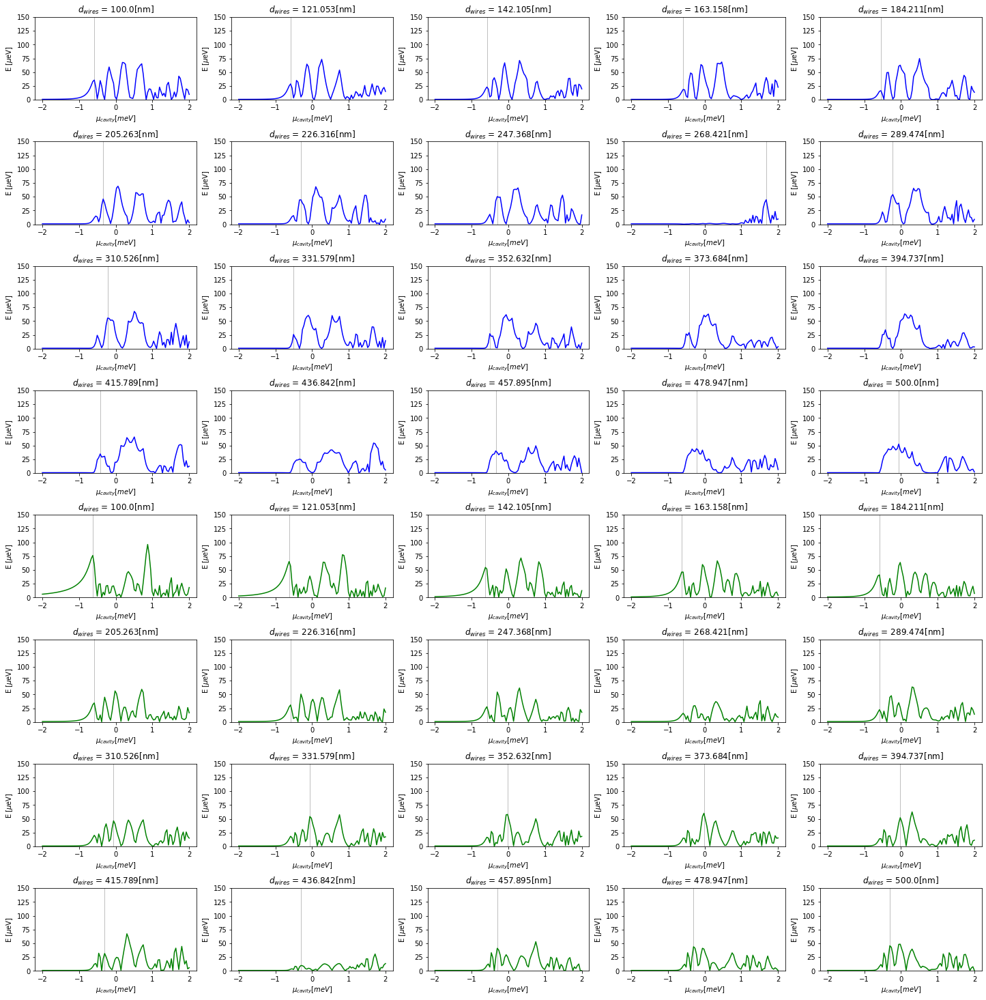

In [379]:
pt.plot_couplings(
    n_geometries,
    1e9*geometries,
    mus_qd_units,
    geometries_peaks,
    geometries_couplings,
    title,
    units,
    n_cols=5,
    n_rows=8,
    figsize=(20, 20)
)

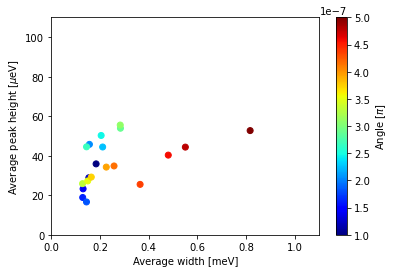

In [380]:
cmap = cm.get_cmap('jet')
pair = 0

fig, ax = plt.subplots()
plot = ax.scatter(2*geometries_widths.T[pair], 1e6*geometries_averages.T[pair], c=distances, cmap=cmap)
ax.set_xlabel(r'Average width [meV]')
ax.set_ylabel(r'Average peak height [$\mu$eV]')
ax.set_xlim(0, 1.1)
ax.set_ylim(0, 110)
cb = fig.colorbar(plot, ax=ax)
cb.set_label(r'Angle [$\pi$]')

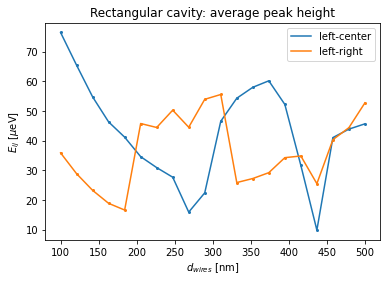

In [381]:
fig, ax = plt.subplots()

ax.plot(1e9*geometries, 1e6*geometries_averages.T[1], label='left-center')
ax.scatter(1e9*geometries, 1e6*geometries_averages.T[1], s=4)
ax.plot(1e9*geometries, 1e6*geometries_averages.T[0], label='left-right')
ax.scatter(1e9*geometries, 1e6*geometries_averages.T[0], s=4)

ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.set_xlabel(r'$d_{wires}$ [nm]')
ax.set_title(r'Rectangular cavity: average peak height')

ax.legend()

In [365]:
averages_couplings_bands = []

n_peaks = 4
prominence = 3e-6
width = 1
height = 0
peaks_kwargs = {'prominence': prominence, 'width': width, 'height': height}

for index in range(7):

    file = 'L_15_W_120_band_'+str(index)+'th.pickle'
    with open(directory_path+file, 'rb') as data:
        result = pickle.load(data)

    geometries_averages = []

    data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
    for geometry in data_geometries:
        couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
        averaged_peaks = []
        for i in range(3):
            averaged_peaks.append(np.mean(couplings[i][peaks[i]]))

        geometries_averages.append(averaged_peaks)

    geometries_averages = np.array(geometries_averages)
    averages_couplings_bands.append(geometries_averages)

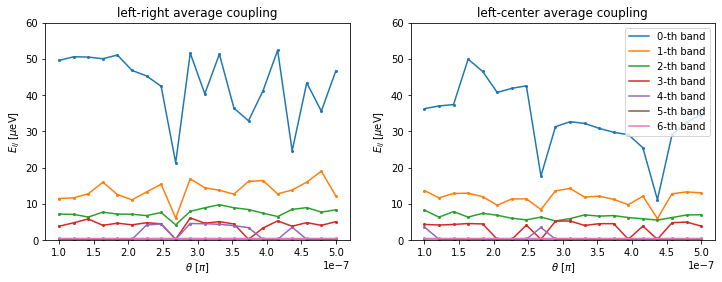

In [367]:
bands = range(7)
pair = 0

fig, ax = plt.subplots(ncols=2, figsize=(12, 4))
i = 0
for geometries_averages in averages_couplings_bands:
    pair = 0
    for axes in ax.flatten():
        axes.plot(geometries, 1e6*geometries_averages.T[pair], label=str(bands[i])+'-th band')
        axes.scatter(geometries, 1e6*geometries_averages.T[pair], s=4)
        pair += 1
    i += 1

i = 0
for axes in ax.flatten():
    axes.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
    axes.set_xlabel(r'$\theta$ [$\pi$]')
    axes.set_ylim(0, 60)
    axes.set_title(str(titles[i])+' average coupling')
    i += 1

ax[-1].legend()

plt.savefig(directory_path+'average_coupling.svg')

## Selected cases

### $d_{wires} = 270$ [nm]

In [478]:
d_wires = 27*a

geometry = {
    "l": 130*a,
    "w": 7*a,
    "a": a,
    "side": 'down',
    "shape": 'rectangle',
    "L": 15*a,
    "W": 154*a,
    "centers": [-d_wires, d_wires]
}

In [188]:
trijunction, f_params, _ = tj.finite_system(**geometry)
trijunction = trijunction.finalized()

/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(


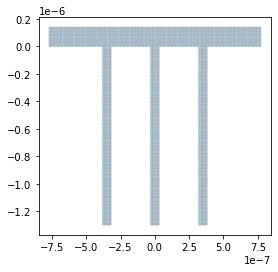

In [189]:
kwant.plot(trijunction);

In [193]:
n = 6
key = 'mu_qd'
mus_qd = np.linspace(-0.001, 0.001, 100)

In [194]:
eigen = sl.solver(geometries=[[trijunction, f_params]], n=n, key=key, eigenvecs=True)


def wrap(args):
    return eigen(*args)

In [195]:
# execute calculation
index = 0
params = sl.finite_coupling_parameters(index=index)

args = list(it.product([0], mus_qd, params))
args_db = db.from_sequence(args, npartitions=40)

with Cluster(options) as cluster:
    cluster.scale(n=40)
    client = cluster.get_client()
    print("http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/"+cluster.dashboard_link[17:])

    result = args_db.map(wrap).compute()

path = directory_path + '/ens_wfs_d_350.pickle'
with open(path, 'wb') as file:
    pickle.dump(result, file)

http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/e1715e4243094c4e80ec760ba66f2df7/status


In [200]:
n_peaks = 4
prominence = 10e-6
peaks_kwargs = {'prominence': prominence, 'width': 0, 'height': 0}

In [201]:
ens, wfs, peaks = tl.coupling_data(result, sign=1, n_peaks=n_peaks, eigenvecs=True, **peaks_kwargs)

In [202]:
ens = np.array(ens)
wfs = np.array(wfs)

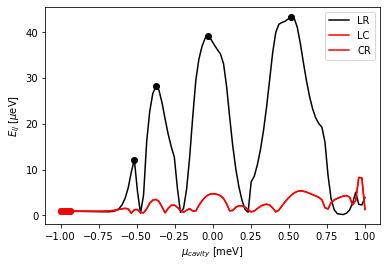

In [203]:
fig, ax = plt.subplots()
labels = ['LR', 'LC', 'CR']
colors = ['black', 'red', 'red']
i = 0
for level in ens:
    ax.plot(1e3*mus_qd, 1e6*level, label=labels[i], c=colors[i])
    ax.scatter(1e3*mus_qd[peaks[i]], 1e6*level[peaks[i]], c=colors[i])
    i += 1
ax.set_xlabel(r'$\mu_{cavity}$ [meV]')
ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.legend()

In [205]:
density = kwant.operator.Density(trijunction, np.eye(4))

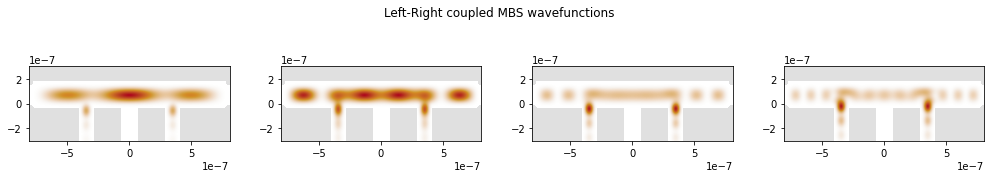

In [208]:
fig, axes = plt.subplots(nrows=1, ncols=n_peaks, figsize=(14, 3))
fig.tight_layout(h_pad=1, w_pad=2)
fig.suptitle(r'Left-Right coupled MBS wavefunctions')

i = 0
for ax in axes.flatten():
    kwant.plotter.density(trijunction, density(wfs[0, peaks[0][i]]), ax=ax)
    ax.set_ylim(-3e-7, 3e-7)
    i += 1

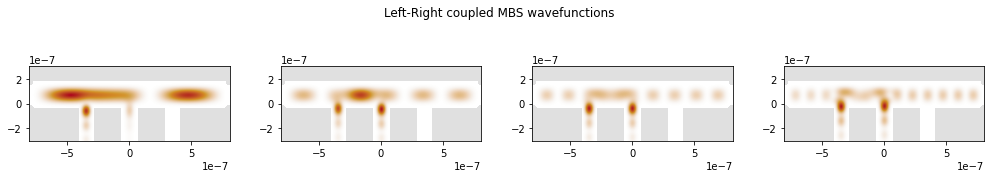

In [211]:
fig, axes = plt.subplots(nrows=1, ncols=n_peaks, figsize=(14, 3))
fig.tight_layout(h_pad=1, w_pad=2)
fig.suptitle(r'Left-Right coupled MBS wavefunctions')

i = 0
for ax in axes.flatten():
    kwant.plotter.density(trijunction, density(wfs[2, peaks[0][i]]), ax=ax)
    ax.set_ylim(-3e-7, 3e-7)
    i += 1

# Rectangular strip change length cavity

In [2053]:
geometry = {
    "l": 130*a,
    "w": 7*a,
    "a": a,
    "side": 'down',
    "shape": 'rectangle',
    "L": 15*a,
    "W": 154*a
#    "centers": [-21*a, 21*a]
}

In [2054]:
n_geometries = 40
widths = np.linspace(50*a, 170*a, n_geometries)

In [2055]:
mus_qd = np.linspace(-0.002, 0.002, 100)
key = 'mu_qd'
n = 6
directory_path = '../data/manuscript/rectangle_width/'

## Analysis

In [2056]:
geometries = widths
geometry_parameter = r'$d_{wires}$'

In [2057]:
n_peaks = 10
prominence = 1e-6
peaks_kwargs = {'prominence': prominence, 'width': 4, 'height': 0}

In [2058]:
index = 0
# open raw simulation result
file = 'band_'+str(index)+'th.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)

In [2059]:
limit = 2e-3

geometries_couplings = []
geometries_peaks = []
geometries_averages = []
geometries_widths = []

data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
for geometry in data_geometries:
    couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
    geometries_couplings.append(couplings)
    geometries_peaks.append(peaks)
    widths = []
    averaged_peaks = []
    for i in range(3):
        peaks[i] = peaks[i][mus_qd[peaks[i]] < limit]
        #print(couplings[i][peaks[i]])
        max_peak_arg = np.argmax(couplings[i][peaks[i]])
        #print(peaks[i][max_peak_arg])
        widths.append(2e-2*peak_widths(x=couplings[i], peaks=[peaks[i][max_peak_arg]])[0])
        averaged_peaks.append(np.max(couplings[i][peaks[i]]))
    geometries_widths.append(np.array(widths).flatten())
    geometries_averages.append(averaged_peaks)

geometries_couplings = np.array(geometries_couplings)
geometries_peaks = np.array(geometries_peaks)
geometries_widths = np.array(geometries_widths)
geometries_averages = np.array(geometries_averages)

strip_size_w = geometries_widths
strip_size_p = geometries_averages
strip_size_g = geometries

In [2060]:
mus_qd_units = 1e3*mus_qd

In [2061]:
title = r'$d_{wires}$ = '
units = r'[nm]'

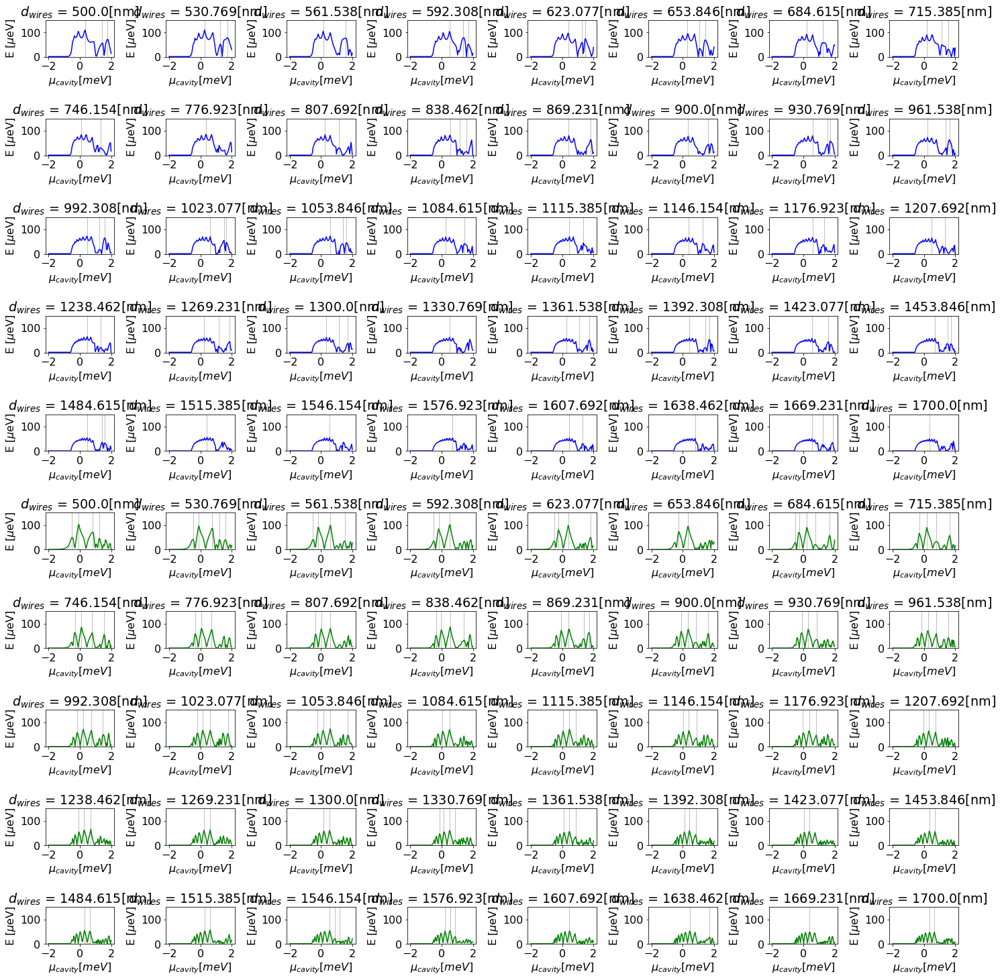

In [2062]:
pt.plot_couplings(
    n_geometries,
    1e9*geometries,
    mus_qd_units,
    geometries_peaks,
    geometries_couplings,
    title,
    units,
    n_cols=8,
    n_rows=10,
    figsize=(20, 20)
)

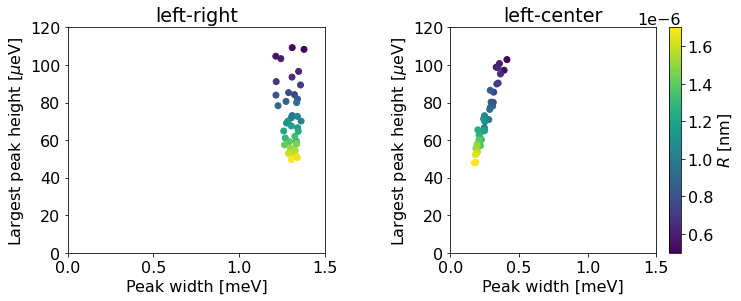

In [2063]:
pair = 1

cmap = cm.get_cmap('viridis')
pair = 0

fig, axes = plt.subplots(ncols=2, figsize=(10, 4))
fig.tight_layout(w_pad=5)

for ax in axes.flatten():
    plot = ax.scatter(2*geometries_widths.T[pair], 1e6*geometries_averages.T[pair], c=geometries, cmap=cmap)
    ax.set_xlabel(r'Peak width [meV]')
    ax.set_ylabel(r'Largest peak height [$\mu$eV]')
    ax.set_title(titles[pair])
    ax.set_xlim(0, 1.5)
    ax.set_ylim(0, 120)
    pair += 1
cb = fig.colorbar(plot, ax=axes[-1])
cb.set_label(r'$R$ [nm]')

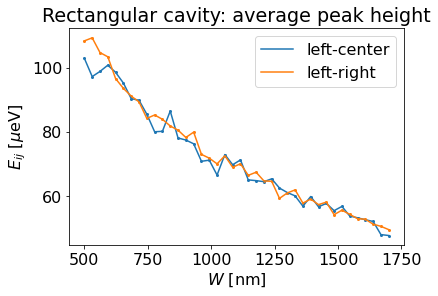

In [2064]:
fig, ax = plt.subplots()

ax.plot(1e9*geometries, 1e6*geometries_averages.T[1], label='left-center')
ax.scatter(1e9*geometries, 1e6*geometries_averages.T[1], s=4)
ax.plot(1e9*geometries, 1e6*geometries_averages.T[0], label='left-right')
ax.scatter(1e9*geometries, 1e6*geometries_averages.T[0], s=4)

ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.set_xlabel(r'$W$ [nm]')
ax.set_title(r'Rectangular cavity: average peak height')

ax.legend()

In [2066]:
limit = 1e-3
averages_couplings_bands = []

n_peaks = 10
prominence = 10e-6
peaks_kwargs = {'prominence': prominence, 'width': 1, 'height': 0}

peaks_kwargs_2 = {'prominence': 0, 'width': 0, 'height': 0}

for index in range(7):

    file = 'band_'+str(index)+'th.pickle'
    with open(directory_path+file, 'rb') as data:
        result = pickle.load(data)

    geometries_averages = []

    data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
    for geometry in data_geometries:
        if index != 0:
            peaks_kwargs = peaks_kwargs_2
        couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
        averaged_peaks = []

        for i in range(3):
            if index == 0:
                peaks[i] = peaks[i][mus_qd[peaks[i]] < limit]
            averaged_peaks.append(np.mean(couplings[i][peaks[i]]))

        geometries_averages.append(averaged_peaks)

    geometries_averages = np.array(geometries_averages)
    averages_couplings_bands.append(geometries_averages)

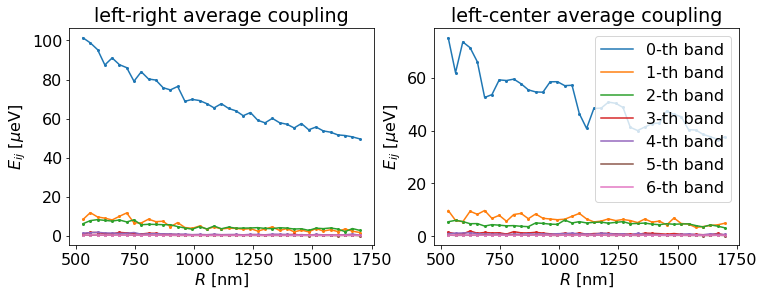

In [2067]:
bands = range(7)
pair = 0

fig, ax = plt.subplots(ncols=2, figsize=(12, 4))
i = 0
for geometries_averages in averages_couplings_bands:
    pair = 0
    for axes in ax.flatten():
        axes.plot(1e9*geometries[1:], 1e6*geometries_averages.T[pair][1:], label=str(bands[i])+'-th band')
        axes.scatter(1e9*geometries[1:], 1e6*geometries_averages.T[pair][1:], s=4)
        pair += 1
    i += 1

i = 0
for axes in ax.flatten():
    axes.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
    axes.set_xlabel(r'$R$ [nm]')
    #axes.set_ylim(0, 90)
    axes.set_title(str(titles[i])+' average coupling')
    i += 1

ax[-1].legend()

plt.savefig(directory_path+'ring_average_coupling.pdf')

In [2068]:
strip_band_averages = []
for geometry_data in averages_couplings_bands:
    strip_band_averages.append(np.mean(geometry_data, axis=0))
strip_band_averages = np.array(strip_band_averages)

## Selected cases

### $d_{wires} = 350$ [nm]

In [187]:
d_wires = 35*a

geometry = {
    "l": 130*a,
    "w": 7*a,
    "a": a,
    "side": 'down',
    "shape": 'rectangle',
    "L": 15*a,
    "W": 154*a,
    "centers": [-d_wires, d_wires]
}

In [188]:
trijunction, f_params, _ = tj.finite_system(**geometry)
trijunction = trijunction.finalized()

/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(


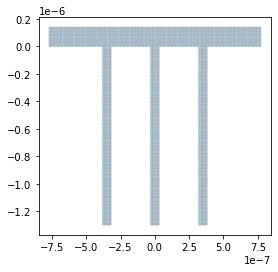

In [189]:
kwant.plot(trijunction);

In [193]:
n = 6
key = 'mu_qd'
mus_qd = np.linspace(-0.001, 0.001, 100)

In [194]:
eigen = sl.solver(geometries=[[trijunction, f_params]], n=n, key=key, eigenvecs=True)


def wrap(args):
    return eigen(*args)

In [195]:
# execute calculation
index = 0
params = sl.finite_coupling_parameters(index=index)

args = list(it.product([0], mus_qd, params))
args_db = db.from_sequence(args, npartitions=40)

with Cluster(options) as cluster:
    cluster.scale(n=40)
    client = cluster.get_client()
    print("http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/"+cluster.dashboard_link[17:])

    result = args_db.map(wrap).compute()

path = directory_path + '/ens_wfs_d_350.pickle'
with open(path, 'wb') as file:
    pickle.dump(result, file)

http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/e1715e4243094c4e80ec760ba66f2df7/status


In [200]:
n_peaks = 4
prominence = 10e-6
peaks_kwargs = {'prominence': prominence, 'width': 0, 'height': 0}

In [201]:
ens, wfs, peaks = tl.coupling_data(result, sign=1, n_peaks=n_peaks, eigenvecs=True, **peaks_kwargs)

In [202]:
ens = np.array(ens)
wfs = np.array(wfs)

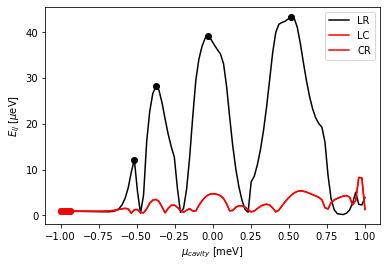

In [203]:
fig, ax = plt.subplots()
labels = ['LR', 'LC', 'CR']
colors = ['black', 'red', 'red']
i = 0
for level in ens:
    ax.plot(1e3*mus_qd, 1e6*level, label=labels[i], c=colors[i])
    ax.scatter(1e3*mus_qd[peaks[i]], 1e6*level[peaks[i]], c=colors[i])
    i += 1
ax.set_xlabel(r'$\mu_{cavity}$ [meV]')
ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.legend()

In [205]:
density = kwant.operator.Density(trijunction, np.eye(4))

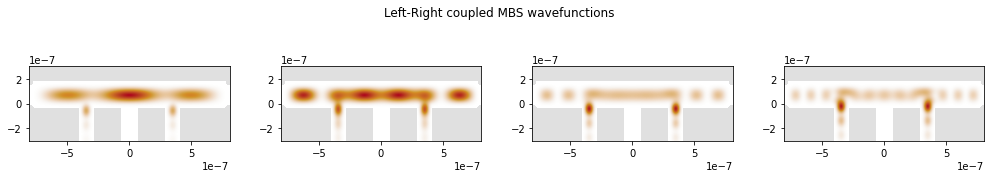

In [208]:
fig, axes = plt.subplots(nrows=1, ncols=n_peaks, figsize=(14, 3))
fig.tight_layout(h_pad=1, w_pad=2)
fig.suptitle(r'Left-Right coupled MBS wavefunctions')

i = 0
for ax in axes.flatten():
    kwant.plotter.density(trijunction, density(wfs[0, peaks[0][i]]), ax=ax)
    ax.set_ylim(-3e-7, 3e-7)
    i += 1

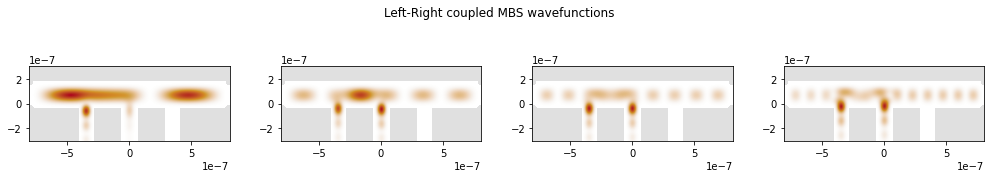

In [211]:
fig, axes = plt.subplots(nrows=1, ncols=n_peaks, figsize=(14, 3))
fig.tight_layout(h_pad=1, w_pad=2)
fig.suptitle(r'Left-Right coupled MBS wavefunctions')

i = 0
for ax in axes.flatten():
    kwant.plotter.density(trijunction, density(wfs[2, peaks[0][i]]), ax=ax)
    ax.set_ylim(-3e-7, 3e-7)
    i += 1

# Rectangular cavity

In [2117]:
geometry = {
    "l": 130*a,
    "w": 7*a,
    "a": a,
    "side": 'up',
    "shape": 'rectangle',
    "L": 15*a,
    "W": 154*a,
    "centers": [-50*a, 50*a]
}

In [2118]:
n_geometries = 20
lengths = np.linspace(20*a, 100*a, n_geometries)

In [2119]:
mus_qd = np.linspace(-0.002, 0.002, 100)
key = 'mu_qd'
n = 6
directory_path = '../data/manuscript/rectangle_length/'

## Analysis

In [2120]:
geometries = lengths
geometry_parameter = r'$L$'

In [2121]:
n_peaks = 30
prominence = 0
peaks_kwargs = {'prominence': prominence, 'width': 1, 'height': 0}

In [2122]:
index = 0
# open raw simulation result
file = 'W_154_band_'+str(index)+'th.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)

In [2123]:
limit = 2e-3

geometries_couplings = []
geometries_peaks = []
geometries_averages = []
geometries_widths = []

data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
for geometry in data_geometries:
    couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
    geometries_couplings.append(couplings)
    geometries_peaks.append(peaks)
    widths = []
    averaged_peaks = []
    for i in range(3):
        peaks[i] = peaks[i][mus_qd[peaks[i]] < limit]
        #print(couplings[i][peaks[i]])
        max_peak_arg = np.argmax(couplings[i][peaks[i]])
        #print(peaks[i][max_peak_arg])
        widths.append(2e-2*peak_widths(x=couplings[i], peaks=[peaks[i][max_peak_arg]])[0])
        averaged_peaks.append(np.max(couplings[i][peaks[i]]))
    geometries_widths.append(np.array(widths).flatten())
    geometries_averages.append(averaged_peaks)

geometries_couplings = np.array(geometries_couplings)
geometries_peaks = np.array(geometries_peaks)
geometries_widths = np.array(geometries_widths)
geometries_averages = np.array(geometries_averages)

rectangle_1_w = geometries_widths
rectangle_1_p = geometries_averages
rectangle_1_g = lengths

In [2124]:
mus_qd_units = 1e3*mus_qd

In [2125]:
title = r'$d_{wires}$ = '
units = r'[nm]'

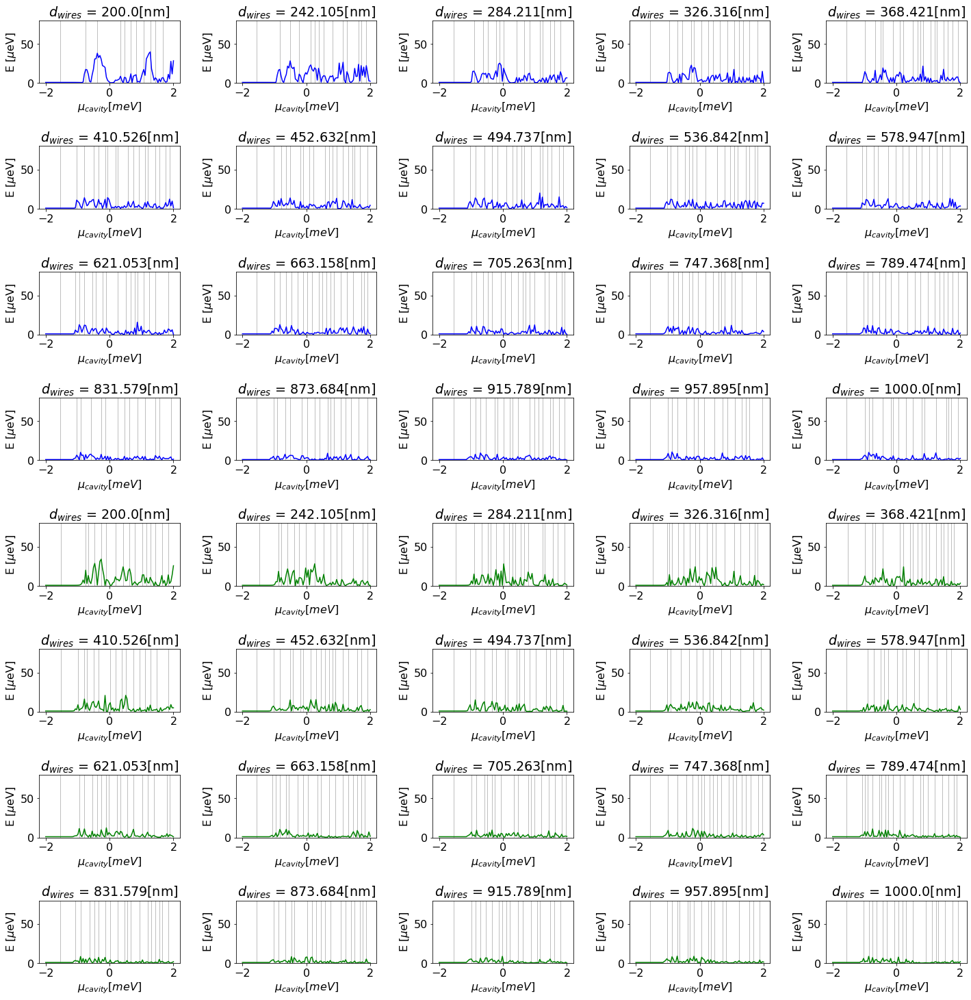

In [2126]:
pt.plot_couplings(
    n_geometries,
    1e9*geometries,
    mus_qd_units,
    geometries_peaks,
    geometries_couplings,
    title,
    units,
    n_cols=5,
    n_rows=8,
    figsize=(20, 20),
    ylim=80
)

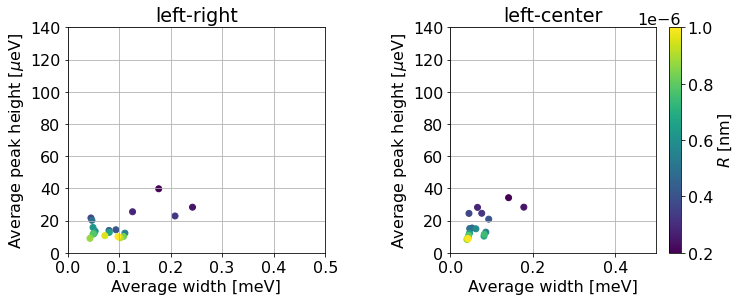

In [2127]:
cmap = cm.get_cmap('viridis')
pair = 0

fig, axes = plt.subplots(ncols=2, figsize=(10, 4))
fig.tight_layout(w_pad=5)

for ax in axes.flatten():
    plot = ax.scatter(2*geometries_widths.T[pair],
                      1e6*geometries_averages.T[pair],
                      c=lengths,
                      cmap=cmap)
    ax.set_xlabel(r'Average width [meV]')
    ax.set_ylabel(r'Average peak height [$\mu$eV]')
    ax.set_title(titles[pair])
    ax.set_xlim(0, 0.5)
    ax.set_ylim(0, 140) 
    ax.grid()
    pair += 1
cb = fig.colorbar(plot, ax=axes[-1])
cb.set_label(r'$R$ [nm]')

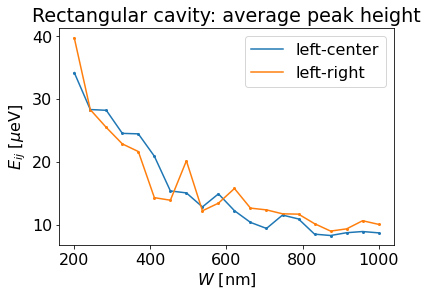

In [2128]:
fig, ax = plt.subplots()

ax.plot(1e9*geometries, 1e6*geometries_averages.T[1], label='left-center')
ax.scatter(1e9*geometries, 1e6*geometries_averages.T[1], s=4)
ax.plot(1e9*geometries, 1e6*geometries_averages.T[0], label='left-right')
ax.scatter(1e9*geometries, 1e6*geometries_averages.T[0], s=4)

ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.set_xlabel(r'$W$ [nm]')
ax.set_title(r'Rectangular cavity: average peak height')

ax.legend()

In [2129]:
averages_couplings_bands = []

n_peaks = 10
prominence = 1e-6
width = 1
height = 0
peaks_kwargs = {'prominence': prominence, 'width': width, 'height': height}

for index in range(7):

    file = 'W_154_band_'+str(index)+'th.pickle'
    with open(directory_path+file, 'rb') as data:
        result = pickle.load(data)

    geometries_averages = []

    data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
    for geometry in data_geometries:
        couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
        averaged_peaks = []
        for i in range(3):
            averaged_peaks.append(np.max(couplings[i][peaks[i]]))

        geometries_averages.append(averaged_peaks)

    geometries_averages = np.array(geometries_averages)
    averages_couplings_bands.append(geometries_averages)

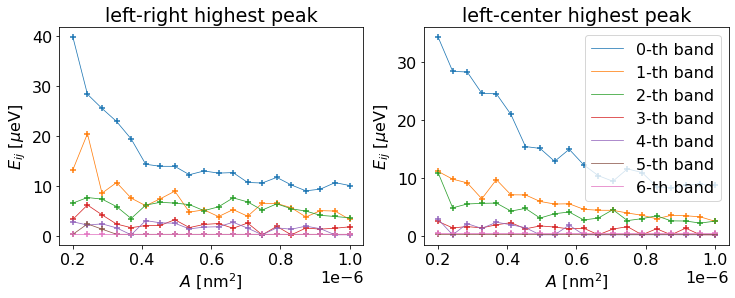

In [2130]:
bands = range(7)
pair = 0

fig, ax = plt.subplots(ncols=2, figsize=(12, 4))
i = 0
for geometries_averages in averages_couplings_bands:
    pair = 0
    for axes in ax.flatten():
        axes.plot(geometries, 1e6*geometries_averages.T[pair], label=str(bands[i])+'-th band', linewidth=0.75)
        axes.scatter(geometries, 1e6*geometries_averages.T[pair], s=40, marker='+')
        pair += 1
    i += 1

i = 0
for axes in ax.flatten():
    axes.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
    axes.set_xlabel(r'$A$ [nm$^2$]')
    #axes.set_ylim(0, 120)   
    axes.set_title(str(titles[i])+' highest peak')
    i += 1

ax[-1].legend(loc='upper right')

plt.savefig(directory_path+'triangle_one_side_average_coupling.pdf')

In [2131]:
rectangle_band_averages = []
for geometry_data in averages_couplings_bands:
    rectangle_band_averages.append(np.mean(geometry_data, axis=0))
rectangle_band_averages = np.array(rectangle_band_averages)

# Circular cavity radius

In [1929]:
angle = np.pi/6
geometry = {
    "l": 130*a,
    "w": 7*a,
    "a": a,
    "side": 'up',
    "shape": 'y',
    "angle": angle,
    "radius": 0*a,
    "w_v": 11*a
}

In [1930]:
n_geometries = 20
radius = np.linspace(12, 32, n_geometries)
areas = np.linspace(250, 800, n_geometries)
geometries=radius

In [1931]:
mus_qd = np.linspace(-1e-3, 3e-3, 100)
key = 'mu_qd'
n = 6
directory_path = '../data/manuscript/circle/'

## Analysis

In [1932]:
index = 0
# open raw simulation result
file = 'band_'+str(index)+'th.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)

In [1933]:
n_peaks = 6
prominence = 5e-6
peaks_kwargs = {'prominence': prominence, 'width': 2, 'height': 0}

In [1934]:
limit = 3e-3

geometries_couplings = []
geometries_peaks = []
geometries_averages = []
geometries_widths = []

data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
for geometry in data_geometries:
    couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
    geometries_couplings.append(couplings)
    geometries_peaks.append(peaks)
    widths = []
    averaged_peaks = []
    for i in range(3):
        peaks[i] = peaks[i][mus_qd[peaks[i]] < limit]
        #print(couplings[i][peaks[i]])
        max_peak_arg = np.argmax(couplings[i][peaks[i]])
        #print(peaks[i][max_peak_arg])
        widths.append(2e-2*peak_widths(x=couplings[i], peaks=[peaks[i][max_peak_arg]])[0])
        averaged_peaks.append(np.max(couplings[i][peaks[i]]))
    geometries_widths.append(np.array(widths).flatten())
    geometries_averages.append(averaged_peaks)

geometries_couplings = np.array(geometries_couplings)
geometries_peaks = np.array(geometries_peaks)
geometries_widths = np.array(geometries_widths)
geometries_averages = np.array(geometries_averages)

circle_w = geometries_widths
circle_p = geometries_averages
circle_g = radius

In [1935]:
title = r'$r$ = '
units = r'[nm]'

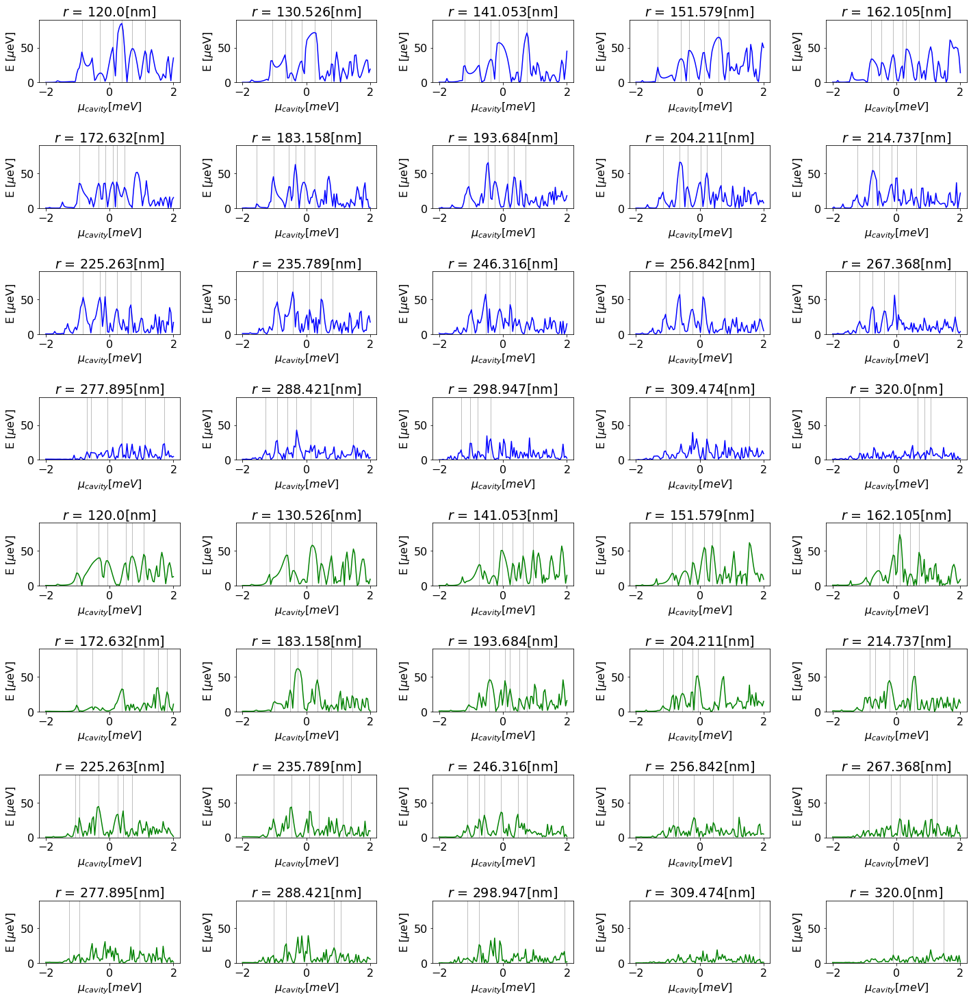

In [1936]:
pt.plot_couplings(
    n_geometries,
    10*geometries,
    mus_qd_units,
    geometries_peaks,
    geometries_couplings,
    title,
    units,
    n_cols=5,
    n_rows=8,
    figsize=(20, 20),
    ylim=90
)

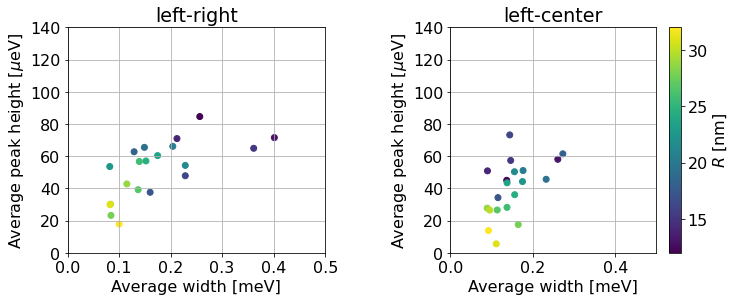

In [1937]:
cmap = cm.get_cmap('viridis')
pair = 0

fig, axes = plt.subplots(ncols=2, figsize=(10, 4))
fig.tight_layout(w_pad=5)

for ax in axes.flatten():
    plot = ax.scatter(2*geometries_widths.T[pair],
                      1e6*geometries_averages.T[pair],
                      c=radius,
                      cmap=cmap)
    ax.set_xlabel(r'Average width [meV]')
    ax.set_ylabel(r'Average peak height [$\mu$eV]')
    ax.set_title(titles[pair])
    ax.set_xlim(0, 0.5)
    ax.set_ylim(0, 140) 
    ax.grid()
    pair += 1
cb = fig.colorbar(plot, ax=axes[-1])
cb.set_label(r'$R$ [nm]')

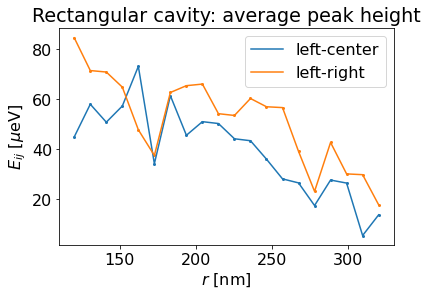

In [1938]:
fig, ax = plt.subplots()

ax.plot(10*geometries, 1e6*geometries_averages.T[1], label='left-center')
ax.scatter(10*geometries, 1e6*geometries_averages.T[1], s=4)
ax.plot(10*geometries, 1e6*geometries_averages.T[0], label='left-right')
ax.scatter(10*geometries, 1e6*geometries_averages.T[0], s=4)

ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.set_xlabel(r'$r$ [nm]')
ax.set_title(r'Rectangular cavity: average peak height')

ax.legend()

In [1939]:
averages_couplings_bands = []

n_peaks = 10
prominence = 1e-6
width = 1
height = 0
peaks_kwargs = {'prominence': prominence, 'width': width, 'height': height}

for index in range(7):

    file = 'band_'+str(index)+'th.pickle'
    with open(directory_path+file, 'rb') as data:
        result = pickle.load(data)

    geometries_averages = []

    data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
    for geometry in data_geometries:
        couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
        averaged_peaks = []
        for i in range(3):
            averaged_peaks.append(np.max(couplings[i][peaks[i]]))

        geometries_averages.append(averaged_peaks)

    geometries_averages = np.array(geometries_averages)
    averages_couplings_bands.append(geometries_averages)

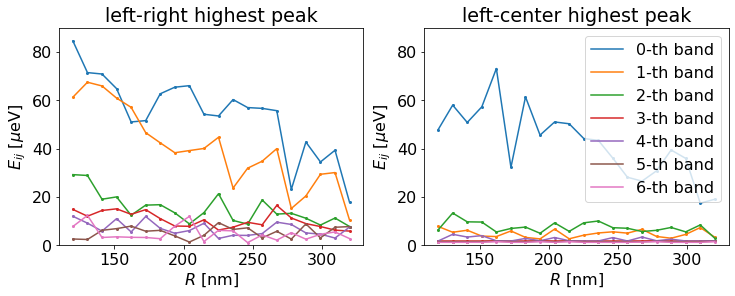

In [1940]:
bands = range(7)
geometries = radius
pair = 0

fig, ax = plt.subplots(ncols=2, figsize=(12, 4))
i = 0
for geometries_averages in averages_couplings_bands:
    pair = 0
    for axes in ax.flatten():
        axes.plot(10*geometries, 1e6*geometries_averages.T[pair], label=str(bands[i])+'-th band')
        axes.scatter(10*geometries, 1e6*geometries_averages.T[pair], s=4)
        pair += 1
    i += 1

i = 0
for axes in ax.flatten():
    axes.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
    axes.set_xlabel(r'$R$ [nm]')
    axes.set_ylim(0, 90)
    axes.set_title(str(titles[i])+' highest peak')
    i += 1

ax[-1].legend()

plt.savefig(directory_path+'circle_average_coupling.pdf')

In [1941]:
circle_band_averages = []
for geometry_data in averages_couplings_bands:
    circle_band_averages.append(np.mean(geometry_data, axis=0))
circle_band_averages = np.array(circle_band_averages)

## Selected cases

### $r = 200$ [nm]

In [75]:
angle = np.pi/6
geometry = {
    "l": 130*a,
    "w": 7*a,
    "a": a,
    "side": 'up',
    "shape": 'y',
    "angle": angle,
    "radius": radius[8]*a,
    "w_v": 11*a,
    "A": areas[8]*a**2,
}

In [76]:
trijunction, f_params, _ = tj.finite_system(**geometry)
trijunction = trijunction.finalized()

/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(


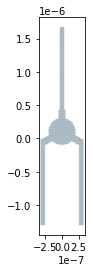

In [77]:
kwant.plot(trijunction);

In [57]:
n = 6
key = 'mu_qd'
mus_qd = np.linspace(-1e-3, 3e-3, 100)

In [58]:
eigen = sl.solver(geometries=[[trijunction, f_params]], n=n, key=key, eigenvecs=True)


def wrap(args):
    return eigen(*args)

In [59]:
# execute calculation
index = 0
params = sl.finite_coupling_parameters(index=index)

args = list(it.product([0], mus_qd, params))
args_db = db.from_sequence(args, npartitions=40)

with Cluster(options) as cluster:
    cluster.scale(n=40)
    client = cluster.get_client()
    print("http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/"+cluster.dashboard_link[17:])

    result = args_db.map(wrap).compute()

path = directory_path + '/ens_wfs_r_20.pickle'
with open(path, 'wb') as file:
    pickle.dump(result, file)

http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/a6d8d1146cc9430f83a3549d93129e20/status


In [64]:
n_peaks = 4
prominence = 10e-6
peaks_kwargs = {'prominence': prominence, 'width': 0, 'height': 0}

In [65]:
ens, wfs, peaks = tl.coupling_data(result, sign=1, n_peaks=n_peaks, eigenvecs=True, **peaks_kwargs)

In [66]:
ens = np.array(ens)
wfs = np.array(wfs)

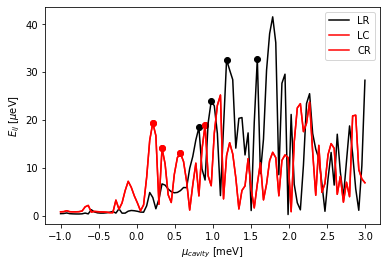

In [67]:
fig, ax = plt.subplots()
labels = ['LR', 'LC', 'CR']
colors = ['black', 'red', 'red']
i = 0
for level in ens:
    ax.plot(1e3*mus_qd, 1e6*level, label=labels[i], c=colors[i])
    ax.scatter(1e3*mus_qd[peaks[i]], 1e6*level[peaks[i]], c=colors[i])
    i += 1
ax.set_xlabel(r'$\mu_{cavity}$ [meV]')
ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.legend()

In [68]:
density = kwant.operator.Density(trijunction, np.eye(4))

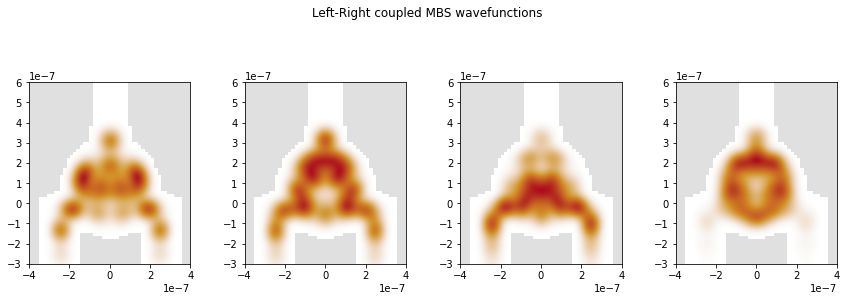

In [74]:
fig, axes = plt.subplots(nrows=1, ncols=n_peaks, figsize=(12, 5))
fig.tight_layout(h_pad=1, w_pad=2)
fig.suptitle(r'Left-Right coupled MBS wavefunctions')

i = 0
for ax in axes.flatten():
    kwant.plotter.density(trijunction, density(wfs[0, peaks[0][i]]), ax=ax)
    ax.set_ylim(-3e-7, 6e-7)
    ax.set_xlim(-4e-7, 4e-7)
    i += 1

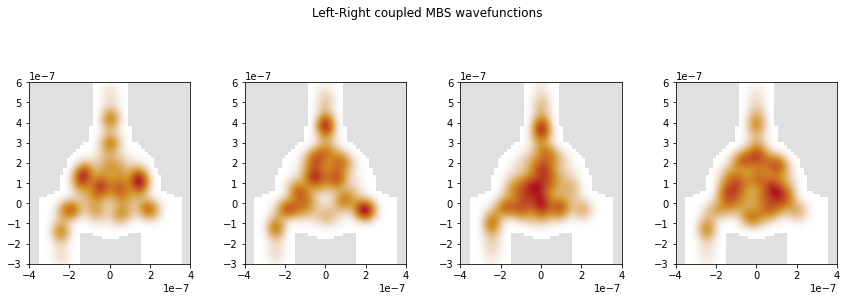

In [75]:
fig, axes = plt.subplots(nrows=1, ncols=n_peaks, figsize=(12, 5))
fig.tight_layout(h_pad=1, w_pad=2)
fig.suptitle(r'Left-Right coupled MBS wavefunctions')

i = 0
for ax in axes.flatten():
    kwant.plotter.density(trijunction, density(wfs[1, peaks[0][i]]), ax=ax)
    ax.set_ylim(-3e-7, 6e-7)
    ax.set_xlim(-4e-7, 4e-7)
    i += 1

# Circular cavity angles

In [2135]:
geometry = {
    "l": 130*a,
    "w": 7*a,
    "a": a,
    "side": 'up',
    "shape": 'y',
    "angle": angle,
    "radius": 25*a,
    "w_v": 11*a,
    "A": 700*a**2,
}

In [2136]:
n_geometries = 25
angles = np.linspace(0.05, 0.3, n_geometries)
geometries=angles

In [2137]:
mus_qd = np.linspace(-1e-3, 3e-3, 100)
key = 'mu_qd'
n = 6
directory_path = '../data/manuscript/circle_angles/'

In [2138]:
os.system('mkdir '+directory_path)

mkdir: cannot create directory ‘../data/manuscript/circle_angles/’: File exists


256

## Analysis

In [2139]:
index = 0
# open raw simulation result
file = 'R_25_band_'+str(index)+'th.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)

In [2140]:
n_peaks = 30
prominence = 0
peaks_kwargs = {'prominence': prominence, 'width': 1, 'height': 0}

In [2141]:
limit = 1e-3

geometries_couplings = []
geometries_peaks = []
geometries_averages = []
geometries_widths = []

data_geometries = tl.separate_data_geometries(data=result, n_geometries=n_geometries)
for geometry in data_geometries:
    couplings, _, peaks = tl.coupling_data(data=geometry, sign=1, n_peaks=n_peaks, **peaks_kwargs)
    geometries_couplings.append(couplings)
    geometries_peaks.append(peaks)
    widths = []
    averaged_peaks = []
    for i in range(3):
        peaks[i] = peaks[i][mus_qd[peaks[i]] < limit]
        #print(couplings[i][peaks[i]])
        max_peak_arg = np.argmax(couplings[i][peaks[i]])
        #print(peaks[i][max_peak_arg])
        widths.append(2e-2*peak_widths(x=couplings[i], peaks=[peaks[i][max_peak_arg]])[0])
        averaged_peaks.append(np.max(couplings[i][peaks[i]]))
    geometries_widths.append(np.array(widths).flatten())
    geometries_averages.append(averaged_peaks)

geometries_couplings = np.array(geometries_couplings)
geometries_peaks = np.array(geometries_peaks)
geometries_widths = np.array(geometries_widths)
geometries_averages = np.array(geometries_averages)

circle_angle_w = geometries_widths
circle_angle_p = geometries_averages
circle_angle_g = angles

In [2142]:
geometries = angles
title = r'$\theta$ = '
units = r'[$\pi$]'

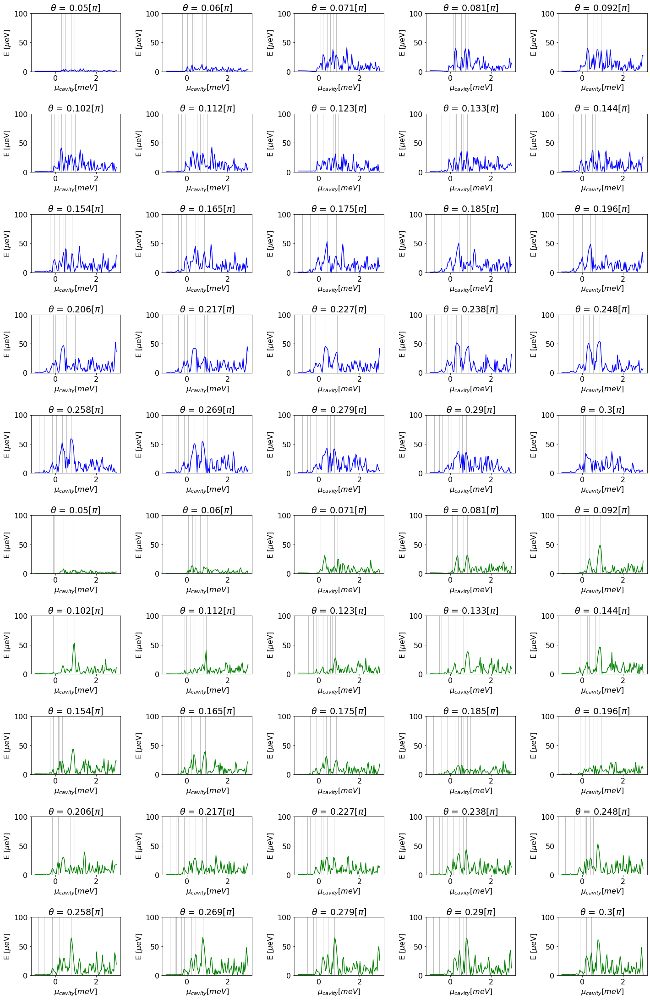

In [2143]:
pt.plot_couplings(
    n_geometries,
    geometries,
    mus_qd*1e3,
    geometries_peaks,
    geometries_couplings,
    title,
    units,
    n_cols=5,
    n_rows=10,
    figsize=(20, 30),
    ylim=100
)

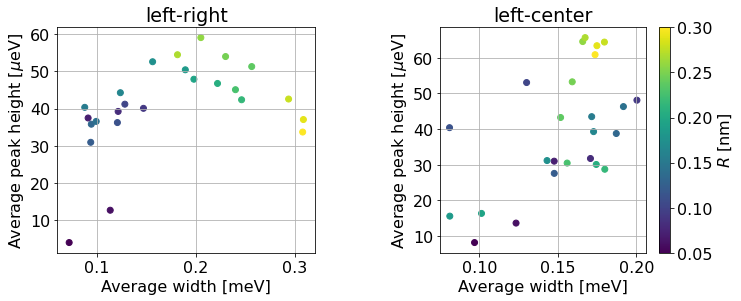

In [2115]:
cmap = cm.get_cmap('viridis')
pair = 0

fig, axes = plt.subplots(ncols=2, figsize=(10, 4))
fig.tight_layout(w_pad=5)

for ax in axes.flatten():
    plot = ax.scatter(2*geometries_widths.T[pair],
                      1e6*geometries_averages.T[pair],
                      c=angles,
                      cmap=cmap)
    ax.set_xlabel(r'Average width [meV]')
    ax.set_ylabel(r'Average peak height [$\mu$eV]')
    ax.set_title(titles[pair])
    ax.grid()
    pair += 1
cb = fig.colorbar(plot, ax=axes[-1])
cb.set_label(r'$R$ [nm]')

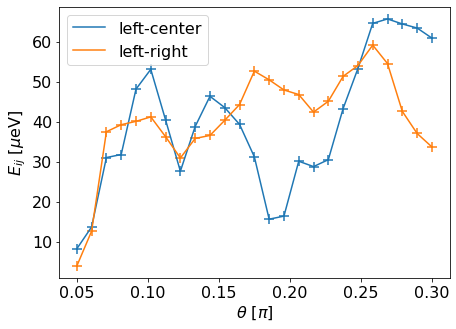

In [2116]:
fig, ax = plt.subplots(figsize=(7, 5))

ax.plot(geometries, 1e6*geometries_averages.T[1], label='left-center')
ax.scatter(geometries, 1e6*geometries_averages.T[1], s=100, marker='+')
ax.plot(geometries, 1e6*geometries_averages.T[0], label='left-right')
ax.scatter(geometries, 1e6*geometries_averages.T[0], s=100, marker='+')

ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.set_xlabel(r'$\theta$ [$\pi$]')

ax.legend()
plt.savefig(directory_path+'circle_peaks_angles.pdf')

## Selected cases

### $r = 200$ [nm] and $\theta = 0.28 \pi$ and $area = 350$

In [139]:
angle = angles[2]*np.pi
geometry = {
    "l": 130*a,
    "w": 7*a,
    "a": a,
    "side": 'up',
    "shape": 'y',
    "angle": angle,
    "radius": radius[8]*a,
    "w_v": 11*a,
    "A": areas[8]*a**2,
}

In [140]:
trijunction, f_params, _ = tj.finite_system(**geometry)
trijunction = trijunction.finalized()

/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(


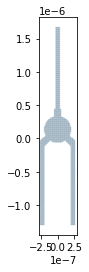

In [141]:
kwant.plot(trijunction);

In [142]:
n = 6
key = 'mu_qd'
mus_qd = np.linspace(-1e-3, 2e-3, 100)
tjs = [[trijunction, f_params]]

In [143]:
eigen = sl.solver(geometries=[[trijunction, f_params]], n=n, key=key, eigenvecs=True)


def wrap(args):
    return eigen(*args)

In [144]:
# execute calculation
index = 0
phis = np.pi*max_phis[2]
params = sl.finite_coupling_parameters(index=index, phis=phis)

args = list(it.product([0], mus_qd, params))
args_db = db.from_sequence(args, npartitions=40)

with Cluster(options) as cluster:
    cluster.scale(n=40)
    client = cluster.get_client()
    print("http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/"+cluster.dashboard_link[17:])

    result = args_db.map(wrap).compute()

path = directory_path + '/ens_wfs_R_20.pickle'
with open(path, 'wb') as file:
    pickle.dump(result, file)

http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/061bb74b1e1949bdabdb5e2515d232c6/status


In [516]:
file = 'ens_wfs_R_20.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)

In [517]:
n_peaks = 2
prominence = 30e-6
peaks_kwargs = {'prominence': prominence, 'width': 2, 'height': 10e-6}

In [518]:
ens_anlge_1, wfs_anlge_1, peaks_anlge_1 = tl.coupling_data(result, sign=1, n_peaks=n_peaks, eigenvecs=True, **peaks_kwargs)

In [519]:
ens = np.array(ens)
wfs = np.array(wfs)

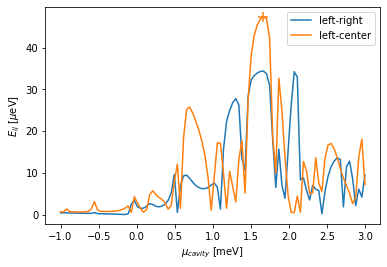

In [520]:
fig, ax = plt.subplots()
i = 0
for level in ens[:2]:
    ax.plot(1e3*mus_qd, 1e6*level, label=titles[i])
    i += 1
ax.scatter(1e3*mus_qd[peaks[1]], 1e6*level[peaks[1]], c='C1', marker='+', s=100)
ax.set_xlabel(r'$\mu_{cavity}$ [meV]')
ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.legend()

In [521]:
density = kwant.operator.Density(trijunction, np.eye(4))

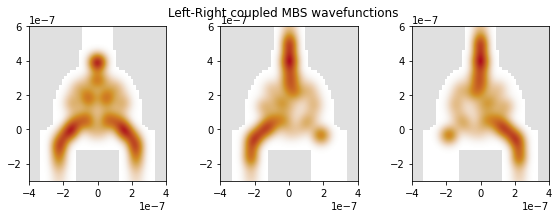

In [162]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(8, 3))
fig.tight_layout(h_pad=2, w_pad=2)
fig.suptitle(r'Left-Right coupled MBS wavefunctions')

i = 0
for ax in axes.flatten():
    kwant.plotter.density(trijunction, density(wfs[i, peaks[0][0]]), ax=ax)
    ax.set_ylim(-3e-7, 6e-7)
    ax.set_xlim(-4e-7, 4e-7)
    i += 1

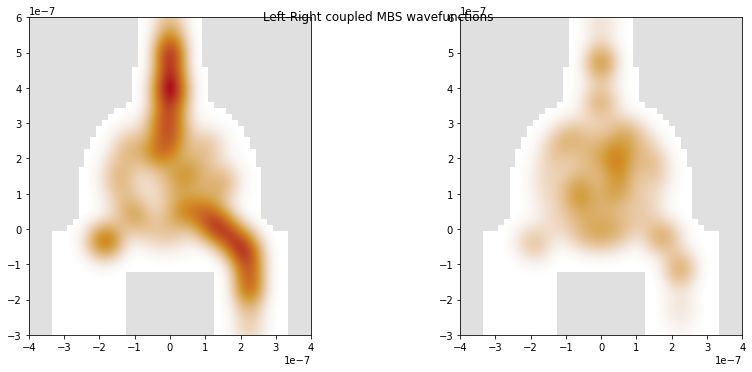

In [159]:
fig, axes = plt.subplots(nrows=1, ncols=n_peaks, figsize=(12, 5))
fig.tight_layout(h_pad=1, w_pad=2)
fig.suptitle(r'Left-Right coupled MBS wavefunctions')

i = 0
for ax in axes.flatten():
    kwant.plotter.density(trijunction, density(wfs[2, peaks[0][i]]), ax=ax)
    ax.set_ylim(-3e-7, 6e-7)
    ax.set_xlim(-4e-7, 4e-7)
    i += 1

### $r = 200$ [nm] and $\theta = 0.28 \pi$ and $area = 350$

In [534]:
angle = angles[0]*np.pi
geometry = {
    "l": 130*a,
    "w": 7*a,
    "a": a,
    "side": 'up',
    "shape": 'y',
    "angle": angle,
    "radius": radius[8]*a,
    "w_v": 11*a,
    "A": areas[8]*a**2,
}

In [535]:
trijunction, f_params, _ = tj.finite_system(**geometry)
trijunction = trijunction.finalized()

/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(
/opt/conda/lib/python3.9/site-packages/sympy/__init__.py:672: SymPyDeprecationWarning: 

importing sympy.matrices.matrices with 'from sympy import *' has been
deprecated since SymPy 1.6. Use import sympy.matrices.matrices
instead. See https://github.com/sympy/sympy/issues/18245 for more
info.

  self.Warn(


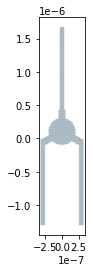

In [536]:
kwant.plot(trijunction);

In [537]:
n = 6
key = 'mu_qd'
mus_qd = np.linspace(-1e-3, 2e-3, 100)
tjs = [[trijunction, f_params]]

In [538]:
eigen = sl.solver(geometries=[[trijunction, f_params]], n=n, key=key, eigenvecs=True)


def wrap(args):
    return eigen(*args)

In [539]:
# execute calculation
index = 0
phis = np.pi*max_phis[0]
params = sl.finite_coupling_parameters(index=index, phis=phis)

args = list(it.product([0], mus_qd, params))
args_db = db.from_sequence(args, npartitions=40)

with Cluster(options) as cluster:
    cluster.scale(n=40)
    client = cluster.get_client()
    print("http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/"+cluster.dashboard_link[17:])

    result = args_db.map(wrap).compute()

path = directory_path + '/ens_wfs_R_20_angle_2.pickle'
with open(path, 'wb') as file:
    pickle.dump(result, file)

http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/f729dd44776c4e23ac8e2c4b60056b69/status


In [540]:
file = 'ens_wfs_R_20_angle_2.pickle'
with open(directory_path+file, 'rb') as data:
    result = pickle.load(data)

In [541]:
n_peaks = 2
prominence = 30e-6
peaks_kwargs = {'prominence': prominence, 'width': 2, 'height': 10e-6}

In [542]:
ens_anlge_2, wfs_anlge_2, peaks_anlge_2 = tl.coupling_data(result, sign=1, n_peaks=n_peaks, eigenvecs=True, **peaks_kwargs)

In [543]:
ens_anlge_2 = np.array(ens_anlge_2)
wfs_anlge_2 = np.array(wfs_anlge_2)

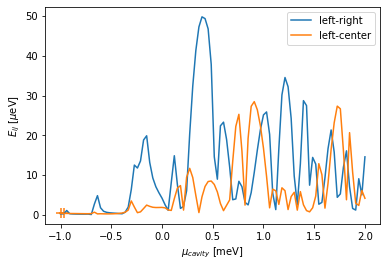

In [544]:
fig, ax = plt.subplots()
i = 0
for level in ens[:2]:
    ax.plot(1e3*mus_qd, 1e6*level, label=titles[i])
    i += 1
ax.scatter(1e3*mus_qd[peaks[1]], 1e6*level[peaks[1]], c='C1', marker='+', s=100)
ax.set_xlabel(r'$\mu_{cavity}$ [meV]')
ax.set_ylabel(r'$E_{ij}$ [$\mu$eV]')
ax.legend()

In [545]:
density = kwant.operator.Density(trijunction, np.eye(4))

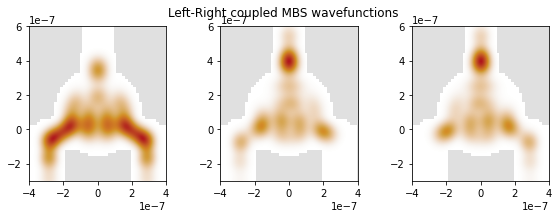

In [546]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(8, 3))
fig.tight_layout(h_pad=2, w_pad=2)
fig.suptitle(r'Left-Right coupled MBS wavefunctions')

i = 0
for ax in axes.flatten():
    kwant.plotter.density(trijunction, density(wfs[i, peaks[0][0]]), ax=ax)
    ax.set_ylim(-3e-7, 6e-7)
    ax.set_xlim(-4e-7, 4e-7)
    i += 1

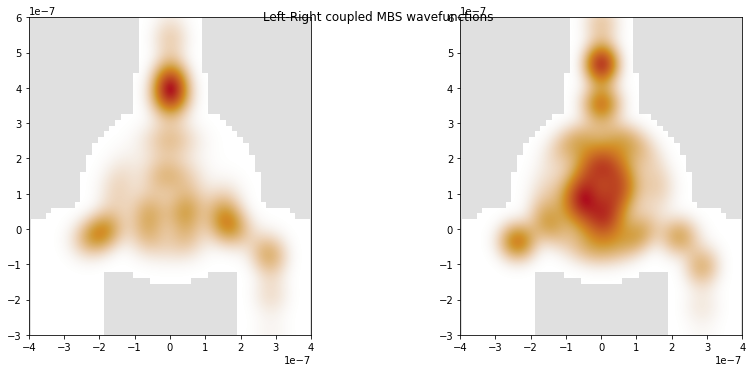

In [547]:
fig, axes = plt.subplots(nrows=1, ncols=n_peaks, figsize=(12, 5))
fig.tight_layout(h_pad=1, w_pad=2)
fig.suptitle(r'Left-Right coupled MBS wavefunctions')

i = 0
for ax in axes.flatten():
    kwant.plotter.density(trijunction, density(wfs[2, peaks[0][i]]), ax=ax)
    ax.set_ylim(-3e-7, 6e-7)
    ax.set_xlim(-4e-7, 4e-7)
    i += 1

# Comparison

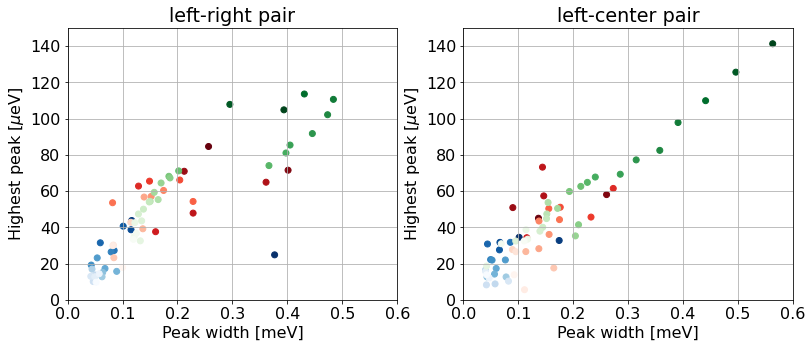

In [1745]:
widths_2d_geometries = [rectangle_1_w, circle_w, triangle_1_w]
peaks_2d_geometries = [rectangle_1_p, circle_p, triangle_1_p]
colors_2d_geometries = [rectangle_1_g/a, circle_g, 2*np.sqrt(np.abs(triangle_1_g/np.tan(np.pi/4)))]

cmaps = [plt.cm.get_cmap('Blues').reversed(),
         plt.cm.get_cmap('Reds').reversed(),
         plt.cm.get_cmap('Greens').reversed()]

cs = ['C0', 'Red', 'Green']
labels = ['Rectangle', 'Circle', 'Triangle 1 side']

pair = 0

fig, axes = plt.subplots(ncols=2, figsize=(13, 5))

for ax in axes.flatten()[:2]:
    plots = []
    cbs = []
    for g in range(3):
        plot = ax.scatter(2*widths_2d_geometries[g].T[pair],
                          1e6*peaks_2d_geometries[g].T[pair],
                          c=colors_2d_geometries[g],
                          cmap=cmaps[g])
        plots.append(plot)
    
    ax.set_xlabel(r'Peak width [meV]')
    ax.set_ylabel(r'Highest peak [$\mu$eV]')
    ax.set_title(titles[pair]+' pair')
    ax.set_xlim(0, 0.6)
    ax.set_ylim(0, 150)
    ax.grid()
    pair += 1
plt.savefig('../data/2d_couplings.pdf')

    #axes[1].scatter([0], [1000], c=cs[i], label=labels[i])
#axes[1].legend()
#
#cb.set_label(r'$R$ [nm]')

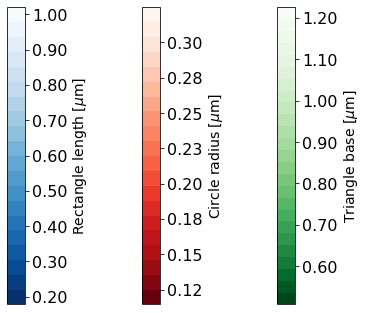

In [1746]:
cb_titles = [r'Rectangle length [$\mu$m]', r'Circle radius [$\mu$m]', r'Triangle base [$\mu$m]']

fig, axes = plt.subplots(figsize=(5, 5), ncols=3)
fig.tight_layout(w_pad=5)

i = 0
for ax in axes.flatten():
    cb = mpl.colorbar.ColorbarBase(ax=ax,
                                   cmap=cmaps[i],
                                   orientation='vertical',
                                   values=colors_2d_geometries[i]/100)
    cb.set_label(cb_titles[i], fontsize=14)
    cb.ax.yaxis.set_major_formatter(mpl.ticker.FormatStrFormatter('%.2f'))
    i += 1
plt.savefig('../data/2d_colorbars.pdf')

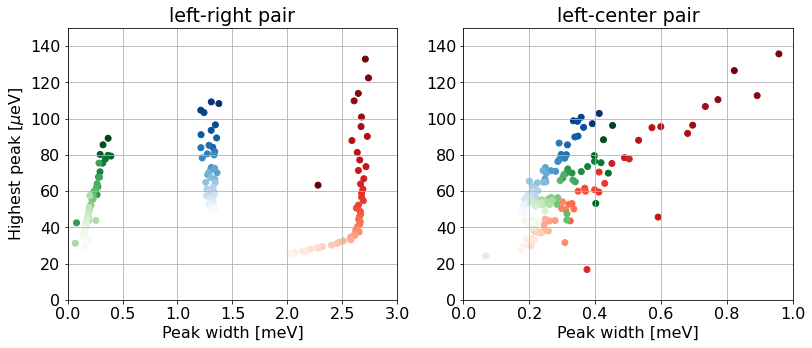

In [1749]:
ls = np.sqrt(y_size_g*np.tan(np.pi*0.23))
ws = np.sqrt(np.abs(y_size_g/np.tan(np.pi*0.23)))

widths_1d_geometries = [strip_size_w, ring_size_w, y_size_w]
peaks_1d_geometries = [strip_size_p, ring_size_p, y_size_p]
colors_1d_geometries = [strip_size_g/a, ring_size_g/a, np.sqrt(ls**2 + ws**2)]

cmaps = [plt.cm.get_cmap('Blues').reversed(),
         plt.cm.get_cmap('Reds').reversed(),
         plt.cm.get_cmap('Greens').reversed()]

cs = ['C0', 'Red', 'Green']
labels = ['Rectangle', 'Circle', 'Triangle 1 side']

pair = 0

fig, axes = plt.subplots(ncols=2, figsize=(13, 5))

for ax in axes.flatten()[:2]:
    plots = []
    cbs = []
    for g in range(3):
        plot = ax.scatter(2*widths_1d_geometries[g].T[pair],
                          1e6*peaks_1d_geometries[g].T[pair],
                          c=colors_1d_geometries[g],
                          cmap=cmaps[g])
        plots.append(plot)
    
    ax.set_xlabel(r'Peak width [meV]')
    ax.set_title(titles[pair]+' pair')
    ax.set_ylim(0, 150)
    ax.grid()
    pair += 1

axes[0].set_ylabel(r'Highest peak [$\mu$eV]')
axes[0].set_xlim(0, 3)
axes[1].set_xlim(0, 1)

plt.savefig('../data/1d_couplings.pdf')
    #axes[1].scatter([0], [1000], c=cs[i], label=labels[i])
#axes[1].legend()
#
#cb.set_label(r'$R$ [nm]')

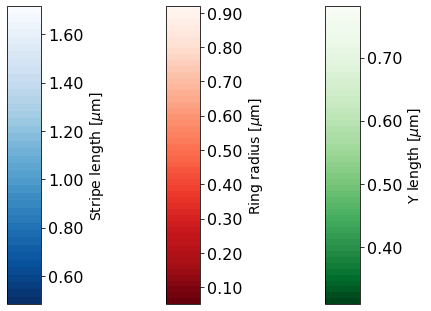

In [1751]:
cb_titles = [r'Stripe length [$\mu$m]', r'Ring radius [$\mu$m]', r'Y length [$\mu$m]']

fig, axes = plt.subplots(figsize=(6, 5), ncols=3)
fig.tight_layout(w_pad=5)

i = 0
for ax in axes.flatten():
    cb = mpl.colorbar.ColorbarBase(ax=ax,
                                   cmap=cmaps[i],
                                   orientation='vertical',
                                   values=colors_1d_geometries[i]/100)
    cb.set_label(cb_titles[i], fontsize=14)
    cb.ax.yaxis.set_major_formatter(mpl.ticker.FormatStrFormatter('%.2f'))
    i += 1
plt.savefig('../data/1d_colorbars.pdf')

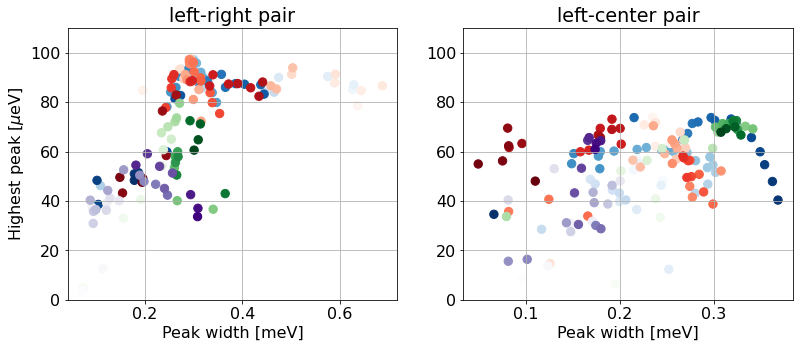

In [2403]:
angles = np.linspace(0.05, 0.3, 50)

widths_angles_geometries = [triangle_1_angle_w, triangle_2_angles_w, y_angle_w, circle_angle_w]
                            #, inverse_triangle_1_angle_w, inverse_triangle_2_angle_w]
    #, inverse_triangle_1_angle_p, inverse_triangle_2_angle_p]
peaks_angles_geometries = [triangle_1_angle_p, triangle_2_angles_p, y_angle_p, circle_angle_p]
cmaps = [plt.cm.get_cmap('Blues'),
         plt.cm.get_cmap('Reds'),
         plt.cm.get_cmap('Greens'),
         plt.cm.get_cmap('Purples')]
geometries = ['Leads one side', 'Leads both sides', 'Circle', 'Inv triangle 2']
markers = ['.', '+', 'x', '+']
pair = 0

fig, axes = plt.subplots(ncols=2, figsize=(13, 5))

for ax in axes.flatten()[:2]:
    plots = []
    cbs = []
    for g in range(4):
        if g < 2:
            angles = np.linspace(0.05, 0.3, 50)
        else:
            angles = np.linspace(0.05, 0.3, 25)

        plot = ax.scatter(2*widths_angles_geometries[g].T[pair],
                          1e6*peaks_angles_geometries[g].T[pair],
                          c=angles,
                          cmap=cmaps[g],
                          s=70)

        plots.append(plot)
    
    ax.set_xlabel(r'Peak width [meV]')
    ax.set_title(titles[pair]+' pair')
    ax.set_ylim(0, 110)
    ax.grid()
    pair += 1

axes[0].set_ylabel(r'Highest peak [$\mu$eV]')
#axes[0].set_xlim(0, 1)
#axes[1].set_xlim(0, 0.6)

plt.savefig('../data/angles_couplings.pdf')
    #axes[1].scatter([0], [1000], c=cs[i], label=labels[i])
#axes[1].legend()
#
#cb.set_label(r'$R$ [nm]')

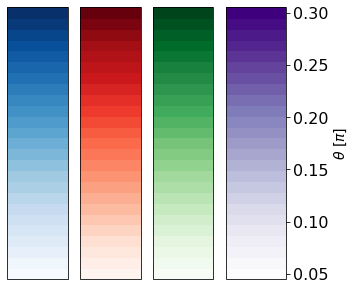

In [2401]:
cb_titles = [r'Stripe length [$\mu$m]', r'Ring radius [$\mu$m]', r'Y length [$\mu$m]']

fig, axes = plt.subplots(figsize=(5, 5), ncols=4)

i = 0
for ax in axes.flatten():
    cb = mpl.colorbar.ColorbarBase(ax=ax,
                                   cmap=cmaps[i],
                                   orientation='vertical',
                                   values=angles)
    #cb.set_label(cb_titles[i], fontsize=14)
    #cb.set_xticklabels([])
    cb.ax.yaxis.set_major_formatter(mpl.ticker.FormatStrFormatter('%.2f'))
    i += 1
    if i != 4:
        cb.set_ticks([])
    else:
        cb.set_label(r'$\theta$ [$\pi$]', fontsize=14)
plt.savefig('../data/angles_colorbars.pdf')

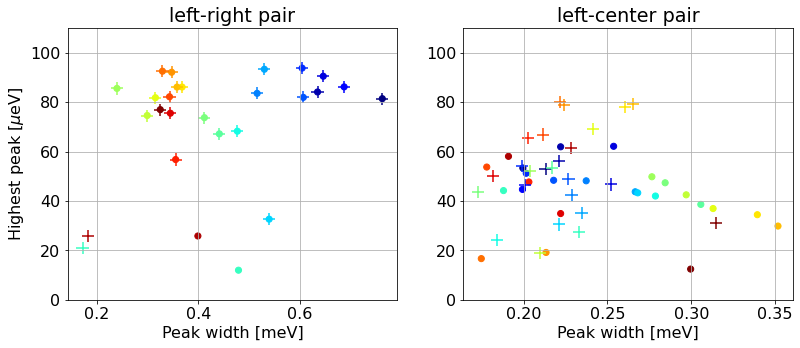

In [2350]:
angles = np.linspace(0.05, 0.3, 25)

widths_angles_geometries = [inverse_triangle_1_angle_w, inverse_triangle_2_angle_w]
                            #, inverse_triangle_1_angle_w, inverse_triangle_2_angle_w]
    #, inverse_triangle_1_angle_p, inverse_triangle_2_angle_p]
peaks_angles_geometries = [inverse_triangle_1_angle_p, inverse_triangle_2_angle_p]
geometries = ['Inv triangle 1', 'Inv triangle 2']
markers = ['.', '+', '.', '+']
pair = 0

fig, axes = plt.subplots(ncols=2, figsize=(13, 5))

for ax in axes.flatten()[:2]:
    plots = []
    cbs = []
    for g in range(2):
        plot = ax.scatter(2*widths_angles_geometries[g].T[pair],
                          1e6*peaks_angles_geometries[g].T[pair],
                          c=angles,
                          cmap=plt.cm.get_cmap('jet'),
                          marker=markers[g],
                          s=150,label=geometries[g])

        plots.append(plot)
    
    ax.set_xlabel(r'Peak width [meV]')
    ax.set_title(titles[pair]+' pair')
    ax.set_ylim(0, 110)
    ax.grid()
    pair += 1

axes[0].set_ylabel(r'Highest peak [$\mu$eV]')
#axes[0].set_xlim(0, 1)
#axes[1].set_xlim(0, 0.6)

plt.savefig('../data/1d_couplings.pdf')
    #axes[1].scatter([0], [1000], c=cs[i], label=labels[i])
#axes[1].legend()
#
#cb.set_label(r'$R$ [nm]')

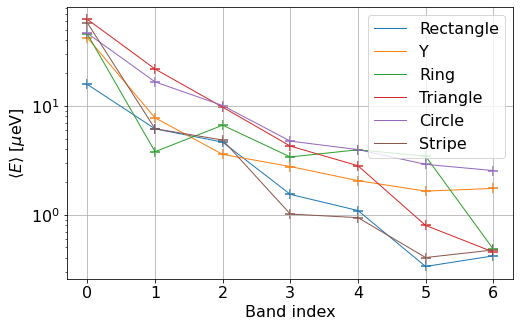

In [2134]:
band_averages = [
    rectangle_band_averages, Y_band_averages, ring_band_averages, triangle_1_band_averages, circle_band_averages, strip_band_averages
]
geometries = ['Rectangle', 'Y', 'Ring', 'Triangle', 'Circle', 'Stripe']

fig, ax = plt.subplots(figsize=(8, 5))
bands = range(7)
g = 0
for geometry in band_averages:
    pair = 0
    ax.scatter(bands, 1e6*np.mean(geometry, axis=1), marker='+', s=100)
    ax.plot(bands, 1e6*np.mean(geometry, axis=1), label=geometries[g], linewidth=1)
    g += 1
ax.grid()
ax.set_yscale('log')
ax.set_ylabel(r'$\langle E\rangle$ [$\mu$eV]')
ax.set_xlabel(r'Band index')
ax.legend()
plt.savefig('../data/sub_bands_results.pdf')

In [1987]:
geometry.shape

(7, 3)

In [1901]:
Y_band_averages

array([[3.92246288e-05, 4.36543189e-05, 4.36543189e-05],
       [1.70344967e-05, 3.11851639e-06, 3.11851639e-06],
       [3.89564525e-06, 3.42011249e-06, 3.42011249e-06],
       [5.77406637e-06, 1.26585842e-06, 1.26585842e-06],
       [2.57409848e-06, 1.79303374e-06, 1.79303374e-06],
       [2.01767867e-06, 1.46023957e-06, 1.46023957e-06],
       [1.85539140e-06, 1.68500024e-06, 1.68500024e-06]])

In [1902]:
strip_band_averages

array([[3.92246288e-05, 4.36543189e-05, 4.36543189e-05],
       [1.70344967e-05, 3.11851639e-06, 3.11851639e-06],
       [3.89564525e-06, 3.42011249e-06, 3.42011249e-06],
       [5.77406637e-06, 1.26585842e-06, 1.26585842e-06],
       [2.57409848e-06, 1.79303374e-06, 1.79303374e-06],
       [2.01767867e-06, 1.46023957e-06, 1.46023957e-06],
       [1.85539140e-06, 1.68500024e-06, 1.68500024e-06]])

In [2071]:
angles

array([0.05      , 0.06041667, 0.07083333, 0.08125   , 0.09166667,
       0.10208333, 0.1125    , 0.12291667, 0.13333333, 0.14375   ,
       0.15416667, 0.16458333, 0.175     , 0.18541667, 0.19583333,
       0.20625   , 0.21666667, 0.22708333, 0.2375    , 0.24791667,
       0.25833333, 0.26875   , 0.27916667, 0.28958333, 0.3       ])